# Capstone Project: Create a Customer Segmentation Report for Arvato Financial Services

In this Udacity capstone project, we will analyse demographics data for customers of a mail-order sales company in Germany, comparing it against demographics information for the general population. We'll use unsupervised learning techniques to perform customer segmentation, identifying the parts of the population that best describe the core customer base of the company. Then, we'll apply what we've learned on a third dataset with demographics information for targets of a marketing campaign for the company, and use a model to predict which individuals are most likely to convert into becoming customers for the company. The data that we will use has been provided by our partners at Bertelsmann Arvato Analytics, and represents a real-life data science task. The versions of those two datasets used in this project include many features and have not been pre-cleaned.

For this classification prediction, we start with the ETL (Extract, Transform, Load) pipeline including EDA (Exploratory Data Analysis) activities, the customer segmentation to build appropriate clusters, followed by the ML (Machine Learning) pipeline for the investigated prediction models. 

My own additional comment(March/April 2020):<br>
In general, I would separate the tasks having 2 notebook files, but implementing such approach it is necessary to store the modified datasets as a new SQL database each. This was not possible with my own equipment, it crashed with memory errors, therefore everything must be implemented in this one notebook file. An ML cloud service has not been available, because of regional unstable internet connections having a much, much higher trafic compared to other, pre-pandemic SARS-CoV-2 times. As a consequence, the dereferencing of variables not needed anymore, to improve garbage collection is implemented often.

Another consequence exists for the pipeline approach used in general: I tried to use one whole pipeline approach with cross-validation for hyperparameter tuning of data transformation, scaling, dimensionality reduction and clustering. My system (32GB RAM) running only this task crashed after several days of pipeline fit. Therefore I tried to use a pipeline for imputation and scaling resp. the dimensionality reduction as a single step, but the system crashed again during dimensionality reductions fit method after several days. Therefore I have used a loop to test each single parameter value alone to find the best configuration set. This took a long time and is not the preferred process.


### Table of Content
This notebook includes the ETL, the unsupervised learning, the supervised learning and the Kaggle competition ranking part of the project.

**Part 1: ETL, Unsupervised Learning:**<br>
* [1. Data Wrangling](#1.) - with import libraries, gather datasets and first cleaning activities
* [2. EDA](#2.) - with data exploration including statistics and visualisations, starting general feature engineering
* [3. Further Feature Engineering](#3.) - additional feature preparation necessary for our customer segmentation and prediction models; it includes the final row handling as well
* [4. Load](#4.) - we save the cleaned datasets in SQL databases
* [5. Customer Segmentation Report](#5.) - unsupervised learning task to create the customer segmentation

**Part 2: Supervised Learning Model:**<br>


**Part 3: Kaggle Competition:**<br>


---

# Part 1: ETL, Unsupervised Learning

<a id='1.'></a>
## 1. Data Wrangling
In this section of the project, after libraries import, the datasets are loaded, a brief overview of the data structure is given and the general properties of the data are checked and cleaned if necessary.

### 1.0 Import Libraries and Load Datasets
There are four data files associated with this project:

- `Udacity_AZDIAS_052018.csv`: Demographics data for the general population of Germany; 891 211 persons (rows) x 366 features (columns).
- `Udacity_CUSTOMERS_052018.csv`: Demographics data for customers of a mail-order company; 191 652 persons (rows) x 369 features (columns).
- `Udacity_MAILOUT_052018_TRAIN.csv`: Demographics data for individuals who were targets of a marketing campaign; 42 982 persons (rows) x 367 (columns).
- `Udacity_MAILOUT_052018_TEST.csv`: Demographics data for individuals who were targets of a marketing campaign; 42 833 persons (rows) x 366 (columns).

Each row of the demographics files represents a single person, but also includes information outside of individuals, including information about their household, building, and neighbourhood. Use the information from the first two files to figure out how customers ("CUSTOMERS") are similar to or differ from the general population at large ("AZDIAS"), then use your analysis to make predictions on the other two files ("MAILOUT"), predicting which recipients are most likely to become a customer for the mail-order company.

The "CUSTOMERS" file contains three extra columns ('CUSTOMER_GROUP', 'ONLINE_PURCHASE', and 'PRODUCT_GROUP'), which provide broad information about the customers depicted in the file. The original "MAILOUT" file included one additional column, "RESPONSE", which indicated whether or not each recipient became a customer of the company. For the "TRAIN" subset, this column has been retained, but in the "TEST" subset it has been removed; it is against that withheld column that your final predictions will be assessed in the Kaggle competition.

Otherwise, all of the remaining columns are the same between the three data files. For more information about the columns depicted in the files, you can refer to <i>two Excel spreadsheets</i> provided in the workspace. One of them (./data/DIAS Information Levels - Attributes 2017.xlsx) is a top-level list of attributes and descriptions, organised by informational category. The other (./data/DIAS Attributes - Values 2017.xlsx) is a detailed mapping of data values for most of the features in alphabetical order.

In the below cell, we've provided some code to load in the first two datasets. Note for all of the `.csv` data files in this project that they're semicolon (`;`) delimited, so an additional argument in the [`read_csv()`](https://pandas.pydata.org/pandas-docs/stable/generated/pandas.read_csv.html) call has been included to read in the data properly. Also, considering the size of the datasets, it may take some time for them to load completely.

Udacity hint:<br>
You'll notice when the data is loaded in that a warning message will immediately pop up. Before we really start digging into the modeling and analysis, you're going to perform some cleaning. Take some time to browse the structure of the data and look over the informational spreadsheets to understand the data values. Make some decisions on which features to keep, which features to drop, and if any revisions need to be made on data formats. It'll be a good idea to create a function with pre-processing steps, since you'll need to clean all of the datasets before you work with them.

My additional notes:<br>
- A general introduction to feature engineering or feature selection is given by the 'machine learning mastery' blog posts of [Jason Brownlee](https://machinelearningmastery.com/an-introduction-to-feature-selection/). We want to get the best features out of our raw data as input for our prediction models representing the best solution for the given domain question or problem. In several blog posts he explains how to transform our raw data, so, we can reach our goal: to predict our classification task with the most useful set of features for the best found machine learning model.
- Not all feature attributes are explained in this DIAS attributes value file. Some of them don't exist in the .csv file and some are not explained at all. Further information is given below in this notebook file.
- Having investigated the Excel file information manually: it seems as if nearly all features are already grouped and mapped to integer labels mostly between 0 and 10, so, label encoding has already happened and they are discrete. The categorical ones (except one feature) are mapped to numbers, some of them with an inherent order (ordinal - categorically ordered) and some without (nominal - categorically unordered). Only 4 features are grouped more detailed and having mappings up to 45. We will see, if they are important and if they have to be modified to a smaller set of bins. Furthermore, having nominal and ordinal categorical features, their values (both mostly between 0 and 10) are not comparable. We have to create new features, called dummy features, for each unique value or category of the predictors. This new ones are binary features including the values 0 and 1 only. The 1 value represents the only active state of the associated dummy feature label. Remember, investigating feature correlation has to be done before, because all this belonging dummy feature groups are highly correlated by concept. Additionally, one-hot-encoding will expand the feature space dramatically.
- The general population file is used to find the most important features, means it is our 'training' set and we do transformations there to get the dimensionality reduction result before clustering. The encoding leads to a huge amount of features and we have to deal with the ['curse of dimensionality'](https://en.wikipedia.org/wiki/Curse_of_dimensionality). A good overview about the handling delivers the article of [Nguyen, Holmes](https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1006907).
- A general approach of categorical data handling is e.g. introduced in the medium blog post of [Dipanjan Sarkar](https://towardsdatascience.com/understanding-feature-engineering-part-2-categorical-data-f54324193e63).
- In general, we are dealing with mixed feature types, high feature dimensionality and having an unsupervised clustering task to find similar customer segments of the general population azdias dataset as new information, using such modified dataset to improve the supervised classification prediction. Regarding the unsupervised part: k-means is working best with numerical features with Euclidian distance, which is not the best for categorical features and therefore we could consider other algorithms as well after feature modifications: e.g. k-modes or another distance measure if available for Python, the Gower distance, or an appropriate Python clustering algorithm after feature reduction. Another option is that we transform the feature values to appropriate numerical ones before we do dimensionality reduction and clustering. E.g. it is expected that not all feature values are stored as number data types, so, with string feature values further modifications are necessary having only numbers for dimensionality reduction, clustering and prediction.
- Regarding the dimensionality reduction algorithms: e.g. PCA is representing the general data structure (for continous data and Euclidian distance) and t-SNE is better at representing local interactions (see: van der Maaten LJP, Hinton G. Visualizing Data using t-SNE. Journal of Machine Learning Research. 2008;9:2579–2605). Both are building a model of our matrix data stored as Python DataFrame instances. We are interested in a global structure and clustering, therefore we prefer the PCA approach to uncover all the latent variables resp. hidden variables and use this as the input of a specific clustering algorithm. Reason for that is: t-SNE would distroy distance information necessary for clustering calculation.<br>
For PCA usage, we have to take care of the data structure, it should be normal distributed. If the matrix is a sparse one, it is better to use a scikit-learn TruncatedSVD object instance.<br>
Another feature selection approach would be to use an embedded method by model. Independent from the selected concept, our goal is not to get bias in our prediction models to avoid overfitting at the end.
- Numbers are given with US number format, not the European one (means we don't deal with local aspects of comma and point which in general should be the case for number or string-to-number datatype conversion); internationalisation has not been taken into account; no usage of:<br>
<i>import locale</i><br>
<i>locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')</i><br>
<i>locale.atof('string-number')</i>   # returns float<br>
<i>int(locale.atof('string-number'))</i>   # returns int

So, in general regarding this datasets, it is important to do an appropriate feature modification, selection and dimensionality reduction, because
- it simplifies the model creation and the final model is easier to interpret
- it prevents overfitting; a high dimensional dataset leads to the effect that the model captures real and random noise information
- it is more time efficient, because the model training needs lower computational performance.

Regarding the dimensionality reduction, having the most prominent components, we reengineer some dataset features knowing the customer properties by proper feature names.<br>
After having done the transformation and dimensionality reduction, we do the clustering as the final step of the unsupervised learning.

In [1]:
# import libraries
import numpy as np
import pandas as pd
import math as ma
import scipy.stats as st
import pickle   # not possible with 8GB RAM: memory errors
import re
import sys
import missingno as msno
import pandas.util.testing as tm
import progressbar  # text progressbar library V2.5
from datetime import timezone
from subprocess import call

# python file including MCAR class and helper functions, no one with underscores (wildcard possible)
from utils import *

# decorator handling
import functools
import time

# for ETL and ML model parts
import sklearn
from pyclustertend import hopkins
from sklearn import set_config  # necessary to display pipeline diagrams of created estimators
from sklearn.experimental import enable_iterative_imputer, enable_hist_gradient_boosting
from sklearn.impute import SimpleImputer, IterativeImputer, KNNImputer
from sklearn.linear_model import BayesianRidge
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import scale, StandardScaler, MinMaxScaler, RobustScaler, OneHotEncoder
from sklearn.decomposition import PCA, SparsePCA, TruncatedSVD
from sklearn.cluster import KMeans, MiniBatchKMeans #, Birch (not possible: memory error with 32GB RAM)
from sklearn.mixture import GaussianMixture
from sklearn import metrics
from sklearn.metrics import silhouette_score, roc_curve, make_scorer, accuracy_score, mean_squared_error
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, RepeatedStratifiedKFold, train_test_split, cross_val_score, learning_curve
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, HistGradientBoostingClassifier, ExtraTreesRegressor

# for clustering part
from random import randint
from scipy.spatial.distance import cdist

# other boosting libraries
#!pip install xgboost
import xgboost
from xgboost import XGBClassifier

#!pip install lightgbm
import lightgbm
from lightgbm import LGBMClassifier

# for storage of the cleaned dataset in an SQL database
from sqlalchemy import create_engine   # not possible: memory errors

# for visualisations code
from IPython.display import display # Allows the use of display() for DataFrames
import seaborn as sns
sns.set('notebook')
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline

# suppress matplotlib user warnings
import warnings
warnings.filterwarnings("ignore", category = UserWarning, module = "matplotlib")

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
# check python and pandas version; implementation with Python 3.7.6 and Pandas 1.0.1
print("Versioning:")
print("Python: {}".format(sys.version))
print("Pandas: {}".format(pd.__version__))
print("XGBoost: {}".format(xgboost.__version__))
print("LichtGBM: {}".format(lightgbm.__version__))
print("SciKit-Learn: {}".format(sklearn.__version__))
print("Progressbar: {}".format(progressbar.__version__))

Versioning:
Python: 3.7.3 (default, Apr 24 2019, 15:29:51) [MSC v.1915 64 bit (AMD64)]
Pandas: 1.0.3
XGBoost: 1.0.2
LichtGBM: 2.3.1
SciKit-Learn: 0.22.2.post1


In [3]:
#
# time decorator (basic coding see decorator tutorial from RealPython);
# functools usable only with installed build tools for Microsoft Visual Studio:
# https://visualstudio.microsoft.com/   and their: download section for build tools
#
def timer(func):
    '''
    Print the runtime of the decorated function;
    add @timer just before the decorated function
    
    input: the decorated function generalised by func param
    output: calculated time frame the associated function needed to work on
            and wrapper_timer as mandatory return value from decorator function
    '''
    
    @functools.wraps(func)
    def wrapper_timer(*arg, **kwargs):
        start_time = time.perf_counter()
        value = func(*arg, **kwargs)
        end_time = time.perf_counter()
        run_time = end_time - start_time
        print(f"Finished {func.__name__!r} in {run_time:.4f} secs or {run_time/60:.4f} min.")
        return value
    return wrapper_timer

In [4]:
# often working with np numbers, make them reproducible
np.random.seed(42)

In [5]:
# load in the data
# files from a German company: there Microsoft delivers MS tools with default separator ';'
#
# https://ipython.readthedocs.io/en/stable/interactive/magics.html?highlight=%25time#magic-time

try:
    %time azdias = pd.read_csv('./data/Udacity_AZDIAS_052018.csv', sep=';')
    %time customers = pd.read_csv('./data/Udacity_CUSTOMERS_052018.csv', sep=';')
    
    # delete the unnamed columns of the files to get the df structure numbers mentioned above
    del azdias['Unnamed: 0']
    del customers['Unnamed: 0']
    
    # success
    print("\nThe 'azdias' dataset has {} samples with {} features each.".format(*azdias.shape))
    print("The 'customers' dataset has {} samples with {} features each.".format(*customers.shape))
except:
    print("Datasets could not be loaded. Are the datasets missing?")

<string>:2: DtypeWarning: Columns (19,20) have mixed types.Specify dtype option on import or set low_memory=False.


Wall time: 32.2 s
Wall time: 6.33 s

The 'azdias' dataset has 891221 samples with 366 features each.
The 'customers' dataset has 191652 samples with 369 features each.


And as we investigated already manually, there are German column labels which are not explained in the mentioned Excel files. Here are some additional explanations. 

Attributes:
- ALTER_KIND1 - age of child no. 1
- ALTER_KIND2 - age of child no. 2
- ALTER_KIND3 - age of child no. 3
- ALTER_KIND4 - age of child no. 4
- ALTERKATEGORIE_FEIN - age categories ('fein' in this case I guess means a more specific classification)
- ANZ_KINDER - no. of children
- ANZ_STATISTISCHE_HAUSHALTE - in Germany a census data is given about statistical households, here its number is counted
- ARBEIT - work
- D19_KONSUMTYP_MAX - what kind of consumption type you are
- D19_LETZTER_KAUF_BRANCHE - the last date you bought something and info about category/segment
- D19_VERSI_DATUM - insurance date
- D19_VERSI_OFFLINE_DATUM - insurance date offline
- D19_VERSI_ONLINE_DATUM - insurance date online
- D19_VERSI_ONLINE_QUOTE_12 - insurance online quote in the last 12 month 
- DSL_FLAG - what kind of DSL are you using/ are you in (unfortunately some German regions are still IT medieval, not having a stable internet)
- EINGEFUEGT_AM - inserted on
- EINGEZOGEN_HH_JAHR - moved to household in year <yyyy>
- FIRMENDICHTE - company density
- KOMBIALTER - 'Kombi' means combination and 'Alter' is age
- STRUKTURTYP - what kind of structural type you are
- UMFELD_ALT - surrounding/neighbourhood is old
- UMFELD_JUNG - surrounding/neighbourhood is young
- VERDICHTUNGSRAUM - urban agglomeration
- VERS_TYP - what kind of insurance type you are
    
What kind of attribute information is stored in the delivered DIAS attributes Excel file?

In [6]:
#!pip install xlrd  # necessary for reading excel files
# first row of the excel file is empty, second includes the header names
try:
    %time df_dias_attr = pd.read_excel('./data/DIAS Attributes - Values 2017.xlsx', header=1)
    
    # success
    print("The 'DIAS Attributes - Values 2017' file has {} samples with {} features each.".
          format(*df_dias_attr.shape))
except:
    print("DIAS Attributes - Values 2017.xlsx could not be loaded. Is the Excel file missing?")

Wall time: 3.09 s
The 'DIAS Attributes - Values 2017' file has 2258 samples with 5 features each.


Download of the DIAS information file ...

In [7]:
# first row of the excel file is empty, second includes the header names
try:
    %time df_dias_infolevel = pd.read_excel('./data/DIAS Information Levels - Attributes 2017.xlsx', header=1)
    df_dias_infolevel.drop(columns=['Unnamed: 0', 'Additional notes'], inplace=True)
    
    # success
    print("The 'DIAS Information Levels - Attributes 2017' file has {} samples with {} features each.".
          format(*df_dias_infolevel.shape))   
except:
    print("DIAS Information Levels - Attributes 2017.xlsx could not be loaded. Is the Excel file missing?")

Wall time: 156 ms
The 'DIAS Information Levels - Attributes 2017' file has 313 samples with 3 features each.


### 1.1 General Overview
#### 1.1.0 Excel file 'DIAS Attributes - Values 2017.xlsx'

In [8]:
df_dias_attr.head()

,Unnamed: 0,Attribute,Description,Value,Meaning
0,NaN,AGER_TYP,best-ager typology,-1,unknown
1,NaN,NaN,NaN,0,no classification possible
2,NaN,NaN,NaN,1,passive elderly
3,NaN,NaN,NaN,2,cultural elderly
4,NaN,NaN,NaN,3,experience-driven elderly


In [9]:
# drop the unnamed column and fill the attribute rows, so, 'Value' and 'Meaning' can be used everywhere
df_dias_attr.drop(columns=['Unnamed: 0', 'Description'], inplace=True)
# modify the 'Attribute' NaN's with the value given before
df_dias_attr['Attribute'] = df_dias_attr['Attribute'].fillna(method='ffill')

In [10]:
df_dias_attr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2258 entries, 0 to 2257
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Attribute  2258 non-null   object
 1   Value      2258 non-null   object
 2   Meaning    2247 non-null   object
dtypes: object(3)
memory usage: 53.0+ KB


In [11]:
df_dias_attr.head(10)

,Attribute,Value,Meaning
0,AGER_TYP,-1,unknown
1,AGER_TYP,0,no classification possible
2,AGER_TYP,1,passive elderly
3,AGER_TYP,2,cultural elderly
4,AGER_TYP,3,experience-driven elderly
5,ALTERSKATEGORIE_GROB,"-1, 0",unknown
6,ALTERSKATEGORIE_GROB,1,< 30 years
7,ALTERSKATEGORIE_GROB,2,30 - 45 years
8,ALTERSKATEGORIE_GROB,3,46 - 60 years
9,ALTERSKATEGORIE_GROB,4,> 60 years


As we can see, these attributes are categorical features with ordinal, inherent ordered integer mapping. 

There are 11 attributes not having a meaning, which ones?

In [12]:
df_dias_attr.loc[df_dias_attr['Meaning'].isna()]

,Attribute,Value,Meaning
1906,LP_FAMILIE_GROB,4,NaN
1907,LP_FAMILIE_GROB,5,NaN
1909,LP_FAMILIE_GROB,7,NaN
1910,LP_FAMILIE_GROB,8,NaN
1912,LP_FAMILIE_GROB,10,NaN
1913,LP_FAMILIE_GROB,11,NaN
1977,LP_STATUS_GROB,2,NaN
1979,LP_STATUS_GROB,4,NaN
1980,LP_STATUS_GROB,5,NaN
1982,LP_STATUS_GROB,7,NaN


In [13]:
attr_value_group = df_dias_attr.groupby(['Attribute'])['Value'].count()
attr_value_group

Attribute
AGER_TYP                 5
ALTERSKATEGORIE_GROB     6
ALTER_HH                22
ANREDE_KZ                3
ANZ_HAUSHALTE_AKTIV      1
                        ..
WACHSTUMSGEBIET_NB       6
WOHNDAUER_2008          10
WOHNLAGE                 9
W_KEIT_KIND_HH           7
ZABEOTYP                 7
Name: Value, Length: 314, dtype: int64

How many attributes are there with different values >15?

In [14]:
pd.DataFrame(attr_value_group).query("Value > 15")

,Value
Attribute,
ALTER_HH,22
CAMEO_DEUINTL_2015,26
CAMEO_DEU_2015,44
LP_LEBENSPHASE_FEIN,40
PRAEGENDE_JUGENDJAHRE,16


We have to take of features with to detailed value information, at least with 'CAMEO_DEU_2015' and 'LP_LEBENSPHASE_FEIN'. Note: Further investigation has shown, that the column CAMEO_DEUINTL_2015 does not exist in the datasets.

#### 1.1.1 Excel file 'DIAS Information Levels - Attributes 2017.xlsx'
Regarding the second delivered Excel file we can categorise such 'Attribute' values to a given information level grouping several attributes together.

In [15]:
df_dias_infolevel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 313 entries, 0 to 312
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Information level  10 non-null     object
 1   Attribute          313 non-null    object
 2   Description        313 non-null    object
dtypes: object(3)
memory usage: 7.5+ KB


In [16]:
df_dias_infolevel.head(20)

,Information level,Attribute,Description
0,NaN,AGER_TYP,best-ager typology
1,Person,ALTERSKATEGORIE_GROB,age through prename analysis
2,NaN,ANREDE_KZ,gender
3,NaN,CJT_GESAMTTYP,Customer-Journey-Typology relating to the pref...
4,NaN,FINANZ_MINIMALIST,financial typology: low financial interest
5,NaN,FINANZ_SPARER,financial typology: money saver
6,NaN,FINANZ_VORSORGER,financial typology: be prepared
7,NaN,FINANZ_ANLEGER,financial typology: investor
8,NaN,FINANZ_UNAUFFAELLIGER,financial typology: unremarkable
9,NaN,FINANZ_HAUSBAUER,financial typology: main focus is the own house


In the 'Information level' column the AGER_TYP has not been mapped to the 'Person' level. Therefore the other levels are controlled manually in the Excel file. Some attributes are not properly set for the level 'Microcell (RR3_ID)' as well, which are: KBA05_ALTER1, KBA05_ALTER2, KBA05_ALTER3, KBA05_ALTER4, KBA05_ANHANG, KBA05_ANTG1, KBA05_ANTG2, KBA05_ANTG3, KBA05_ANTG4. We add the appropriate information level for these attributes first, and use the appropriate fill method afterwards.

In [17]:
# AGER_TYP: we want to change only the first NaN with a bfill method
df_dias_infolevel.fillna(method='bfill', limit=1, inplace=True)

What are the index values of the rows with attributes KBA05_ALTER1, KBA05_ALTER2, KBA05_ALTER3, KBA05_ALTER4, KBA05_ANHANG, KBA05_ANTG1, KBA05_ANTG2, KBA05_ANTG3 and KBA05_ANTG4?

In [18]:
df_dias_infolevel.loc[df_dias_infolevel["Attribute"] == 'KBA05_ALTER1']

,Information level,Attribute,Description
88,NaN,KBA05_ALTER1,share of car owners less than 31 years old


In [19]:
df_dias_infolevel.loc[88:97, 'Information level'] = 'Microcell (RR3_ID)'

In [20]:
df_dias_infolevel.head(97)

,Information level,Attribute,Description
0,Person,AGER_TYP,best-ager typology
1,Person,ALTERSKATEGORIE_GROB,age through prename analysis
2,NaN,ANREDE_KZ,gender
3,NaN,CJT_GESAMTTYP,Customer-Journey-Typology relating to the pref...
4,NaN,FINANZ_MINIMALIST,financial typology: low financial interest
...,...,...,...
92,Microcell (RR3_ID),KBA05_ANHANG,share of trailers in the microcell
93,Microcell (RR3_ID),KBA05_ANTG1,number of 1-2 family houses in the cell
94,Microcell (RR3_ID),KBA05_ANTG2,number of 3-5 family houses in the cell
95,Microcell (RR3_ID),KBA05_ANTG3,number of 6-10 family houses in the cell


In [21]:
# no replace the remaining NaNs and control that all 313 rows are filled
df_dias_infolevel.fillna(method='ffill', inplace=True)

In [22]:
df_dias_infolevel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 313 entries, 0 to 312
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Information level  313 non-null    object
 1   Attribute          313 non-null    object
 2   Description        313 non-null    object
dtypes: object(3)
memory usage: 7.5+ KB


In [22]:
df_dias_infolevel.head(10)

,Information level,Attribute,Description
0,Person,AGER_TYP,best-ager typology
1,Person,ALTERSKATEGORIE_GROB,age through prename analysis
2,Person,ANREDE_KZ,gender
3,Person,CJT_GESAMTTYP,Customer-Journey-Typology relating to the pref...
4,Person,FINANZ_MINIMALIST,financial typology: low financial interest
5,Person,FINANZ_SPARER,financial typology: money saver
6,Person,FINANZ_VORSORGER,financial typology: be prepared
7,Person,FINANZ_ANLEGER,financial typology: investor
8,Person,FINANZ_UNAUFFAELLIGER,financial typology: unremarkable
9,Person,FINANZ_HAUSBAUER,financial typology: main focus is the own house


How many attributes are mapped to each information level item?

In [23]:
df_dias_infolevel.groupby(['Information level'])['Attribute'].count()

Information level
125m x 125m Grid       33
Building               10
Community               6
Household              32
Microcell (RR3_ID)     63
Microcell (RR4_ID)      4
PLZ8                  114
Person                 42
Postcode                4
RR1_ID                  5
Name: Attribute, dtype: int64

Note: For the specific categorical features, we need to investigate their granularity resp. cardinality. If it is too much, this is a hint to drop such feature as well or to do further grouping. Regarding the information level, we should investigate the associated features as a group of its own. E.g. the PLZ8 level includes 114 features, perhaps there are some redundant attributes or some with high correlations or we even don't need such kind of infolevel grouping.

Now, we investigate the intersection and the difference of attributes in both Excel information files.

In [24]:
len(df_dias_attr['Attribute'].unique())

314

In [25]:
attr_both = np.intersect1d(df_dias_infolevel['Attribute'].unique(), df_dias_attr['Attribute'].unique())
print("\033[1mElements being part of both attribute arrays:\033[0m")
attr_both

Elements being part of both attribute arrays:


array(['AGER_TYP', 'ALTERSKATEGORIE_GROB', 'ALTER_HH', 'ANREDE_KZ',
       'ANZ_HAUSHALTE_AKTIV', 'ANZ_HH_TITEL', 'ANZ_PERSONEN', 'ANZ_TITEL',
       'BALLRAUM', 'CAMEO_DEUG_2015', 'CAMEO_DEUINTL_2015',
       'CAMEO_DEU_2015', 'CJT_GESAMTTYP', 'D19_BANKEN_DATUM',
       'D19_BANKEN_DIREKT_RZ', 'D19_BANKEN_GROSS_RZ',
       'D19_BANKEN_LOKAL_RZ', 'D19_BANKEN_OFFLINE_DATUM',
       'D19_BANKEN_ONLINE_DATUM', 'D19_BANKEN_ONLINE_QUOTE_12',
       'D19_BANKEN_REST_RZ', 'D19_BEKLEIDUNG_GEH_RZ',
       'D19_BEKLEIDUNG_REST_RZ', 'D19_BILDUNG_RZ', 'D19_BIO_OEKO_RZ',
       'D19_BUCH_RZ', 'D19_DIGIT_SERV_RZ', 'D19_DROGERIEARTIKEL_RZ',
       'D19_ENERGIE_RZ', 'D19_FREIZEIT_RZ', 'D19_GARTEN_RZ',
       'D19_GESAMT_DATUM', 'D19_GESAMT_OFFLINE_DATUM',
       'D19_GESAMT_ONLINE_DATUM', 'D19_GESAMT_ONLINE_QUOTE_12',
       'D19_HANDWERK_RZ', 'D19_HAUS_DEKO_RZ', 'D19_KINDERARTIKEL_RZ',
       'D19_KK_KUNDENTYP', 'D19_KONSUMTYP', 'D19_KOSMETIK_RZ',
       'D19_LEBENSMITTEL_RZ', 'D19_NAHRUNGSERGAENZUNG

In [26]:
len(attr_both)

300

Which attribute features are not part of the information level file?

In [27]:
list_clms_infodiff = set(df_dias_attr['Attribute'].unique()).difference(attr_both)
list_clms_infodiff

{'BIP_FLAG',
 'D19_BANKEN_ANZ_12',
 'D19_BANKEN_ANZ_24',
 'D19_GESAMT_ANZ_12',
 'D19_GESAMT_ANZ_24',
 'D19_LOTTO_RZ',
 'D19_TELKO_ANZ_12',
 'D19_TELKO_ANZ_24',
 'D19_VERSAND_ANZ_12',
 'D19_VERSAND_ANZ_24',
 'D19_VERSI_ANZ_12',
 'D19_VERSI_ANZ_24',
 'KBA13_CCM_3000',
 'KBA13_CCM_3001'}

By now, we don't know if this list of features is important or if it has been added to the DIAS attribute file afterwards being redundant to other features (could be the case e.g. for both last ones about car properties). We even don't know it they exist in our datasets about general population and customers.

Now, before doing further exploration, we create copies of the dataframes.

In [40]:
# preserve the original files
azdias_orig = azdias.copy()
customers_orig = customers.copy()

#### 1.1.2 General population dataset 'azdias'

In [29]:
%time azdias.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891221 entries, 0 to 891220
Columns: 366 entries, LNR to ALTERSKATEGORIE_GROB
dtypes: float64(267), int64(93), object(6)
memory usage: 2.4+ GB
Wall time: 78.1 ms


In [30]:
# modify the visualisation of the dataframe columns to see more
pd.set_option('display.max_columns', 370)
azdias.head()

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

So, even already realised by manual inspection, most of the features are discrete, their features are casted to float datatypes. E.g. by plotting histograms, we will see that these discrete features will result in a broken shape diagram which is not the case for continuous attribute variables.

In [31]:
%time azdias.describe()

Wall time: 12 s


,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,KBA13_KW_90,KBA13_MAZDA,KBA13_MERCEDES,KBA13_MOTOR,KBA13_NISSAN,KBA13_OPEL,KBA13_PEUGE

As we can see already in this statistical overview, there are feature columns like 'AGER_TYP' having mainly unknown values mapped to -1 or the other age features 'ALTER_HH' and 'ALTERSKATEGORIE_FEIN' where invalid age values 0 exists. So, this 0 is probably a value for the categorical value 'unknown' too. Additionally, 'LNR' seems to be an index count which is useless, because the dataframe has already a row index counter. We have to deal with it later on in this notebook file.

In [32]:
%time sum(azdias.duplicated())

Wall time: 11.7 s


0

The general population file does not include duplicated rows.

Which columns are the ones including object (string) values?

In [33]:
azdias_obj = azdias.select_dtypes(include=['object'])
azdias_obj.columns.values

array(['CAMEO_DEU_2015', 'CAMEO_DEUG_2015', 'CAMEO_INTL_2015',
       'D19_LETZTER_KAUF_BRANCHE', 'EINGEFUEGT_AM', 'OST_WEST_KZ'],
      dtype=object)

**Note:** We have to take care of this columns during preprocessing, this object (string) datatype cannot be used for clustering or prediction tasks. Only numbers are allowed.

**Next question:** Are there features including only one single value? If yes, they don't have an added value for the dataset and can be removed.

In [34]:
# get number of unique values for each column
%time counts = azdias.nunique()
# record columns to delete
%time az_single_card = [col for col,val in enumerate(counts) if val == 1]
print(az_single_card)

Wall time: 42 s
Wall time: 0 ns
[]


As we can see with this empty list, there is no feature column having only one single value.

In [35]:
# we don't need the list variable; delete its reference for faster garbage collection to improve memory
del az_single_card

**Additional questions:**
- Which column features of this general population file are described in the Excel files and which one not?
- What are their data types and the amount of values? 
- With the Excel file, we know there are unknown or unclassified values. Are there such types of values in the undescribed features as well?

In [38]:
az_exc_attr_both = np.intersect1d(azdias.columns, attr_both)
print("\033[1mElements being part of both attribute arrays:\033[0m")
az_exc_attr_both

Elements being part of both attribute arrays:


array(['AGER_TYP', 'ALTERSKATEGORIE_GROB', 'ALTER_HH', 'ANREDE_KZ',
       'ANZ_HAUSHALTE_AKTIV', 'ANZ_HH_TITEL', 'ANZ_PERSONEN', 'ANZ_TITEL',
       'BALLRAUM', 'CAMEO_DEUG_2015', 'CAMEO_DEU_2015', 'CJT_GESAMTTYP',
       'D19_BANKEN_DATUM', 'D19_BANKEN_OFFLINE_DATUM',
       'D19_BANKEN_ONLINE_DATUM', 'D19_BANKEN_ONLINE_QUOTE_12',
       'D19_GESAMT_DATUM', 'D19_GESAMT_OFFLINE_DATUM',
       'D19_GESAMT_ONLINE_DATUM', 'D19_GESAMT_ONLINE_QUOTE_12',
       'D19_KONSUMTYP', 'D19_TELKO_DATUM', 'D19_TELKO_OFFLINE_DATUM',
       'D19_TELKO_ONLINE_DATUM', 'D19_VERSAND_DATUM',
       'D19_VERSAND_OFFLINE_DATUM', 'D19_VERSAND_ONLINE_DATUM',
       'D19_VERSAND_ONLINE_QUOTE_12', 'EWDICHTE', 'FINANZTYP',
       'FINANZ_ANLEGER', 'FINANZ_HAUSBAUER', 'FINANZ_MINIMALIST',
       'FINANZ_SPARER', 'FINANZ_UNAUFFAELLIGER', 'FINANZ_VORSORGER',
       'GEBAEUDETYP', 'GEBAEUDETYP_RASTER', 'GEBURTSJAHR',
       'GFK_URLAUBERTYP', 'GREEN_AVANTGARDE', 'HEALTH_TYP',
       'HH_EINKOMMEN_SCORE', 'INNENSTADT'

In [108]:
list_clms_infodiff_az = set(azdias.columns).difference(az_exc_attr_both)
list_clms_infodiff_az

{'AKT_DAT_KL',
 'ALTERSKATEGORIE_FEIN',
 'ALTER_KIND1',
 'ALTER_KIND2',
 'ALTER_KIND3',
 'ALTER_KIND4',
 'ANZ_KINDER',
 'ANZ_STATISTISCHE_HAUSHALTE',
 'ARBEIT',
 'CAMEO_INTL_2015',
 'CJT_KATALOGNUTZER',
 'CJT_TYP_1',
 'CJT_TYP_2',
 'CJT_TYP_3',
 'CJT_TYP_4',
 'CJT_TYP_5',
 'CJT_TYP_6',
 'D19_BANKEN_ANZ_12',
 'D19_BANKEN_ANZ_24',
 'D19_BANKEN_DIREKT',
 'D19_BANKEN_GROSS',
 'D19_BANKEN_LOKAL',
 'D19_BANKEN_REST',
 'D19_BEKLEIDUNG_GEH',
 'D19_BEKLEIDUNG_REST',
 'D19_BILDUNG',
 'D19_BIO_OEKO',
 'D19_BUCH_CD',
 'D19_DIGIT_SERV',
 'D19_DROGERIEARTIKEL',
 'D19_ENERGIE',
 'D19_FREIZEIT',
 'D19_GARTEN',
 'D19_GESAMT_ANZ_12',
 'D19_GESAMT_ANZ_24',
 'D19_HANDWERK',
 'D19_HAUS_DEKO',
 'D19_KINDERARTIKEL',
 'D19_KONSUMTYP_MAX',
 'D19_KOSMETIK',
 'D19_LEBENSMITTEL',
 'D19_LETZTER_KAUF_BRANCHE',
 'D19_LOTTO',
 'D19_NAHRUNGSERGAENZUNG',
 'D19_RATGEBER',
 'D19_REISEN',
 'D19_SAMMELARTIKEL',
 'D19_SCHUHE',
 'D19_SONSTIGE',
 'D19_SOZIALES',
 'D19_TECHNIK',
 'D19_TELKO_ANZ_12',
 'D19_TELKO_ANZ_24',
 'D19_

In [114]:
az_dict_diffclms_info = {}
for item in sorted(list_clms_infodiff_az):
    #print('Working on feature: {}'.format(item))
    az_dict_diffclms_info[item] = {'dtype': azdias[item].dtype,
                                   'count': azdias[item].count(),
                                   'nan_count': azdias[item].isnull().sum(),
                                   'nan_percentage': round(azdias[item].isnull().mean(), 3),
                                   'values_nunique': azdias[item].nunique(),
                                   'values_min': pd.DataFrame(azdias[item]).min(numeric_only=True).values,  # skips na
                                   'values_max': pd.DataFrame(azdias[item]).max(numeric_only=True).values,
                                   'values_mean': pd.DataFrame(azdias[item]).mean(numeric_only=True).values,
                                  }  

In [115]:
az_dict_diffclms_info

{'AKT_DAT_KL': {'dtype': dtype('float64'),
  'count': 817722,
  'nan_count': 73499,
  'nan_percentage': 0.082,
  'values_nunique': 9,
  'values_min': array([1.]),
  'values_max': array([9.]),
  'values_mean': array([4.42192823])},
 'ALTERSKATEGORIE_FEIN': {'dtype': dtype('float64'),
  'count': 628274,
  'nan_count': 262947,
  'nan_percentage': 0.295,
  'values_nunique': 26,
  'values_min': array([0.]),
  'values_max': array([25.]),
  'values_mean': array([13.70071657])},
 'ALTER_KIND1': {'dtype': dtype('float64'),
  'count': 81058,
  'nan_count': 810163,
  'nan_percentage': 0.909,
  'values_nunique': 17,
  'values_min': array([2.]),
  'values_max': array([18.]),
  'values_mean': array([11.74539219])},
 'ALTER_KIND2': {'dtype': dtype('float64'),
  'count': 29499,
  'nan_count': 861722,
  'nan_percentage': 0.967,
  'values_nunique': 17,
  'values_min': array([2.]),
  'values_max': array([18.]),
  'values_mean': array([13.40265772])},
 'ALTER_KIND3': {'dtype': dtype('float64'),
  'count':

In [120]:
#pd.DataFrame(azdias[['ALTERSKATEGORIE_FEIN', 'CAMEO_INTL_2015', 'EINGEZOGENAM_HH_JAHR']]).select_dtypes(exclude=['object']) < 0

In [202]:
# transpose the dataframe to get the features as index
df_undescrb_feat_infos = pd.DataFrame(az_dict_diffclms_info).T
df_undescrb_feat_infos

,dtype,count,nan_count,nan_percentage,values_nunique,values_min,values_max,values_mean
AKT_DAT_KL,float64,817722,73499,0.082,9,[1.0],[9.0],[4.421928234779057]
ALTERSKATEGORIE_FEIN,float64,628274,262947,0.295,26,[0.0],[25.0],[13.70071656633889]
ALTER_KIND1,float64,81058,810163,0.909,17,[2.0],[18.0],[11.745392188309605]
ALTER_KIND2,float64,29499,861722,0.967,17,[2.0],[18.0],[13.402657717210753]
ALTER_KIND3,float64,6170,885051,0.993,15,[4.0],[18.0],[14.476012965964344]
...,...,...,...,...,...,...,...,...
VHA,float64,817722,73499,0.082,6,[0.0],[5.0],[0.438820283666087]
VHN,float64,770025,121196,0.136,5,[0.0],[4.0],[2.41732151553521]
VK_DHT4A,float64,815304,75917,0.085,11,[1.0],[11.0],[6.00121427099585]
VK_DISTANZ,float64,815304,75917,0.085,13,[1.0],[13.0],[7.532130346471991]


In [136]:
df_undescrb_feat_infos.loc['CAMEO_INTL_2015']

dtype             object
count             792242
nan_count          98979
nan_percentage     0.111
values_nunique        43
values_min           NaN
values_max            []
values_mean           []
Name: CAMEO_INTL_2015, dtype: object

In [159]:
df_undescrb_feat_infos['values_max'].values

array([array([9.]), array([25.]), array([18.]), array([18.]),
       array([18.]), array([18.]), array([11.]), array([449.]),
       array([9.]), array([], dtype=float64), array([5.]), array([5.]),
       array([5.]), array([5.]), array([5.]), array([5.]), array([5.]),
       array([6], dtype=int64), array([6], dtype=int64),
       array([7], dtype=int64), array([6], dtype=int64),
       array([7], dtype=int64), array([7], dtype=int64),
       array([7], dtype=int64), array([7], dtype=int64),
       array([7], dtype=int64), array([7], dtype=int64),
       array([7], dtype=int64), array([7], dtype=int64),
       array([7], dtype=int64), array([7], dtype=int64),
       array([7], dtype=int64), array([7], dtype=int64),
       array([6], dtype=int64), array([6], dtype=int64),
       array([7], dtype=int64), array([7], dtype=int64),
       array([7], dtype=int64), array([9], dtype=int64),
       array([7], dtype=int64), array([7], dtype=int64),
       array([], dtype=float64), array([7.]), 

In [204]:
df_undescrb_feat_infos['values_min'] = df_undescrb_feat_infos['values_min'].apply(lambda x: np.nan if x.size==0 else int(float(x[0]))  #ma.isnan(x) else x[0])
df_undescrb_feat_infos['values_max'] = df_undescrb_feat_infos['values_max'].apply(lambda x: np.nan if x.size==0 else int(x[0]))  # ma.isnan(x[0]) else x[0]) 
df_undescrb_feat_infos['values_mean'] = df_undescrb_feat_infos['values_mean'].apply(lambda x: np.nan if x.size==0 else round(x[0], 3))  # ma.isnan(x) else round(x[0], 3))

In [198]:
df_undescrb_feat_infos

,dtype,count,nan_count,nan_percentage,values_nunique,values_min,values_max,values_mean
AKT_DAT_KL,float64,817722,73499,0.082,9,1.0,9.0,4.422
ALTERSKATEGORIE_FEIN,float64,628274,262947,0.295,26,0.0,25.0,13.701
ALTER_KIND1,float64,81058,810163,0.909,17,2.0,18.0,11.745
ALTER_KIND2,float64,29499,861722,0.967,17,2.0,18.0,13.403
ALTER_KIND3,float64,6170,885051,0.993,15,4.0,18.0,14.476
...,...,...,...,...,...,...,...,...
VHA,float64,817722,73499,0.082,6,0.0,5.0,0.439
VHN,float64,770025,121196,0.136,5,0.0,4.0,2.417
VK_DHT4A,float64,815304,75917,0.085,11,1.0,11.0,6.001
VK_DISTANZ,float64,815304,75917,0.085,13,1.0,13.0,7.532


In [206]:
# convert objects to int and float
df_undescrb_feat_infos[['count', 'nan_count', 'values_nunique']] = df_undescrb_feat_infos[['count', 'nan_count', 'values_nunique']].astype('int64')
df_undescrb_feat_infos[['nan_percentage']] = df_undescrb_feat_infos[['nan_percentage']].astype('float64')

In [209]:
df_undescrb_feat_infos.info()

<class 'pandas.core.frame.DataFrame'>
Index: 106 entries, AKT_DAT_KL to VK_ZG11
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   dtype           106 non-null    object 
 1   count           106 non-null    int64  
 2   nan_count       106 non-null    int64  
 3   nan_percentage  106 non-null    float64
 4   values_nunique  106 non-null    int64  
 5   values_min      103 non-null    float64
 6   values_max      103 non-null    float64
 7   values_mean     103 non-null    float64
dtypes: float64(4), int64(3), object(1)
memory usage: 7.5+ KB


Is any minimum value of this new
dataframe -1, indicating another 'unknown' value? If the index list is empty, no one is probably available.

In [191]:
print("Exists features with minimum value of -1:\n{}".format(df_undescrb_feat_infos.query('values_min <0').index))

Exists features with minimum value of -1:
Index([], dtype='object')


Regarding the Excel files there are feature values '0' and '10' (e.g. of features: D19_GESAMT_ANZ_12 for '0', D19_GESAMT_DATUM for '10') which are mapped to the description 'no transaction(s) known' which is interpreted as 'unknown' and mapped to NaN during the following activities. Is this valid for the undescribed features as well?

It seems as if <i>_DATUM</i> features have mapped this 'no transactions' info to value 10 and other features to value 0. But a lot of features have value 0 as minimum not mapped to such 'no transaction' info. 

In [192]:
print("Exists features with minimum value of 0:\n{}".format(df_undescrb_feat_infos.query('values_min ==0').index))

Exists features with minimum value of 0:
Index(['ALTERSKATEGORIE_FEIN', 'ANZ_KINDER', 'ANZ_STATISTISCHE_HAUSHALTE',
       'D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24', 'D19_BANKEN_DIREKT',
       'D19_BANKEN_GROSS', 'D19_BANKEN_LOKAL', 'D19_BANKEN_REST',
       'D19_BEKLEIDUNG_GEH', 'D19_BEKLEIDUNG_REST', 'D19_BILDUNG',
       'D19_BIO_OEKO', 'D19_BUCH_CD', 'D19_DIGIT_SERV', 'D19_DROGERIEARTIKEL',
       'D19_ENERGIE', 'D19_FREIZEIT', 'D19_GARTEN', 'D19_GESAMT_ANZ_12',
       'D19_GESAMT_ANZ_24', 'D19_HANDWERK', 'D19_HAUS_DEKO',
       'D19_KINDERARTIKEL', 'D19_KOSMETIK', 'D19_LEBENSMITTEL', 'D19_LOTTO',
       'D19_NAHRUNGSERGAENZUNG', 'D19_RATGEBER', 'D19_REISEN',
       'D19_SAMMELARTIKEL', 'D19_SCHUHE', 'D19_SONSTIGE', 'D19_SOZIALES',
       'D19_TECHNIK', 'D19_TELKO_ANZ_12', 'D19_TELKO_ANZ_24',
       'D19_TELKO_MOBILE', 'D19_TELKO_ONLINE_QUOTE_12', 'D19_TELKO_REST',
       'D19_TIERARTIKEL', 'D19_VERSAND_ANZ_12', 'D19_VERSAND_ANZ_24',
       'D19_VERSAND_REST', 'D19_VERSICHERUNGEN',

In [210]:
print("Exists features with maximum value of 10:\n{}".format(df_undescrb_feat_infos.query('values_max ==10').index))

Exists features with maximum value of 10:
Index(['D19_TELKO_ONLINE_QUOTE_12', 'D19_VERSI_DATUM',
       'D19_VERSI_OFFLINE_DATUM', 'D19_VERSI_ONLINE_DATUM',
       'D19_VERSI_ONLINE_QUOTE_12'],
      dtype='object')


List all features including the substring '_DATUM':

In [217]:
datum_cols = [col for col in azdias.columns if '_DATUM' in col]
print(datum_cols)

['D19_BANKEN_DATUM', 'D19_BANKEN_OFFLINE_DATUM', 'D19_BANKEN_ONLINE_DATUM', 'D19_GESAMT_DATUM', 'D19_GESAMT_OFFLINE_DATUM', 'D19_GESAMT_ONLINE_DATUM', 'D19_TELKO_DATUM', 'D19_TELKO_OFFLINE_DATUM', 'D19_TELKO_ONLINE_DATUM', 'D19_VERSAND_DATUM', 'D19_VERSAND_OFFLINE_DATUM', 'D19_VERSAND_ONLINE_DATUM', 'D19_VERSI_DATUM', 'D19_VERSI_OFFLINE_DATUM', 'D19_VERSI_ONLINE_DATUM']


What are the values of this undescribed maximum 10 features? Is this the case for all datum columns of the general population file?

In [216]:
print('D19_TELKO_ONLINE_QUOTE_12 values: {}'.format(azdias['D19_TELKO_ONLINE_QUOTE_12'].unique()))
print('D19_VERSI_DATUM values: {}'.format(azdias['D19_VERSI_DATUM'].unique()))
print('D19_VERSI_OFFLINE_DATUM values: {}'.format(azdias['D19_VERSI_OFFLINE_DATUM'].unique()))
print('D19_VERSI_ONLINE_DATUM values: {}'.format(azdias['D19_VERSI_ONLINE_DATUM'].unique()))
print('D19_VERSI_ONLINE_QUOTE_12 values: {}'.format(azdias['D19_VERSI_ONLINE_QUOTE_12'].unique()))

D19_TELKO_ONLINE_QUOTE_12 values: [nan  0. 10.  5.  7.  3.]
D19_VERSI_DATUM values: [10  2  8  9  6  7  5  1  4  3]
D19_VERSI_OFFLINE_DATUM values: [10  7  9  6  4  8  5  2  3  1]
D19_VERSI_ONLINE_DATUM values: [10  8  9  5  6  7  4  1  2  3]
D19_VERSI_ONLINE_QUOTE_12 values: [nan  0. 10.  5.  7.  8.  6.  3.  9.]


In [218]:
for col in datum_cols:
    print('{} values: {}'.format(col, azdias[col].unique()))

D19_BANKEN_DATUM values: [10  5  8  6  9  1  7  4  2  3]
D19_BANKEN_OFFLINE_DATUM values: [10  9  8  2  5  4  1  6  7  3]
D19_BANKEN_ONLINE_DATUM values: [10  5  8  6  9  1  4  7  2  3]
D19_GESAMT_DATUM values: [10  1  3  5  9  4  7  6  8  2]
D19_GESAMT_OFFLINE_DATUM values: [10  6  8  9  5  2  4  1  7  3]
D19_GESAMT_ONLINE_DATUM values: [10  1  3  5  9  4  7  6  8  2]
D19_TELKO_DATUM values: [10  6  9  8  7  5  4  2  1  3]
D19_TELKO_OFFLINE_DATUM values: [10  8  9  5  6  7  4  2  3  1]
D19_TELKO_ONLINE_DATUM values: [10  9  7  8  6  5  4  1  2  3]
D19_VERSAND_DATUM values: [10  1  5  9  4  8  7  6  3  2]
D19_VERSAND_OFFLINE_DATUM values: [10  9  6  8  5  2  1  4  7  3]
D19_VERSAND_ONLINE_DATUM values: [10  1  5  9  4  8  7  6  3  2]
D19_VERSI_DATUM values: [10  2  8  9  6  7  5  1  4  3]
D19_VERSI_OFFLINE_DATUM values: [10  7  9  6  4  8  5  2  3  1]
D19_VERSI_ONLINE_DATUM values: [10  8  9  5  6  7  4  1  2  3]


We add a new feature to this new dataframe dealing as nan-conversion requirement. Its value 1 means the feature shall be modified: in all rows of our datasets to be investigated which include the number value '10', this number shall be mapped to NaN. 

In [219]:
df_undescrb_feat_infos['map10_to_NaN'] = 0

In [224]:
df_undescrb_feat_infos.loc[['D19_VERSI_DATUM', 'D19_VERSI_OFFLINE_DATUM', 'D19_VERSI_ONLINE_DATUM'], ['map10_to_NaN']] = 1

In [225]:
df_undescrb_feat_infos.loc[['D19_VERSI_DATUM', 'D19_VERSI_OFFLINE_DATUM', 'D19_VERSI_ONLINE_DATUM']]

,dtype,count,nan_count,nan_percentage,values_nunique,values_min,values_max,values_mean,map10_to_NaN
D19_VERSI_DATUM,int64,891221,0,0.0,10,1.0,10.0,9.143,1
D19_VERSI_OFFLINE_DATUM,int64,891221,0,0.0,10,1.0,10.0,9.923,1
D19_VERSI_ONLINE_DATUM,int64,891221,0,0.0,10,1.0,10.0,9.977,1


#### 1.1.3 Dataset 'customers'

In [226]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191652 entries, 0 to 191651
Columns: 369 entries, LNR to ALTERSKATEGORIE_GROB
dtypes: float64(267), int64(94), object(8)
memory usage: 539.5+ MB


In [227]:
customers.head()

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

In [228]:
%time customers.describe()

Wall time: 3.31 s


,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,KBA13_KW_90,KBA13_MAZDA,KBA13_MERCEDES,KBA13_MOTOR,KBA13_NISSAN,KBA13_OPEL,KBA13_PEUGE

In [229]:
%time sum(customers.duplicated())

Wall time: 2.33 s


0

The customers dataset does not include duplicated rows as well.

Which columns are the ones including object (string) values?

In [230]:
customers_obj = customers.select_dtypes(include=['object'])
customers_obj.columns.values

array(['CAMEO_DEU_2015', 'CAMEO_DEUG_2015', 'CAMEO_INTL_2015',
       'D19_LETZTER_KAUF_BRANCHE', 'EINGEFUEGT_AM', 'OST_WEST_KZ',
       'PRODUCT_GROUP', 'CUSTOMER_GROUP'], dtype=object)

Columns with single cardinality values ...

In [231]:
# get number of unique values for each column
%time counts = customers.nunique()
# record columns to delete
%time cstm_single_card = [col for col,val in enumerate(counts) if val == 1]
print(cstm_single_card)

Wall time: 8.7 s
Wall time: 0 ns
[]


As we can see with this empty list, there is no feature column having only one single value which needs to be removed.

In [232]:
# we don't need the list variable; delete its reference for faster garbage collection to improve memory
del counts
del cstm_single_card

#### 1.1.4 Datasets column difference
As mentioned, the customers dataframe includes 3 more columns compared to the azdias dataframe (2 are already part of the found string list above), but much less rows. To compare both files (azdias as training set and customers as testing set), the column features have to be the same.

Having in mind that the delivered Excel files do not include all needed information for the given features: Are there additional columns and is this column difference valid the other way around as well? How do their values look like?

In [233]:
customers.columns[~customers.columns.isin(azdias.columns)]

Index(['PRODUCT_GROUP', 'CUSTOMER_GROUP', 'ONLINE_PURCHASE'], dtype='object')

In [234]:
azdias.columns[~azdias.columns.isin(customers.columns)]

Index([], dtype='object')

In [235]:
customers['PRODUCT_GROUP'].unique()

array(['COSMETIC_AND_FOOD', 'FOOD', 'COSMETIC'], dtype=object)

In [236]:
customers['CUSTOMER_GROUP'].unique()

array(['MULTI_BUYER', 'SINGLE_BUYER'], dtype=object)

In [237]:
customers['ONLINE_PURCHASE'].unique()

array([0, 1], dtype=int64)

Regarding the arrays of unique values of the 3 customer columns, we investigated that there are no NaN (null) values. It is possible that we need this features for further analysis. It would be best to separate this information from the customers dataframe and build a new one for its own having comparable files. 

In [238]:
# filter() copys automatically and drop() removes them from the customers dataframe
df_addtnl_cstmr_info = customers.filter(['PRODUCT_GROUP', 'CUSTOMER_GROUP', 'ONLINE_PURCHASE'], axis=1)
customers.drop(['PRODUCT_GROUP', 'CUSTOMER_GROUP', 'ONLINE_PURCHASE'], axis=1, inplace=True)
#customers.info()

In [239]:
df_addtnl_cstmr_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191652 entries, 0 to 191651
Data columns (total 3 columns):
 #   Column           Non-Null Count   Dtype 
---  ------           --------------   ----- 
 0   PRODUCT_GROUP    191652 non-null  object
 1   CUSTOMER_GROUP   191652 non-null  object
 2   ONLINE_PURCHASE  191652 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 4.4+ MB


In [240]:
clms_both = np.intersect1d(azdias.columns, customers.columns)
print("\033[1mElements being part of both datasets column arrays:\033[0m")
clms_both

Elements being part of both datasets column arrays:


array(['AGER_TYP', 'AKT_DAT_KL', 'ALTERSKATEGORIE_FEIN',
       'ALTERSKATEGORIE_GROB', 'ALTER_HH', 'ALTER_KIND1', 'ALTER_KIND2',
       'ALTER_KIND3', 'ALTER_KIND4', 'ANREDE_KZ', 'ANZ_HAUSHALTE_AKTIV',
       'ANZ_HH_TITEL', 'ANZ_KINDER', 'ANZ_PERSONEN',
       'ANZ_STATISTISCHE_HAUSHALTE', 'ANZ_TITEL', 'ARBEIT', 'BALLRAUM',
       'CAMEO_DEUG_2015', 'CAMEO_DEU_2015', 'CAMEO_INTL_2015',
       'CJT_GESAMTTYP', 'CJT_KATALOGNUTZER', 'CJT_TYP_1', 'CJT_TYP_2',
       'CJT_TYP_3', 'CJT_TYP_4', 'CJT_TYP_5', 'CJT_TYP_6',
       'D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24', 'D19_BANKEN_DATUM',
       'D19_BANKEN_DIREKT', 'D19_BANKEN_GROSS', 'D19_BANKEN_LOKAL',
       'D19_BANKEN_OFFLINE_DATUM', 'D19_BANKEN_ONLINE_DATUM',
       'D19_BANKEN_ONLINE_QUOTE_12', 'D19_BANKEN_REST',
       'D19_BEKLEIDUNG_GEH', 'D19_BEKLEIDUNG_REST', 'D19_BILDUNG',
       'D19_BIO_OEKO', 'D19_BUCH_CD', 'D19_DIGIT_SERV',
       'D19_DROGERIEARTIKEL', 'D19_ENERGIE', 'D19_FREIZEIT', 'D19_GARTEN',
       'D19_GESAMT_ANZ_12'

In [241]:
## Tests
assert customers.shape[1] == azdias.shape[1], "Oops, the column length of both dataframes is not the same."
assert len(customers.columns[~customers.columns.isin(azdias.columns)]) == 0, "Oops the column labels of both dataframes are different"
assert len(np.intersect1d(azdias.columns, customers.columns)) == 366, "Oops the column labels of both dataframes are different"
print("Quick tests about both dataframe structures being the same are passed.")

Quick tests about both dataframe structures being the same are passed.


Which of the missing Excel information attributes are part of the datasets? The missing ones are:<br>
- 'D19_LOTTO_RZ'
- 'D19_VERSAND_ANZ_12'
- 'D19_VERSAND_ANZ_24
- 'D19_BANKEN_ANZ_12'
- 'BIP_FLAG'
- 'D19_TELKO_ANZ_12'
- 'D19_VERSI_ANZ_12'
- 'D19_VERSI_ANZ_24'
- 'D19_GESAMT_ANZ_12'
- 'D19_BANKEN_ANZ_24'
- 'D19_TELKO_ANZ_24'
- 'D19_GESAMT_ANZ_24'
- 'KBA13_CCM_3001'
- 'KBA13_CCM_3000'

In [242]:
# does not work with 'set' diff instance
clms_notinfo = np.intersect1d(customers.columns, list(list_clms_infodiff))
print("\033[1mElements being part of both lists: infodiff and customers:\033[0m")
clms_notinfo

Elements being part of both lists: infodiff and customers:


array(['D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24', 'D19_GESAMT_ANZ_12',
       'D19_GESAMT_ANZ_24', 'D19_TELKO_ANZ_12', 'D19_TELKO_ANZ_24',
       'D19_VERSAND_ANZ_12', 'D19_VERSAND_ANZ_24', 'D19_VERSI_ANZ_12',
       'D19_VERSI_ANZ_24', 'KBA13_CCM_3000', 'KBA13_CCM_3001'],
      dtype=object)

As a result: Customers and general population azdias datasets don't include the feature attributes 'D19_LOTTO_RZ' and 'BIP_FLAG'.

<a id='2.'></a>

## 2. EDA
In this chapter, we move on to data exploration for both datasets. Their statistics and visualisations are created. Feature engineering starts with different approaches.

### 2.0 Some General Visualisations
Now, both dataframes have the same column features.

Plot original distribution of datasets **observation** means people amounts, their feature datatypes,  overview of missing values and feature cardinalities.

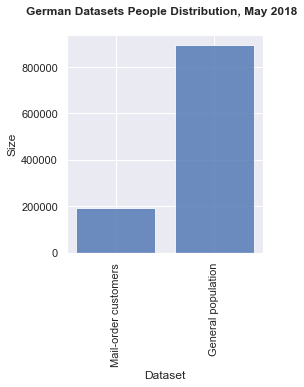

In [243]:
# plot original distribution of datasets row size; barchart plot with ascending order
dict_datasets_rows = {
    'General population': azdias.shape[0],
    'Mail-order customers': customers.shape[0],
}
plot_feature_bar(dict_datasets_rows,
                 'German Datasets People Distribution, May 2018', 'Dataset', 'Size', None, (3.5,4), None, None)

Datasets features and their datatypes:

In [244]:
azdias.dtypes.value_counts()

float64    267
int64       93
object       6
dtype: int64

In [245]:
customers.dtypes.value_counts()

float64    267
int64       93
object       6
dtype: int64

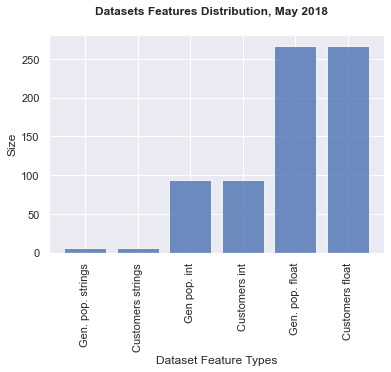

In [246]:
# only short overview as diagram
dict_datasts_feats= {
    'Gen. pop. float': len(azdias.select_dtypes(include='float64').columns),
    'Customers float': len(customers.select_dtypes(include='float64').columns),
    'Gen pop. int': len(azdias.select_dtypes(include='int64').columns),
    'Customers int': len(customers.select_dtypes(include='int64').columns),
    'Gen. pop. strings': len(azdias.select_dtypes(include='object').columns),
    'Customers strings': len(customers.select_dtypes(include=['object']).columns),
}
plot_feature_bar(dct=dict_datasts_feats,
                 title='Datasets Features Distribution, May 2018', xlabel='Dataset Feature Types', ylabel='Size', 
                 labels=None, figsize=(6,4), title_fsize=None, label_size=None)

Are there real **continuous values** with numbers after decimal point or only discrete features regarding as float ones?

In [247]:
for col in azdias.select_dtypes(include='float64'):
    found = 'False'
    if azdias[col].values.any()%1 >0: # exists any column value with having numbers after decimal point?
        print('column: {}'.format(col))
        print('   continuous values: True')
        found = 'True'
if found == 'False':
    print('No real continuous values  with positions after decimal point in general population dataset columns found.')

No real continuous values  with positions after decimal point in general population dataset columns found.


In [248]:
for col in customers.select_dtypes(include='float64'):
    found = 'False'
    if customers[col].values.any()%1 >0:
        print('column: {}'.format(col))
        print('   continuous values: True')
        found = 'True'
if found == 'False':
    print('No real continuous values with positions after decimal point in customers dataset columns found.')

No real continuous values with positions after decimal point in customers dataset columns found.


We have investigated, that all integer and float features are discrete ones, no real continuous feature with real numbers exists.

**Next topic:** As an overview, how many **missing values** per feature attribute are available?

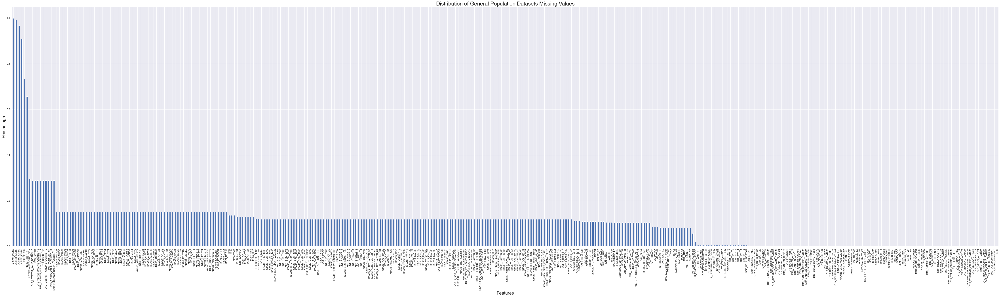

In [249]:
azdias.isnull().mean().sort_values(ascending=False).plot.bar(figsize=(80, 20))
plt.ylabel('Percentage', fontsize=20)
plt.xlabel('Features', fontsize=20)
plt.title('Distribution of General Population Datasets Missing Values', fontsize=24);

General population dataset: There are variables having a huge amount of missing values (like ALTER_KIND<no.> - means age of children number 1, 2, 3 and 4), but most of them have a percentage <20% and several even no missing values.

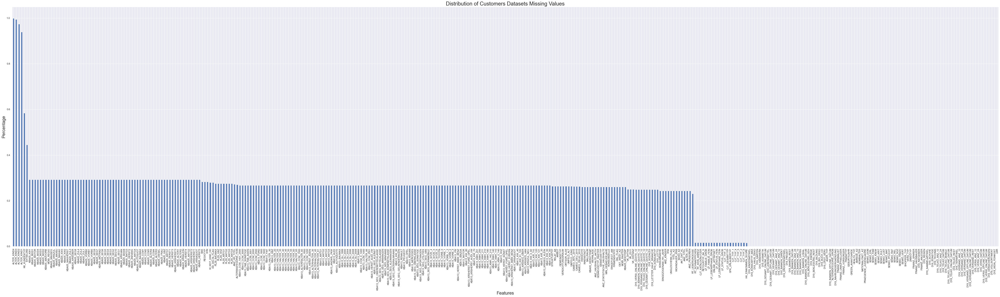

In [250]:
customers.isnull().mean().sort_values(ascending=False).plot.bar(figsize=(80, 20))
plt.ylabel('Percentage', fontsize=20)
plt.xlabel('Features', fontsize=20)
plt.title('Distribution of Customers Datasets Missing Values', fontsize=24);

Customers dataset: The general distribution of all features is similar to the other dataset, but here most of the features have an amount of missing values <30% and not <20%. And the general population dataset azdias has few features around the 30% percent, like the D19-online quote ones.

**Next topic:** Now, we have a look to the **feature cardinality**, excluding the attribute 'LNR' because it is an index for rows. (Note, for information only: analysed with %time that the wall time of the codings '~azdias.columns.isin(['LNR'])' and 'azdias.columns != 'LNR'' is the same.)

Wall time: 43.9 s


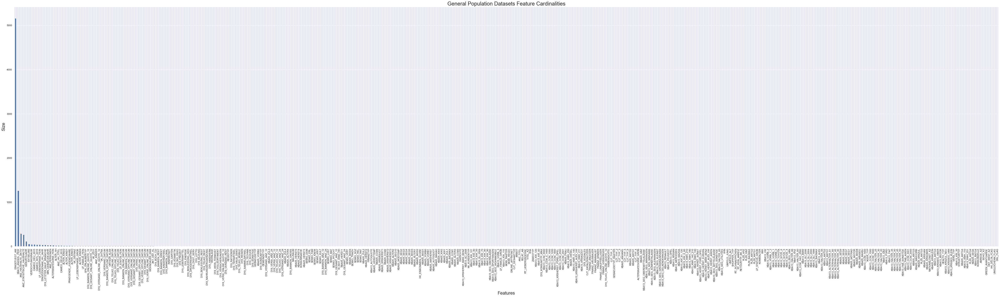

In [251]:
%time azdias.loc[:, ~azdias.columns.isin(['LNR'])].nunique().sort_values(ascending=False).plot.bar(figsize=(80, 20))
plt.ylabel('Size', fontsize=20)
plt.xlabel('Features', fontsize=20)
plt.title('General Population Datasets Feature Cardinalities', fontsize=24);

There is only one feature having a very high cardinality (>5000): 'EINGEFUEGT_AM', which is a date information stored as string text. Next one is 'KBA13_ANZAHL_PKW' (means amount of cars) with a cardinality around 1250.

Wall time: 9.55 s


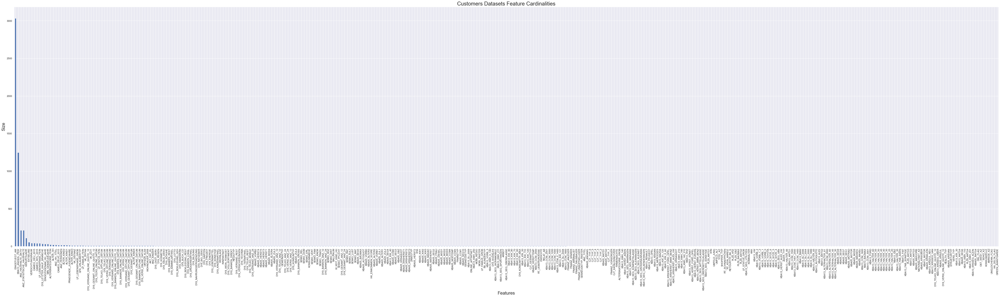

In [252]:
%time customers.loc[:, customers.columns != 'LNR'].nunique().sort_values(ascending=False).plot.bar(figsize=(80, 20))
plt.ylabel('Size', fontsize=20)
plt.xlabel('Features', fontsize=20)
plt.title('Customers Datasets Feature Cardinalities', fontsize=24);

The cardinalities distribution result of the customers features is the same as with the azdias dataset before.

Visualisation of specific **feature examples** to get a feeling for the data:

**JOB**<br>
Now, getting to understand the data we analyse some specific features, which could be important of being a Bertelsmann customer or not. We start with 'ARBEIT', because having a job is important to buy something.

In [253]:
dict_az_job = azdias['ARBEIT'].value_counts().to_dict()
dict_az_job

{4.0: 311339, 3.0: 254988, 2.0: 135662, 1.0: 56767, 5.0: 35090, 9.0: 159}

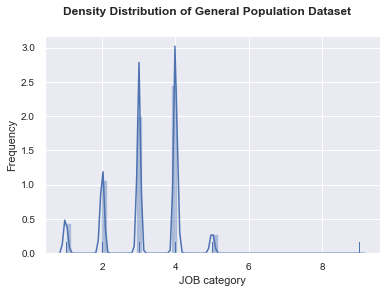

In [254]:
plot_histogram(azdias['ARBEIT'], 'JOB category', 'General Population')

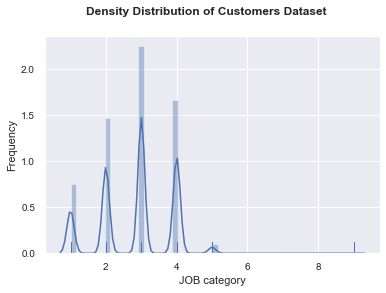

In [66]:
plot_histogram(customers['ARBEIT'], 'JOB category', 'Customers')

As we can see, this 'ARBEIT' attribute is a discrete one. The interpretation of the categories (1 upt o 5 and additionally 9) is unknown and not described in the additional Excel files. In the information level file this feature is part of the group 'Community'. Having a look to the other features and some given descriptions, it seems that feature value 9.0 could be mapped to unknown, but we cannot be sure. It is an implicit assumption for simplicity of columns work. Additionally, its amount is not much compared to the other categories. So, we don't change, but have the implicit interpretation in mind. Regarding both datasets, there is a difference in the distribution of the categories 3 and 4. In the customers dataset, 3 is the most prominent category, in the azdias dataset (general population) it is the category 4. So, the job category seems to be important.

**INCLUDED**<br>
To visualise the datetime information of 'EINGEFUEGT_AM' we need an object type conversion before. This and other diagrams are be part of the next chapter.

**AGE**<br>
What kind of distribution exists for the age attribute of households, called 'ALTER_HH', regarding the datasets?

In [255]:
dict_az_age = azdias['ALTER_HH'].value_counts().to_dict()
# ordered by key from Pythons collection documentation
dict_az_age = collections.OrderedDict(sorted(dict_az_age.items(), key=lambda t: t[0]))
dict_az_age[np.nan] = azdias['ALTER_HH'].isna().sum()
dict_az_age

OrderedDict([(0.0, 236768),
             (1.0, 1),
             (2.0, 47),
             (3.0, 200),
             (4.0, 603),
             (5.0, 1030),
             (6.0, 3809),
             (7.0, 8419),
             (8.0, 13463),
             (9.0, 22817),
             (10.0, 30419),
             (11.0, 27924),
             (12.0, 34923),
             (13.0, 37612),
             (14.0, 44275),
             (15.0, 51867),
             (16.0, 51857),
             (17.0, 55665),
             (18.0, 60852),
             (19.0, 52890),
             (20.0, 40671),
             (21.0, 41610),
             (nan, 73499)])

In [256]:
dict_cstm_age = customers['ALTER_HH'].value_counts().to_dict()
# ordered by key from Pythons collection documentation
dict_cstm_age = collections.OrderedDict(sorted(dict_cstm_age.items(), key=lambda t: t[0]))
dict_cstm_age[np.nan] = customers['ALTER_HH'].isna().sum()
dict_cstm_age

OrderedDict([(0.0, 22151),
             (2.0, 13),
             (3.0, 15),
             (4.0, 52),
             (5.0, 228),
             (6.0, 1848),
             (7.0, 5307),
             (8.0, 8111),
             (9.0, 12976),
             (10.0, 14488),
             (11.0, 9009),
             (12.0, 7779),
             (13.0, 6164),
             (14.0, 6192),
             (15.0, 7737),
             (16.0, 8011),
             (17.0, 7332),
             (18.0, 6450),
             (19.0, 6136),
             (20.0, 6554),
             (21.0, 8503),
             (nan, 46596)])

This main age of household feature attribute seems to be an ordinal encoded feature of age bins and not integer numbers of real age values. Furthermore regarding this investigation, an age 0 does not exist. As already before, our assumption is that the feature 0 represents 'unknown' information about the age. Furthermore, we don't know if the age information are always properly set by customer people.

To identify the relevant age categories, we visualise them with density diagrams, because the datasets don't have the same key sorting they are not visualised with one bar diagram. As expected, the histogram graph visualised the discrete nature of this feature.

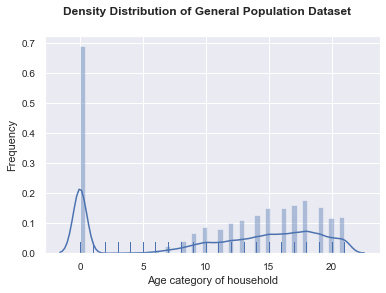

In [257]:
plot_histogram(azdias['ALTER_HH'], 'Age category of household', 'General Population')

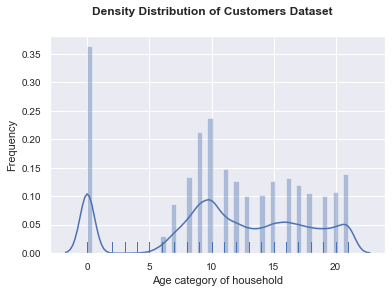

In [258]:
plot_histogram(customers['ALTER_HH'], 'Age category of household', 'Customers')

As result, all people being in group 1 up to 6 are very unlikely to be customers, they are a kind of outliers regarding the age population of both datasets. Later on, we will remove them from our datasets, after column feature engineering is ready (people are mapped to rows). The unkown group 0.0 cannot be classified, so, it will not be taken out, but we map this zero age category to NaN in one of this notebook activities.

The density diagrams show differences in the major age category of the household (between 1 and 21):
- for the general population dataset ('azdias') the main age category is 18
- for the customers dataset ('customers') the main age category is 10

This is surprising, because category 10 means the people are in the seventies today. Is this the population having most money and possibilities to be customers at Germans mail-order company Bertelsmann? This status is one of the differences between the dataset of the general population and the specific customers dataset. There the major category is number 18, means, today such people are in the thirties.

Does this information fit to the 'GEBURTSJAHR' column, which means year of birth? There must be a lot of 0 or null values, e.g. from people who don't want to set their year of birth information.

In [259]:
dict_az_yearOfBirth = azdias['GEBURTSJAHR'].value_counts().to_dict()
# ordered by key from Pythons collection documentation
dict_az_yearOfBirth = collections.OrderedDict(sorted(dict_az_age.items(), key=lambda t: t[0]))
dict_az_yearOfBirth[np.nan] = azdias['GEBURTSJAHR'].isna().sum()
dict_az_yearOfBirth

OrderedDict([(0.0, 236768),
             (1.0, 1),
             (2.0, 47),
             (3.0, 200),
             (4.0, 603),
             (5.0, 1030),
             (6.0, 3809),
             (7.0, 8419),
             (8.0, 13463),
             (9.0, 22817),
             (10.0, 30419),
             (11.0, 27924),
             (12.0, 34923),
             (13.0, 37612),
             (14.0, 44275),
             (15.0, 51867),
             (16.0, 51857),
             (17.0, 55665),
             (18.0, 60852),
             (19.0, 52890),
             (20.0, 40671),
             (21.0, 41610),
             (nan, 0)])

In [260]:
dict_cstm_yearOfBirth = customers['GEBURTSJAHR'].value_counts().to_dict()
# ordered by key from Pythons collection documentation
dict_cstm_yearOfBirth = collections.OrderedDict(sorted(dict_cstm_age.items(), key=lambda t: t[0]))
dict_cstm_yearOfBirth[np.nan] = customers['GEBURTSJAHR'].isna().sum()
dict_cstm_yearOfBirth

OrderedDict([(0.0, 22151),
             (2.0, 13),
             (3.0, 15),
             (4.0, 52),
             (5.0, 228),
             (6.0, 1848),
             (7.0, 5307),
             (8.0, 8111),
             (9.0, 12976),
             (10.0, 14488),
             (11.0, 9009),
             (12.0, 7779),
             (13.0, 6164),
             (14.0, 6192),
             (15.0, 7737),
             (16.0, 8011),
             (17.0, 7332),
             (18.0, 6450),
             (19.0, 6136),
             (20.0, 6554),
             (21.0, 8503),
             (nan, 0)])

As visible for both datasets, the 0.0 value amount is the same.

### 2.1 Dataframe 'azdias'
#### 2.1.0 Read-in DtypeWarning

During read-in of the datafiles a <i>DtypeWarning: Columns (19,20) have mixed types. Specify dtype option on import or set low_memory=False.</i> appeared. What is going on in this columns?

**First column 'CAMEO_INTL_2015':**

In [261]:
azdias.columns[18:20]

Index(['CAMEO_DEUG_2015', 'CAMEO_INTL_2015'], dtype='object')

In [262]:
azdias['CAMEO_INTL_2015'].unique()

array([nan, 51.0, 24.0, 12.0, 43.0, 54.0, 22.0, 14.0, 13.0, 15.0, 33.0,
       41.0, 34.0, 55.0, 25.0, 23.0, 31.0, 52.0, 35.0, 45.0, 44.0, 32.0,
       '22', '24', '41', '12', '54', '51', '44', '35', '23', '25', '14',
       '34', '52', '55', '31', '32', '15', '13', '43', '33', '45', 'XX'],
      dtype=object)

Which rows include the 'XX' value?

In [263]:
azdias.query("CAMEO_INTL_2015 == 'XX'")

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

So, the read-in issue with this azdias dataframe column is the mixture of float number and string datatype values and the strings are not only integer numbers as strings, there are 373 rows with character string 'XX'. And having a look to the few examples above, there are no explicit properties recognisable.

The 'XX' string as value is not explained in the attribute information Excel file, so, it is an unknown value we map to NaN. Additionaly, the strings are converted to float numbers, because such number type exists already in the column.

In [264]:
# map 'XX' to nan for all 373 rows
azdias = map_to_nan(azdias, 'CAMEO_INTL_2015', 'XX')
# convert all values to float
azdias['CAMEO_INTL_2015'] = azdias['CAMEO_INTL_2015'].astype(float)

In [265]:
# no 'XX' is available anymore and list of unique floats
result_list = [np.nan, 51., 24., 12., 43., 54., 22., 14., 13., 15., 33., 41., 34., 55., 25., 23., 31., 52., 35., 45., 44., 32.]
assert type(azdias['CAMEO_INTL_2015'].unique()) == np.ndarray, "Oops, the resulting array list datatype after map_to_nan() and float conversion don't fit"
assert azdias['CAMEO_INTL_2015'].unique().sort() == result_list.sort(), "Oops, the map_to_nan() function and conversion to float do not work."
print("Quick test for nan mapping and float conversion passed.")

Quick test for nan mapping and float conversion passed.


In [266]:
# dereference of tmp variables
del result_list

In [267]:
azdias.groupby(['CAMEO_INTL_2015'])['CAMEO_INTL_2015'].count()

CAMEO_INTL_2015
12.0     13249
13.0     26336
14.0     62884
15.0     16974
22.0     33155
23.0     26750
24.0     91158
25.0     39628
31.0     19024
32.0     10354
33.0      9935
34.0     18524
35.0     10356
41.0     92336
43.0     56672
44.0     14820
45.0     26132
51.0    133694
52.0     20542
54.0     45391
55.0     23955
Name: CAMEO_INTL_2015, dtype: int64

**Second column 'CAMEO_DEUG_2015':**<br>
We do the same for the second column.

In [268]:
azdias['CAMEO_DEUG_2015'].unique()

array([nan, 8.0, 4.0, 2.0, 6.0, 1.0, 9.0, 5.0, 7.0, 3.0, '4', '3', '7',
       '2', '8', '9', '6', '5', '1', 'X'], dtype=object)

In [269]:
azdias.query("CAMEO_DEUG_2015 == 'X'")

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

It seems as if in both files the same row indeces are involved. The root cause for the read-in warning is the same and we change the 'X' to NaN and convert everything to float datatype.

In [270]:
# map the 'X' to nan for all 373 rows
azdias = map_to_nan(azdias, 'CAMEO_DEUG_2015', 'X')
# convert all values to float
azdias['CAMEO_DEUG_2015'] = azdias['CAMEO_DEUG_2015'].astype(float)

In [271]:
azdias.groupby(['CAMEO_DEUG_2015'])['CAMEO_DEUG_2015'].count()

CAMEO_DEUG_2015
1.0     36212
2.0     83231
3.0     86779
4.0    103912
5.0     55310
6.0    105874
7.0     77933
8.0    134441
9.0    108177
Name: CAMEO_DEUG_2015, dtype: int64

#### 2.1.1 Change Object DTypes
As identified in the general overview, some columns are object datatypes. This has to be changed to make such columns usable for prediction models. Some are already handled and following list includes the remaining ones.

The identified columns are:
- 'CAMEO_DEU_2015'
- 'EINGEFUEGT_AM'
- 'D19_LETZTER_KAUF_BRANCHE'
- 'OST_WEST_KZ'

We start with **'CAMEO_DEU_2015'**<br>

This is a detailed CAMEO classification having 44 categories. Having a look to its detailed information of the Dias-Attributes-Values Excel file, it seems to be unstructured regarding its number plus character grouping. And some of the categories seem to be 'nonsense' (e.g. 4C or the maximum category 6B) as if they have been added afterwards explicitly for this project. Furthermore, I guess that the description category 8A includes a misspelling: I guess this 'Multi-culteral' shall be 'multi-cultural'. What are the requirements for such categories? 

Additional note: During this investigation it has been detected that the attribute 'CAMEO_DEUINTL_2015' which is mentioned in the Excel file does not exist in both dataframes. This happened because the 'XX' string appeared in 'CAMEO_DEU_2015' as well and the question pops up, if this is valid for all 'CAMEO...' attributes. The associated coding for this investigation has been deleted, only this comment remains.

In [272]:
azdias['CAMEO_DEU_2015'].unique()

array([nan, '8A', '4C', '2A', '6B', '8C', '4A', '2D', '1A', '1E', '9D',
       '5C', '8B', '7A', '5D', '9E', '9B', '1B', '3D', '4E', '4B', '3C',
       '5A', '7B', '9A', '6D', '6E', '2C', '7C', '9C', '7D', '5E', '1D',
       '8D', '6C', '6A', '5B', '4D', '3A', '2B', '7E', '3B', '6F', '5F',
       '1C', 'XX'], dtype=object)

In [273]:
print("CAMEO_DEU_2015 includes {} rows with 'XX' strings.".format(azdias.query("CAMEO_DEU_2015 == 'XX'").shape[0]))

CAMEO_DEU_2015 includes 373 rows with 'XX' strings.


In [274]:
# map 'XX' to nan for all associated rows
azdias = map_to_nan(azdias, 'CAMEO_DEU_2015', 'XX')

In [275]:
azdias['CAMEO_DEU_2015'].isnull().sum()

99352

In [276]:
# NaN's are not counted
az_cameo_deu_2015_dict = azdias['CAMEO_DEU_2015'].value_counts().to_dict()
#az_cameo_deu_2015_dict

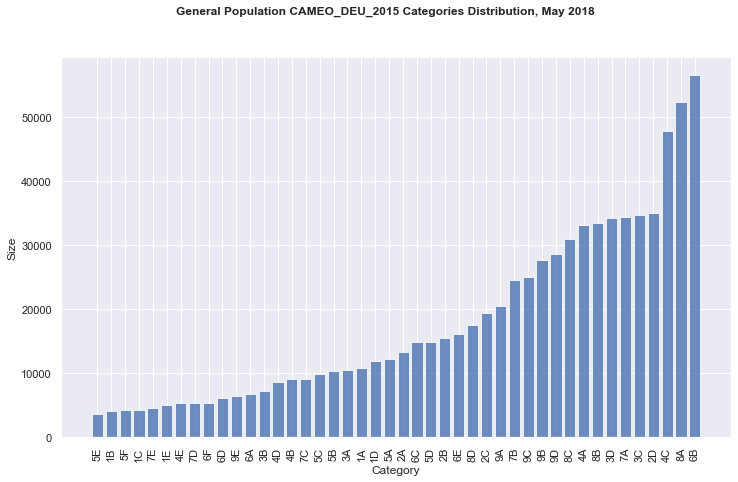

In [277]:
plot_feature_bar(dct=az_cameo_deu_2015_dict,
                 title='General Population CAMEO_DEU_2015 Categories Distribution, May 2018',
                 xlabel='Category', ylabel='Size', labels=None, figsize=(12,7))

**Note:**<br>
Because it seems as if some categories are useless, only added for students, a simple grouping is implemented to reduce the category dimension of the attribute: remove the string character that is always on position 1 and do a float conversion to create new bins.

In [278]:
# short test
test_str = ['8A', '9D', '5C', np.nan]
list(map(modify_CAMEO_DEU_2015, test_str))

[8.0, 9.0, 5.0, nan]

In [279]:
# dereferencing for garbage collection
del test_str
del az_cameo_deu_2015_dict

In [280]:
azdias['CAMEO_DEU_2015'] = list(map(modify_CAMEO_DEU_2015, azdias['CAMEO_DEU_2015'].values))

In [281]:
assert azdias['CAMEO_DEU_2015'][:10].values.sort() == [np.nan, 8.0, 4.0, 2.0, 6.0, 8.0, 4.0, 2.0, 1.0, 1.0].sort(), "Oops, the first 10 items of the array are not as expected."
print("Quick test about first modified 10 'CAMEO_DEU_2015' items of azdias dataframe is passed.")

Quick test about first modified 10 'CAMEO_DEU_2015' items of azdias dataframe is passed.


How does this column look like after modification?

In [282]:
cameo_deu_2015_mod_dict = azdias['CAMEO_DEU_2015'].value_counts().to_dict()
cameo_deu_2015_mod_dict

{8.0: 134441,
 9.0: 108177,
 6.0: 105874,
 4.0: 103912,
 3.0: 86779,
 2.0: 83231,
 7.0: 77933,
 5.0: 55310,
 1.0: 36212}

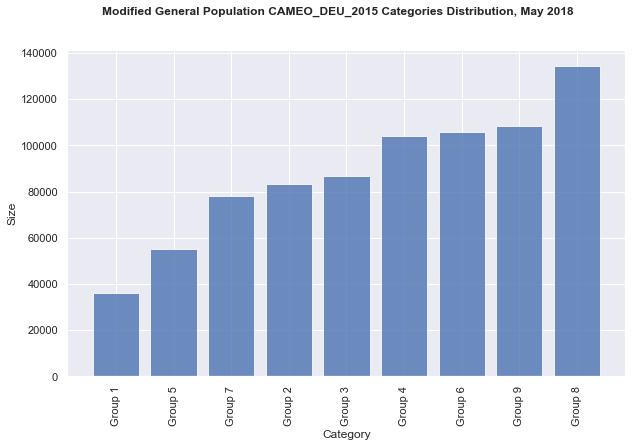

In [283]:
labels = ['Group 1', 'Group 5', 'Group 7', 'Group 2', 'Group 3', 'Group 4', 'Group 6', 'Group 9', 'Group 8']
plot_feature_bar(dct=cameo_deu_2015_mod_dict,
                 title='Modified General Population CAMEO_DEU_2015 Categories Distribution, May 2018',
                 xlabel='Category', ylabel='Size', labels=labels, figsize=(10,6))

In [284]:
# dereferencing
del labels
del cameo_deu_2015_mod_dict

Next attribute to change is **'EINGEFUEGT_AM' (English: inserted):**<br>
This is a time string, so, we convert it to datatime with format "%Y-%m-%d" and errors ignored, the NaN values are converted to NaT and this values are counted by using isnull(). For visualisation, we don't use the day, because this information would be to detailed, e.g. for monthly distribution during the years.

In [285]:
azdias['EINGEFUEGT_AM'].head()

0                    NaN
1    1992-02-10 00:00:00
2    1992-02-12 00:00:00
3    1997-04-21 00:00:00
4    1992-02-12 00:00:00
Name: EINGEFUEGT_AM, dtype: object

In [286]:
azdias['EINGEFUEGT_AM'] = pd.to_datetime(azdias['EINGEFUEGT_AM'], format='%Y-%m-%d', errors='ignore')

In [287]:
# NaN are changed to NaT if errors are not ignored,
# see if using only the year will be better: pd.to_datetime().dt.year
azdias['EINGEFUEGT_AM'].head()

0          NaT
1   1992-02-10
2   1992-02-12
3   1997-04-21
4   1992-02-12
Name: EINGEFUEGT_AM, dtype: datetime64[ns]

In [288]:
# NaT values are interpreted as null
azdias['EINGEFUEGT_AM'].isnull().sum()

93148

In [289]:
azdias['EINGEFUEGT_AM'].value_counts()

1992-02-10    383738
1992-02-12    192264
1995-02-07     11181
2005-12-16      6291
2003-11-18      6050
               ...  
2012-07-26         1
2001-01-29         1
2008-11-22         1
1999-06-23         1
2006-07-15         1
Name: EINGEFUEGT_AM, Length: 5162, dtype: int64

We have to change the Period object to str, not having keys like {Period('1992-02', 'M'): 578393, ...}. First, 
the quarterly date information has been used, because already 'M' month has been too detailed, but quarterly has been too detailed as well. The graphical distribution has been the same, so finally, 'year' has been the best new bin option. 

Having a look to the year distribution ...

In [290]:
%time dict_az_yearinserted = azdias['EINGEFUEGT_AM'].dt.to_period('Y').astype(str).value_counts().to_dict()
#dict_az_yearinserted

Wall time: 7.28 s


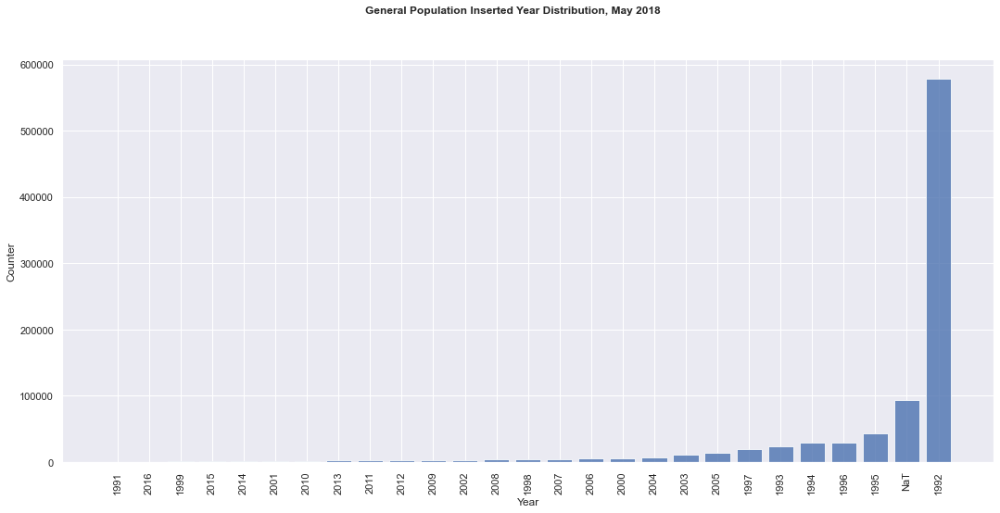

In [291]:
plot_feature_bar(dct=dict_az_yearinserted,
                 title='General Population Inserted Year Distribution, May 2018',
                 xlabel='Year', ylabel='Counter', labels=None, figsize=(18,8))

The year distribution showed the same trend as the quaterly one. Therefore we can change the feature attribute to year, means having NaT's as well and float values, without big information loss but having new bins.

In [292]:
azdias['EINGEFUEGT_AM'] = azdias['EINGEFUEGT_AM'].dt.to_period('Y').astype(str)

In [293]:
azdias['EINGEFUEGT_AM'] = list(map(modify_EINGEFUEGT, azdias['EINGEFUEGT_AM'].values))

In [294]:
azdias['EINGEFUEGT_AM'].head()

0       NaN
1    1992.0
2    1992.0
3    1997.0
4    1992.0
Name: EINGEFUEGT_AM, dtype: float64

In [295]:
# dereferencing
# del dict_az_dateinserted
del dict_az_yearinserted

Next feature attribute is **'D19_LETZTER_KAUF_BRANCHE' (English: last purchase of mentioned category):**

In [296]:
azdias['D19_LETZTER_KAUF_BRANCHE'].unique()

array([nan, 'D19_UNBEKANNT', 'D19_SCHUHE', 'D19_ENERGIE', 'D19_KOSMETIK',
       'D19_VOLLSORTIMENT', 'D19_SONSTIGE', 'D19_BANKEN_GROSS',
       'D19_DROGERIEARTIKEL', 'D19_HANDWERK', 'D19_BUCH_CD',
       'D19_VERSICHERUNGEN', 'D19_VERSAND_REST', 'D19_TELKO_REST',
       'D19_BANKEN_DIREKT', 'D19_BANKEN_REST', 'D19_FREIZEIT',
       'D19_LEBENSMITTEL', 'D19_HAUS_DEKO', 'D19_BEKLEIDUNG_REST',
       'D19_SAMMELARTIKEL', 'D19_TELKO_MOBILE', 'D19_REISEN',
       'D19_BEKLEIDUNG_GEH', 'D19_TECHNIK', 'D19_NAHRUNGSERGAENZUNG',
       'D19_DIGIT_SERV', 'D19_LOTTO', 'D19_RATGEBER', 'D19_TIERARTIKEL',
       'D19_KINDERARTIKEL', 'D19_BIO_OEKO', 'D19_WEIN_FEINKOST',
       'D19_GARTEN', 'D19_BILDUNG', 'D19_BANKEN_LOKAL'], dtype=object)

In [297]:
azdias['D19_LETZTER_KAUF_BRANCHE'].isnull().sum()

257113

In [298]:
azdias.groupby(['D19_LETZTER_KAUF_BRANCHE'])['D19_LETZTER_KAUF_BRANCHE'].count()

D19_LETZTER_KAUF_BRANCHE
D19_BANKEN_DIREKT          23273
D19_BANKEN_GROSS           10550
D19_BANKEN_LOKAL            1442
D19_BANKEN_REST             5247
D19_BEKLEIDUNG_GEH         10272
D19_BEKLEIDUNG_REST        21796
D19_BILDUNG                  980
D19_BIO_OEKO                1232
D19_BUCH_CD                28754
D19_DIGIT_SERV              3577
D19_DROGERIEARTIKEL        24072
D19_ENERGIE                12084
D19_FREIZEIT                7257
D19_GARTEN                  1646
D19_HANDWERK                2227
D19_HAUS_DEKO              20858
D19_KINDERARTIKEL           7301
D19_KOSMETIK                 805
D19_LEBENSMITTEL            6458
D19_LOTTO                    839
D19_NAHRUNGSERGAENZUNG      4061
D19_RATGEBER                4931
D19_REISEN                  3122
D19_SAMMELARTIKEL           2443
D19_SCHUHE                 32578
D19_SONSTIGE               44722
D19_TECHNIK                 7002
D19_TELKO_MOBILE           14447
D19_TELKO_REST             11472
D19_TIERARTIKEL   

As we have investigated, the highest category of this attribute is 'D19_UNBEKANNT' (English: unknown) with 195338 entries. We map this category to NaN. Note, see below: NaN investigation results that this feature has too much empty values and therefore is part of our columns drop list. So, no further feature values modification is necessary. Additionally regarding the attributes Excel file, encoding features for this categorical string values are available already.

In [299]:
# map 'D19_UNBEKANNT' to nan for all associated rows
azdias = map_to_nan(azdias, 'D19_LETZTER_KAUF_BRANCHE', 'D19_UNBEKANNT')

In [300]:
assert azdias['D19_LETZTER_KAUF_BRANCHE'].isnull().sum() == (195338 + 257113), "Oops, the NaN value count is wrong."
print("Quick test for 'D19_LETZTER_KAUF_BRANCHE' nan value caluculation is passed.")

Quick test for 'D19_LETZTER_KAUF_BRANCHE' nan value caluculation is passed.


The last attribute is **'OST_WEST_KZ:'**<br>
This feature includes string values 'O' (German word 'Ost' for east) and 'W' (German word 'West' for west) together with value -1 for unknown to identify if someone comes from former East- (GDR) or West-Germany (FRG). I am surprised to find this attribute. Is it really a criteria for being a customer, more than 30 years after reunion, specifically because a lot of other attributes with label part 'PLZ8' are part of the geographical German region Bavaria. PLZ8 is the abbreviation for the postal code of Bavaria in the south of Germany and Bertelsmann/Arvato is located in Hamburg-Germany, which is in the North of Germany. The dataset is a little bit confusing. Anyway, we have to change the <i>'O'</i> and the <i>'W'</i> to numerical values (e.g. 0 for 'O' and 1 for 'W') and replace the -1 by NaN.

In [301]:
%time azdias = replace_OST_WEST_KZ(azdias)

Wall time: 1.44 s


In [302]:
## Tests
assert ma.isnan(azdias['OST_WEST_KZ'].unique()[0]), "Oops, azdias: nan is not part of the feature OST_WEST_KZ values."
assert azdias['OST_WEST_KZ'].unique()[1] == 1.0, "Oops, azdias: 1.0 is not part of the feature OST_WEST_KZ values."
assert azdias['OST_WEST_KZ'].unique()[2] == 0.0, "Oops, azdias: 0.0 is not part of the feature OST_WEST_KZ values."
print("Quick tests for azdias OST_WEST_KZ feature are passed.")

Quick tests for azdias OST_WEST_KZ feature are passed.


#### 2.1.2 NaN content

Already our few visualised datafile samples show a lot of columns and rows having NaN values in both dataframe files. If there are too much NaN values, they don't deliver information for our analysis targets and we have to decide what to do with them. This is another topic for our preprocessing tasks.

In [303]:
azdias.head(15)

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

In [304]:
# check if any string is empty in columns list or are blank strings
check_labels(set(azdias.columns), 'azdias')

Is any string empty in azdias label list? : False


In [305]:
# how many rows are there with empty values (NaN values)
%time len(azdias.isnull().values.any(axis=1)) # returns lenght of the array with boolean values

Wall time: 2.37 s


891221

So, all 891221 rows include NaN values which is as expected. Therefore, we walk on with column feature engineering and do the preprocessing for columns first and have a look to the remaining rows afterwards if necessary.

In [306]:
# check columns
%time dict_az_over35perc_init, dict_az_less36perc_init = get_empty_values_info(df=azdias, name='azdias')

Amount of azdias columns included NaN/NaT values:
1. 'VHN' includes: 121196, means: 13.6%
2. 'KBA05_KRSZUL' includes: 133324, means: 14.96%
3. 'KBA13_HERST_FORD_OPEL' includes: 105800, means: 11.87%
4. 'KBA13_ANTG1' includes: 105800, means: 11.87%
5. 'SEMIO_TRADV' includes: 0, means: 0.0%
6. 'D19_WEIN_FEINKOST' includes: 0, means: 0.0%
7. 'D19_DROGERIEARTIKEL' includes: 0, means: 0.0%
8. 'SEMIO_PFLICHT' includes: 0, means: 0.0%
9. 'INNENSTADT' includes: 93740, means: 10.52%
10. 'KBA13_VORB_0' includes: 105800, means: 11.87%
11. 'KBA13_HERST_SONST' includes: 105800, means: 11.87%
12. 'KBA13_KMH_251' includes: 105800, means: 11.87%
13. 'KBA05_MAXVORB' includes: 133324, means: 14.96%
14. 'KBA05_VORB1' includes: 133324, means: 14.96%
15. 'KBA13_KRSAQUOT' includes: 105800, means: 11.87%
16. 'LP_FAMILIE_FEIN' includes: 4854, means: 0.5446%
17. 'HH_EINKOMMEN_SCORE' includes: 18348, means: 2.059%
18. 'KBA13_SEG_SPORTWAGEN' includes: 105800, means: 11.87%
19. 'KBA13_VORB_2' includes: 105800, me

139. 'KBA05_KW2' includes: 133324, means: 14.96%
140. 'KBA05_CCM4' includes: 133324, means: 14.96%
141. 'PLZ8_ANTG4' includes: 116515, means: 13.07%
142. 'D19_BANKEN_LOKAL' includes: 0, means: 0.0%
143. 'FINANZ_UNAUFFAELLIGER' includes: 0, means: 0.0%
144. 'KOMBIALTER' includes: 0, means: 0.0%
145. 'KBA13_HALTER_30' includes: 105800, means: 11.87%
146. 'KBA13_ANZAHL_PKW' includes: 105800, means: 11.87%
147. 'KBA13_VORB_3' includes: 105800, means: 11.87%
148. 'AKT_DAT_KL' includes: 73499, means: 8.247%
149. 'KBA05_ANTG3' includes: 133324, means: 14.96%
150. 'KONSUMNAEHE' includes: 73969, means: 8.3%
151. 'KBA13_SEG_OBEREMITTELKLASSE' includes: 105800, means: 11.87%
152. 'KBA13_KW_40' includes: 105800, means: 11.87%
153. 'UNGLEICHENN_FLAG' includes: 73499, means: 8.247%
154. 'VK_DHT4A' includes: 75917, means: 8.518%
155. 'KBA13_ANTG3' includes: 105800, means: 11.87%
156. 'KBA13_SEG_OBERKLASSE' includes: 105800, means: 11.87%
157. 'D19_REISEN' includes: 0, means: 0.0%
158. 'KBA13_KW_70' i

279. 'KBA05_HERST5' includes: 133324, means: 14.96%
280. 'PRAEGENDE_JUGENDJAHRE' includes: 0, means: 0.0%
281. 'KBA13_BJ_2008' includes: 105800, means: 11.87%
282. 'KBA05_HERSTTEMP' includes: 93148, means: 10.45%
283. 'KBA05_VORB0' includes: 133324, means: 14.96%
284. 'KBA05_ALTER4' includes: 133324, means: 14.96%
285. 'KBA05_KRSOBER' includes: 133324, means: 14.96%
286. 'KBA13_CCM_1200' includes: 105800, means: 11.87%
287. 'KBA05_MOD1' includes: 133324, means: 14.96%
288. 'KBA13_KW_0_60' includes: 105800, means: 11.87%
289. 'KBA13_SITZE_5' includes: 105800, means: 11.87%
290. 'KBA05_MOTRAD' includes: 133324, means: 14.96%
291. 'D19_TECHNIK' includes: 0, means: 0.0%
292. 'KBA13_KRSZUL_NEU' includes: 105800, means: 11.87%
293. 'PLZ8_HHZ' includes: 116515, means: 13.07%
294. 'KBA13_CCM_1401_2500' includes: 105800, means: 11.87%
295. 'D19_VERSAND_REST' includes: 0, means: 0.0%
296. 'CAMEO_DEUG_2015' includes: 99352, means: 11.15%
297. 'KBA13_KRSHERST_BMW_BENZ' includes: 105800, means: 11.

Which azdias columns have an amount of NaN values >35%, without having done further preprocessing, only having done some general changes? (Note: after reading some blogs and papers, there NaN percentage thresholds are given between 20% and 50%. The 35% value is because of that as an average, it is unknown if this is the optimal value. Other ones should be investigated.) 

In [307]:
if len(dict_az_over35perc_init.items()) > 0:
    for key, value in dict_az_over35perc_init.items():
        print(key, ' : no. {}, perc. {:.4}%'.format(value[0], value[1]))
else:
    print("No features found with amount of NaN values >35%.")

D19_LETZTER_KAUF_BRANCHE  : no. 452451, perc. 50.77%
KK_KUNDENTYP  : no. 584612, perc. 65.6%
ALTER_KIND1  : no. 810163, perc. 90.9%
ALTER_KIND4  : no. 890016, perc. 99.86%
ALTER_KIND2  : no. 861722, perc. 96.69%
EXTSEL992  : no. 654153, perc. 73.4%
ALTER_KIND3  : no. 885051, perc. 99.31%


Note: The German attribute label ALTER_KIND<no.> means in English: age of child number <no.>, LETZTER_KAUF_BRANCHE means last buy of segment/branche of trade and KK_KUNDENTYP means KK_CustomerType.

So, it seems as if the age of a child is not important for our analysis, but regarding the other features, we know the number of children a person has (attribute 'ANZ_KINDER') having only 8.247% of empty values. In other words, children information about a person is a available even after removing such child age attributes.

As additional information: How many features have no NaN values by now? Have in mind, we don't have handled the unkown information mapped e.g. to 0 or -1 yet.

In [308]:
az_noNaN = [k for k,v in dict_az_less36perc_init.items() if float(v[0]) == 0]
print("There are {} columns out of {} of the azdias dataset, not including any NaN values.".
      format(len(az_noNaN), azdias.shape[1]))
#print("These features are:")
#az_noNaN

There are 93 columns out of 366 of the azdias dataset, not including any NaN values.


But before starting further preprocessing, we have a look if this investigation results fit to the customers dataframe as well. Both files belong together, therefore we have to be careful by deleting information only by regarding one of the files.

### 2.2 Dataframe 'customers'
#### 2.2.0 Read-in DtypeWarning

During read-in of the datafiles a <i>DtypeWarning: Columns (19,20) have mixed types. Specify dtype option on import or set low_memory=False.</i> appeared. What is going on in this columns?

**First column 'CAMEO_INTL_2015':**

In [309]:
customers.columns[18:20]

Index(['CAMEO_DEUG_2015', 'CAMEO_INTL_2015'], dtype='object')

In [310]:
customers['CAMEO_INTL_2015'].unique()

array([13.0, nan, 34.0, 24.0, 41.0, 23.0, 15.0, 55.0, 14.0, 22.0, 43.0,
       51.0, 33.0, 25.0, 44.0, 54.0, 32.0, 12.0, 35.0, 31.0, 45.0, 52.0,
       '45', '25', '55', '51', '14', '54', '43', '22', '15', '24', '35',
       '23', '12', '44', '41', '52', '31', '13', '34', '32', '33', 'XX'],
      dtype=object)

In [311]:
customers.query("CAMEO_INTL_2015 == 'XX'")

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

In [312]:
# map the 'XX' to nan for all 126 rows
customers = map_to_nan(customers, 'CAMEO_INTL_2015', 'XX')
# make all values to float
customers['CAMEO_INTL_2015'] = customers['CAMEO_INTL_2015'].astype(float)

In [313]:
customers.groupby(['CAMEO_INTL_2015'])['CAMEO_INTL_2015'].count()

CAMEO_INTL_2015
12.0     3715
13.0     7683
14.0    19647
15.0     9217
22.0     7507
23.0     5770
24.0    17805
25.0     9372
31.0     2731
32.0     1696
33.0     1574
34.0     5368
35.0     2294
41.0    11320
43.0     9634
44.0     2832
45.0     5288
51.0     8113
52.0     1023
54.0     4795
55.0     3714
Name: CAMEO_INTL_2015, dtype: int64

**Second column 'CAMEO_DEUG_2015':**

In [314]:
customers['CAMEO_DEUG_2015'].unique()

array([1.0, nan, 5.0, 4.0, 7.0, 3.0, 9.0, 2.0, 6.0, 8.0, '6', '3', '8',
       '9', '2', '4', '1', '7', '5', 'X'], dtype=object)

In [315]:
customers.query("CAMEO_DEUG_2015 == 'X'")

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

In [316]:
# map the 'X' to nan for all 126 rows
customers = map_to_nan(customers, 'CAMEO_DEUG_2015', 'X')
# make all values to float
customers['CAMEO_DEUG_2015'] = customers['CAMEO_DEUG_2015'].astype(float)

In [317]:
customers.groupby(['CAMEO_DEUG_2015'])['CAMEO_DEUG_2015'].count()

CAMEO_DEUG_2015
1.0    16778
2.0    23484
3.0    18390
4.0    22064
5.0    11666
6.0    18717
7.0    10558
8.0    13049
9.0     6392
Name: CAMEO_DEUG_2015, dtype: int64

#### 2.2.1 Change Object DTypes
As identified in the general overview, some columns are object datatypes. This has to be changed to make such columns usable for prediction models.

The identified columns are:
- 'CAMEO_DEU_2015'
- 'EINGEFUEGT_AM'
- 'D19_LETZTER_KAUF_BRANCHE'
- 'OST_WEST_KZ'

We start with **'CAMEO_DEU_2015'**<br>

In [318]:
customers['CAMEO_DEU_2015'].unique()

array(['1A', nan, '5D', '4C', '7B', '3B', '1D', '9E', '2D', '4A', '6B',
       '9D', '8B', '5C', '9C', '4E', '6C', '8C', '8A', '5B', '9B', '3D',
       '2A', '3C', '5F', '7A', '1E', '2C', '7C', '5A', '2B', '6D', '7E',
       '5E', '6E', '3A', '9A', '4B', '1C', '1B', '6A', '8D', '7D', '6F',
       '4D', 'XX'], dtype=object)

In [319]:
# map 'XX' to nan for all associated rows
customers = map_to_nan(customers, 'CAMEO_DEU_2015', 'XX')

In [320]:
customers['CAMEO_DEU_2015'].isnull().sum()

50554

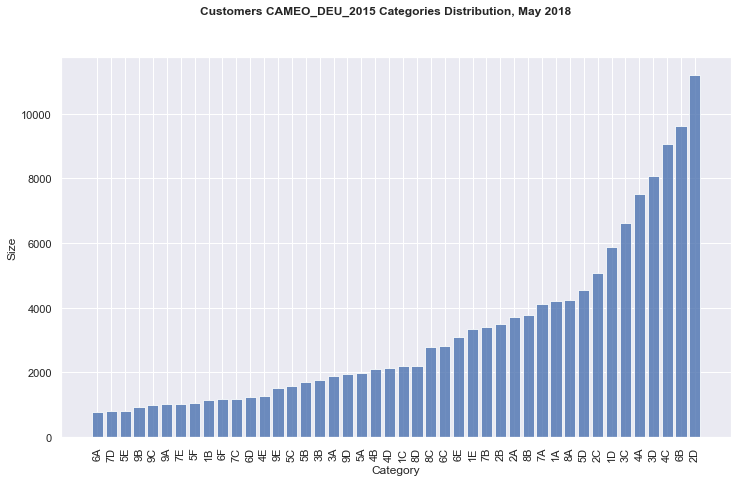

In [321]:
plot_feature_bar(dct=customers['CAMEO_DEU_2015'].value_counts().to_dict(),
                 title='Customers CAMEO_DEU_2015 Categories Distribution, May 2018',
                 xlabel='Category', ylabel='Size', labels=None, figsize=(12,7))

In [322]:
customers['CAMEO_DEU_2015'] = list(map(modify_CAMEO_DEU_2015, customers['CAMEO_DEU_2015'].values))

How does this column look like after modification?

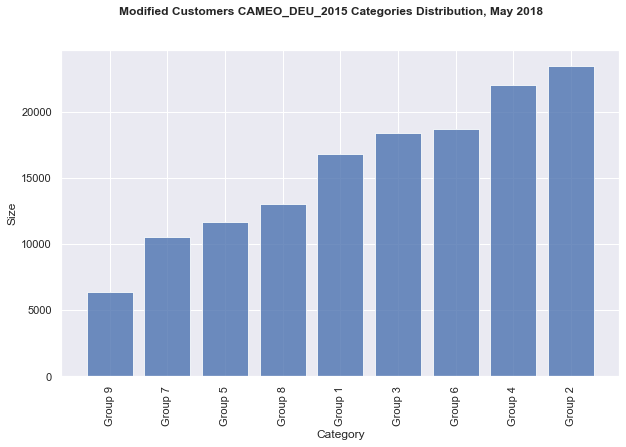

In [323]:
labels = ['Group 9', 'Group 7', 'Group 5', 'Group 8', 'Group 1', 'Group 3', 'Group 6', 'Group 4', 'Group 2']
plot_feature_bar(dct=customers['CAMEO_DEU_2015'].value_counts().to_dict(),
                 title='Modified Customers CAMEO_DEU_2015 Categories Distribution, May 2018',
                 xlabel='Category', ylabel='Size', labels=labels, figsize=(10,6))

Next attribute to change is **'EINGEFUEGT_AM' (English: inserted):**<br>
This is a time string, so, we convert it to datatime with format "%Y-%m-%d" and errors ignored, the NaN values are converted to NaT and this values are counted by using isnull().

In [324]:
customers['EINGEFUEGT_AM'].head()

0    1992-02-12 00:00:00
1                    NaN
2    1992-02-10 00:00:00
3    1992-02-10 00:00:00
4    1992-02-12 00:00:00
Name: EINGEFUEGT_AM, dtype: object

In [325]:
customers['EINGEFUEGT_AM'] = pd.to_datetime(customers['EINGEFUEGT_AM'], format="%Y-%m-%d", errors='ignore')

In [326]:
customers['EINGEFUEGT_AM'].head()

0   1992-02-12
1          NaT
2   1992-02-10
3   1992-02-10
4   1992-02-12
Name: EINGEFUEGT_AM, dtype: datetime64[ns]

In [327]:
# NaT values are interpreted as null
customers['EINGEFUEGT_AM'].isnull().sum()

49927

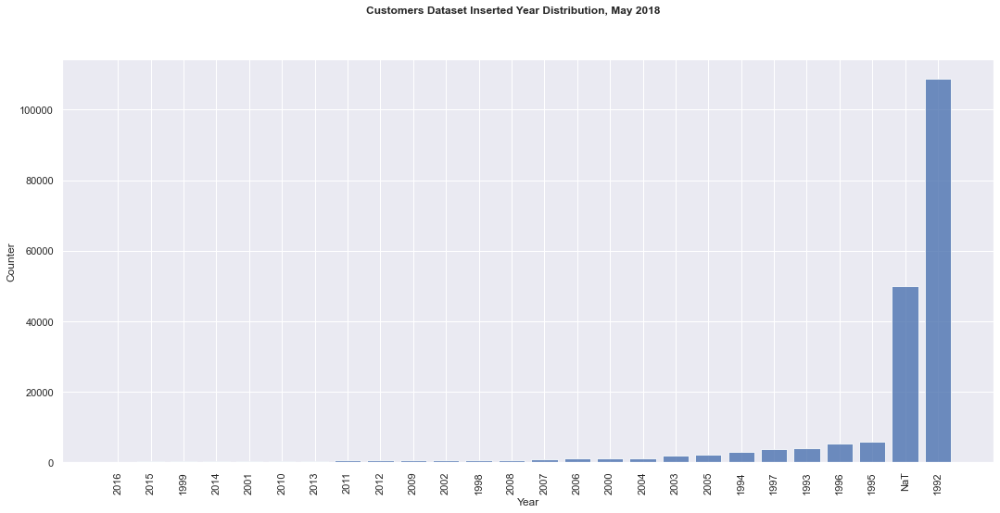

In [328]:
plot_feature_bar(dct=customers['EINGEFUEGT_AM'].dt.to_period('Y').astype(str).value_counts().to_dict(),
                 title='Customers Dataset Inserted Year Distribution, May 2018',
                 xlabel='Year', ylabel='Counter', labels=None, figsize=(18,8))

As already in the other dataset, most person have been added as customers year 1992, the year with the much highest amount compared to all the other years. In general, the nineties are the years getting most people as new customer.

We change the 'EINGEFUEGT_AM' feature to its year value too.

In [329]:
customers['EINGEFUEGT_AM'] = customers['EINGEFUEGT_AM'].dt.to_period('Y').astype(str)

In [330]:
customers['EINGEFUEGT_AM'] = list(map(modify_EINGEFUEGT, customers['EINGEFUEGT_AM'].values))

In [331]:
customers['EINGEFUEGT_AM'].head()

0    1992.0
1       NaN
2    1992.0
3    1992.0
4    1992.0
Name: EINGEFUEGT_AM, dtype: float64

Next feature attribute is **'D19_LETZTER_KAUF_BRANCHE' (English: last purchase of category):**

In [332]:
customers['D19_LETZTER_KAUF_BRANCHE'].unique()

array(['D19_UNBEKANNT', 'D19_BANKEN_GROSS', 'D19_NAHRUNGSERGAENZUNG',
       'D19_SCHUHE', 'D19_BUCH_CD', 'D19_DROGERIEARTIKEL', 'D19_SONSTIGE',
       'D19_TECHNIK', 'D19_VERSICHERUNGEN', 'D19_TELKO_MOBILE',
       'D19_VOLLSORTIMENT', nan, 'D19_HAUS_DEKO', 'D19_ENERGIE',
       'D19_REISEN', 'D19_BANKEN_LOKAL', 'D19_VERSAND_REST',
       'D19_BEKLEIDUNG_REST', 'D19_FREIZEIT', 'D19_BEKLEIDUNG_GEH',
       'D19_TELKO_REST', 'D19_SAMMELARTIKEL', 'D19_BANKEN_DIREKT',
       'D19_KINDERARTIKEL', 'D19_BANKEN_REST', 'D19_LEBENSMITTEL',
       'D19_GARTEN', 'D19_HANDWERK', 'D19_RATGEBER', 'D19_DIGIT_SERV',
       'D19_BIO_OEKO', 'D19_BILDUNG', 'D19_WEIN_FEINKOST',
       'D19_TIERARTIKEL', 'D19_LOTTO', 'D19_KOSMETIK'], dtype=object)

In [333]:
customers['D19_LETZTER_KAUF_BRANCHE'].isnull().sum()

47697

In [334]:
customers.groupby(['D19_LETZTER_KAUF_BRANCHE'])['D19_LETZTER_KAUF_BRANCHE'].count()

D19_LETZTER_KAUF_BRANCHE
D19_BANKEN_DIREKT          3466
D19_BANKEN_GROSS           1684
D19_BANKEN_LOKAL            306
D19_BANKEN_REST            1233
D19_BEKLEIDUNG_GEH         5975
D19_BEKLEIDUNG_REST        4096
D19_BILDUNG                 357
D19_BIO_OEKO                808
D19_BUCH_CD               10038
D19_DIGIT_SERV              653
D19_DROGERIEARTIKEL        5528
D19_ENERGIE                4454
D19_FREIZEIT               1672
D19_GARTEN                  568
D19_HANDWERK                532
D19_HAUS_DEKO              8129
D19_KINDERARTIKEL          1439
D19_KOSMETIK                116
D19_LEBENSMITTEL           3053
D19_LOTTO                   194
D19_NAHRUNGSERGAENZUNG     2253
D19_RATGEBER               1519
D19_REISEN                  666
D19_SAMMELARTIKEL          1610
D19_SCHUHE                 6317
D19_SONSTIGE              14540
D19_TECHNIK                1836
D19_TELKO_MOBILE           2131
D19_TELKO_REST             2303
D19_TIERARTIKEL             345
D19_UNBEKANNT  

In [335]:
# map 'D19_UNBEKANNT' to nan for all associated rows
customers = map_to_nan(customers, 'D19_LETZTER_KAUF_BRANCHE', 'D19_UNBEKANNT')

In [336]:
customers['D19_LETZTER_KAUF_BRANCHE'].isnull().sum()

79607

Now, the last attribute is **OST_WEST_KZ:**

In [337]:
%time customers = replace_OST_WEST_KZ(customers)

Wall time: 344 ms


In [338]:
## Tests
assert ma.isnan(customers['OST_WEST_KZ'].unique()[1]), "Oops, customers: nan is not part of the feature OST_WEST_KZ values."
assert customers['OST_WEST_KZ'].unique()[0] == 1.0, "Oops, customers: 1.0 is not part of the feature OST_WEST_KZ values."
assert customers['OST_WEST_KZ'].unique()[2] == 0.0, "Oops, customers: 0.0 is not part of the feature OST_WEST_KZ values."
print("Quick tests for customers OST_WEST_KZ feature are passed.")

Quick tests for customers OST_WEST_KZ feature are passed.


#### 2.2.2 NaN content

Already our few visualised datafile person samples show a lot of columns and rows having NaN values in both dataframe files. If there are too much NaN values, they don't deliver information for our analysis targets and we have to decide what to do with them. This is another topic for our preprocessing tasks.

In [339]:
customers.head(15)

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

In [340]:
# check if any string is empty in columns list or are blank strings
check_labels(set(customers.columns), 'customers')

Is any string empty in customers label list? : False


In [341]:
%time dict_cstmr_over35perc_init, dict_cstmr_less36perc_init = get_empty_values_info(customers, 'customers')

Amount of customers columns included NaN/NaT values:
1. 'VHN' includes: 54260, means: 28.31%
2. 'KBA05_KRSZUL' includes: 55980, means: 29.21%
3. 'KBA13_HERST_FORD_OPEL' includes: 51281, means: 26.76%
4. 'KBA13_ANTG1' includes: 51281, means: 26.76%
5. 'SEMIO_TRADV' includes: 0, means: 0.0%
6. 'D19_WEIN_FEINKOST' includes: 0, means: 0.0%
7. 'D19_DROGERIEARTIKEL' includes: 0, means: 0.0%
8. 'SEMIO_PFLICHT' includes: 0, means: 0.0%
9. 'INNENSTADT' includes: 49959, means: 26.07%
10. 'KBA13_VORB_0' includes: 51281, means: 26.76%
11. 'KBA13_HERST_SONST' includes: 51281, means: 26.76%
12. 'KBA13_KMH_251' includes: 51281, means: 26.76%
13. 'KBA05_MAXVORB' includes: 55980, means: 29.21%
14. 'KBA05_VORB1' includes: 55980, means: 29.21%
15. 'KBA13_KRSAQUOT' includes: 51281, means: 26.76%
16. 'LP_FAMILIE_FEIN' includes: 3213, means: 1.676%
17. 'HH_EINKOMMEN_SCORE' includes: 2968, means: 1.549%
18. 'KBA13_SEG_SPORTWAGEN' includes: 51281, means: 26.76%
19. 'KBA13_VORB_2' includes: 51281, means: 26.76

141. 'PLZ8_ANTG4' includes: 52764, means: 27.53%
142. 'D19_BANKEN_LOKAL' includes: 0, means: 0.0%
143. 'FINANZ_UNAUFFAELLIGER' includes: 0, means: 0.0%
144. 'KOMBIALTER' includes: 0, means: 0.0%
145. 'KBA13_HALTER_30' includes: 51281, means: 26.76%
146. 'KBA13_ANZAHL_PKW' includes: 51281, means: 26.76%
147. 'KBA13_VORB_3' includes: 51281, means: 26.76%
148. 'AKT_DAT_KL' includes: 46596, means: 24.31%
149. 'KBA05_ANTG3' includes: 55980, means: 29.21%
150. 'KONSUMNAEHE' includes: 46651, means: 24.34%
151. 'KBA13_SEG_OBEREMITTELKLASSE' includes: 51281, means: 26.76%
152. 'KBA13_KW_40' includes: 51281, means: 26.76%
153. 'UNGLEICHENN_FLAG' includes: 46596, means: 24.31%
154. 'VK_DHT4A' includes: 47871, means: 24.98%
155. 'KBA13_ANTG3' includes: 51281, means: 26.76%
156. 'KBA13_SEG_OBERKLASSE' includes: 51281, means: 26.76%
157. 'D19_REISEN' includes: 0, means: 0.0%
158. 'KBA13_KW_70' includes: 51281, means: 26.76%
159. 'KBA13_BJ_2004' includes: 51281, means: 26.76%
160. 'KBA13_NISSAN' incl

285. 'KBA05_KRSOBER' includes: 55980, means: 29.21%
286. 'KBA13_CCM_1200' includes: 51281, means: 26.76%
287. 'KBA05_MOD1' includes: 55980, means: 29.21%
288. 'KBA13_KW_0_60' includes: 51281, means: 26.76%
289. 'KBA13_SITZE_5' includes: 51281, means: 26.76%
290. 'KBA05_MOTRAD' includes: 55980, means: 29.21%
291. 'D19_TECHNIK' includes: 0, means: 0.0%
292. 'KBA13_KRSZUL_NEU' includes: 51281, means: 26.76%
293. 'PLZ8_HHZ' includes: 52764, means: 27.53%
294. 'KBA13_CCM_1401_2500' includes: 51281, means: 26.76%
295. 'D19_VERSAND_REST' includes: 0, means: 0.0%
296. 'CAMEO_DEUG_2015' includes: 50554, means: 26.38%
297. 'KBA13_KRSHERST_BMW_BENZ' includes: 51281, means: 26.76%
298. 'D19_GESAMT_DATUM' includes: 0, means: 0.0%
299. 'D19_TELKO_MOBILE' includes: 0, means: 0.0%
300. 'KBA05_ZUL1' includes: 55980, means: 29.21%
301. 'KBA13_HALTER_55' includes: 51281, means: 26.76%
302. 'KBA13_FORD' includes: 51281, means: 26.76%
303. 'KBA05_MAXBJ' includes: 55980, means: 29.21%
304. 'CJT_TYP_1' inclu

Which customers columns have an amount of NaN values >35% and which ones include non NaN's?

In [342]:
if len(dict_cstmr_over35perc_init.items()) > 0:
    for key, value in dict_cstmr_over35perc_init.items():
        print(key, ' : no. {}, perc. {:.4}%'.format(value[0], value[1]))
else:
    print("No features found with amount of NaN values > 35%.")

D19_LETZTER_KAUF_BRANCHE  : no. 79607, perc. 41.54%
KK_KUNDENTYP  : no. 111937, perc. 58.41%
ALTER_KIND1  : no. 179886, perc. 93.86%
ALTER_KIND4  : no. 191416, perc. 99.88%
ALTER_KIND2  : no. 186552, perc. 97.34%
EXTSEL992  : no. 85283, perc. 44.5%
ALTER_KIND3  : no. 190377, perc. 99.33%


In [343]:
cstmr_noNaN = [k for k,v in dict_cstmr_less36perc_init.items() if float(v[0]) == 0]
print("There are {} columns out of {} of the customers dataset, not including any NaN values.".
      format(len(cstmr_noNaN), customers.shape[1]))
#print("These features are:")
#cstmr_noNaN

There are 93 columns out of 366 of the customers dataset, not including any NaN values.


In [344]:
print("Are both customer, azdias dataframe columns with no NaN's are the same? Answer: {}".
      format(cstmr_noNaN == az_noNaN))

Are both customer, azdias dataframe columns with no NaN's are the same? Answer: True


So, as we can see with the customers dataframe the status of the children age features is the same compared to the other dataframe. The other found attributes 'KK_KUNDENTYP' and 'EXTSEL992' have a little bit less amount of NaN's compared to the other dataframe file, but still >35%. Therefore, we decide to remove such features from both dataframes.

And in general, the same issues as in the first azdias dataframe identified by now are valid for our customers dataframe as well.

We have not identified which rows include a lot of empty values (NaN's), because this is a high computational time frame. First, we work on the feature reduction task, because there are too many. Afterwards, having a valid set, we work on the row information about NaN's. 

Nevertheless, we start to build a list with the columns we already know to be dropped from the dataframes.

### 2.3 Initial Feature Drop List
Initial creation of the columns feature drop list. Have in mind that there exists a disadvantage of dropping features: We don't know exactly the affect of the dropped feature for the other ones in the dataset.

Nevertheless, we have to take care of the missing data, because they would bias our prediction results. Additionally, we add the feature 'LNR', because it seems to be a redundant index attribute without added value.

In [345]:
clm_drop_list = ['LNR', 'ALTER_KIND1', 'ALTER_KIND2', 'ALTER_KIND3', 'ALTER_KIND4',
                 'D19_LETZTER_KAUF_BRANCHE', 'EXTSEL992', 'KK_KUNDENTYP']

### 2.4 Visualisation of Initial Empty Values Feature Distribution (>35%)
Visualise the NaN distribution of the initial 7 columns of both datasets having NaN values >35%.

Note: sorting not possible for visualisation because the ascending value order is different for both datasets, therefore we use the initial dictionaries with alphabetical key order, which is the same for both.

In [346]:
perc35_labels = list(dict_az_over35perc_init.keys())
perc35_labels

['D19_LETZTER_KAUF_BRANCHE',
 'KK_KUNDENTYP',
 'ALTER_KIND1',
 'ALTER_KIND4',
 'ALTER_KIND2',
 'EXTSEL992',
 'ALTER_KIND3']

In [347]:
# getting percentage values by using list comprehension
az_perc35_values = []
for i in dict_az_over35perc_init:
    az_perc35_values.append(dict_az_over35perc_init[i][1])

In [348]:
az_perc_result = [65.6, 90.9, 73.4, 99.86, 50.77, 96.69, 99.31]
assert sorted(az_perc35_values) == sorted(az_perc_result), "Oops, the sorted values of az percentage >35% are not the same."
print("Quick test about azdias percentage values >35% is passed.")

Quick test about azdias percentage values >35% is passed.


In [349]:
cstmr_perc35_values = []
for i in dict_cstmr_over35perc_init:
    cstmr_perc35_values.append(dict_cstmr_over35perc_init[i][1])

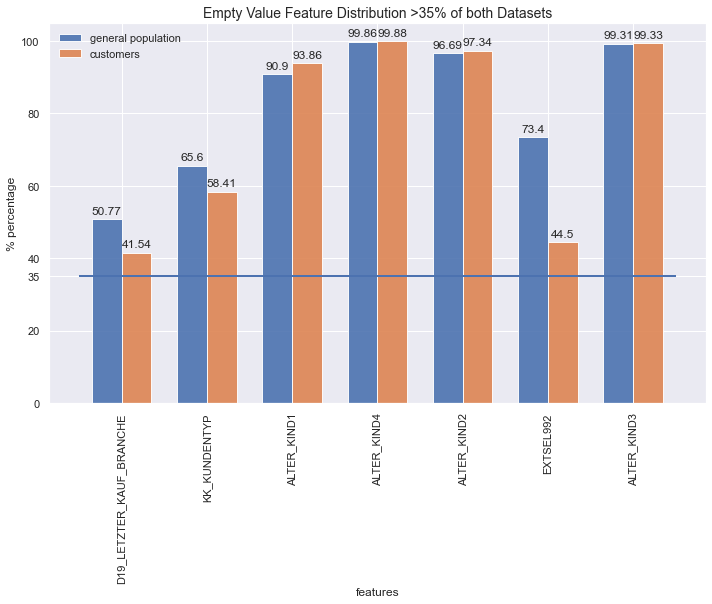

In [350]:
plot_NaN_distribution(feat_labels=perc35_labels,
                      values_set1=az_perc35_values, values_set2=cstmr_perc35_values,
                      label_set1='general population', label_set2='customers', barwidth=0.35)

### 2.5 Mapping of 'unknown' or 'not-classified' or Similar Values to NaN
An additional topic are the categories 'unknown' or 'no classification possible' or 'uniformly distributed' or 'no transactions known' resp. 'no transaction known'. Such feature values would not deliver an information to improve the project analysis by now, because the values having such content are different. Therefore we map them to NaN and calculate the percentage of empty values again.

In [392]:
# from dias attribute file, find all with 'unknown' included or 'no classification possible'
similarNaN = ["unknown", "no classification possible", "uniformly distributed", "no transactions known", "no transaction known"]
df_unknown_not_classified = df_dias_attr.query(
    'Meaning == "unknown" or Meaning == "no classification possible" or Meaning == "uniformly distributed" or Meaning == "no transactions known" or Meaning == "no transaction known"'
)
df_unknown_not_classified

,Attribute,Value,Meaning
0,AGER_TYP,-1,unknown
1,AGER_TYP,0,no classification possible
5,ALTERSKATEGORIE_GROB,"-1, 0",unknown
10,ALTERSKATEGORIE_GROB,9,uniformly distributed
33,ANREDE_KZ,"-1, 0",unknown
...,...,...,...
2219,WOHNDAUER_2008,"-1, 0",unknown
2229,WOHNLAGE,-1,unknown
2238,WACHSTUMSGEBIET_NB,"-1, 0",unknown
2244,W_KEIT_KIND_HH,"-1, 0",unknown


In [394]:
# add the undescribed features to this list
# df_undescrb_feat_infos.loc[['D19_VERSI_DATUM', 'D19_VERSI_OFFLINE_DATUM', 'D19_VERSI_ONLINE_DATUM'], ['map10_to_NaN']] = 1
index_last = df_unknown_not_classified.index[-1]
df_mapNaN_add = pd.DataFrame(
    {'Attribute': ["D19_VERSI_DATUM", "D19_VERSI_OFFLINE_DATUM", "D19_VERSI_ONLINE_DATUM"],
     'Value': [10, 10, 10],
     'Meaning': ["no transactions known", "no transactions known", "no transactions known"],},
    index=[index_last+1, index_last+2, index_last+3])

frames = [df_unknown_not_classified, df_mapNaN_add]
df_unknown_not_classified = pd.concat(frames, ignore_index=False)

In [395]:
df_unknown_not_classified

,Attribute,Value,Meaning
0,AGER_TYP,-1,unknown
1,AGER_TYP,0,no classification possible
5,ALTERSKATEGORIE_GROB,"-1, 0",unknown
10,ALTERSKATEGORIE_GROB,9,uniformly distributed
33,ANREDE_KZ,"-1, 0",unknown
...,...,...,...
2244,W_KEIT_KIND_HH,"-1, 0",unknown
2251,ZABEOTYP,"-1, 9",unknown
2252,D19_VERSI_DATUM,10,no transactions known
2253,D19_VERSI_OFFLINE_DATUM,10,no transactions known


In [396]:
df_unknown_not_classified.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 293 entries, 0 to 2254
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Attribute  293 non-null    object
 1   Value      293 non-null    object
 2   Meaning    293 non-null    object
dtypes: object(3)
memory usage: 9.2+ KB


For this NaN mapping activities only the column labels of the dataframes 'azdias' and 'customers' shall be used. We have to test if the column label values stored in <i>df_unknown_not_classified['Attributes']</i> are all available in the datasets to be modified. This happens in function helper_map_to_nan().

**Azdias dataset**

In [370]:
# iterating over multiple columns via apply and usage of def map_to_nan(df, clm, val)
%time df_unknown_not_classified.apply(lambda row: helper_map_to_nan(azdias, row['Attribute'], row['Value']), axis = 1)
azdias.head(15)

Wall time: 1.42 s


,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

**Customers dataset**

In [371]:
%time df_unknown_not_classified.apply(lambda row: helper_map_to_nan(customers, row['Attribute'], row['Value']), axis = 1)
customers.head(15)

Wall time: 328 ms


,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

### 2.6 New Empty Value Feature Percentages of Datasets (>35%) and Visualisation
Now, after having done some column modifications, are there much more features including NaN values >35%? If yes and not already available, add the new ones to the columns drop list.

In [417]:
%time dict_az_over35perc_mod, dict_az_less36perc_mod = get_empty_values_info(df=azdias, name='azdias')

Amount of azdias columns included NaN/NaT values:
1. 'VHN' includes: 121196, means: 13.6%
2. 'KBA05_KRSZUL' includes: 148110, means: 16.62%
3. 'KBA13_HERST_FORD_OPEL' includes: 105800, means: 11.87%
4. 'KBA13_ANTG1' includes: 105800, means: 11.87%
5. 'SEMIO_TRADV' includes: 0, means: 0.0%
6. 'D19_WEIN_FEINKOST' includes: 0, means: 0.0%
7. 'D19_DROGERIEARTIKEL' includes: 0, means: 0.0%
8. 'SEMIO_PFLICHT' includes: 0, means: 0.0%
9. 'INNENSTADT' includes: 93740, means: 10.52%
10. 'KBA13_VORB_0' includes: 105800, means: 11.87%
11. 'KBA13_HERST_SONST' includes: 105800, means: 11.87%
12. 'KBA13_KMH_251' includes: 105800, means: 11.87%
13. 'KBA05_MAXVORB' includes: 148110, means: 16.62%
14. 'KBA05_VORB1' includes: 148110, means: 16.62%
15. 'KBA13_KRSAQUOT' includes: 105800, means: 11.87%
16. 'LP_FAMILIE_FEIN' includes: 4854, means: 0.5446%
17. 'HH_EINKOMMEN_SCORE' includes: 18348, means: 2.059%
18. 'KBA13_SEG_SPORTWAGEN' includes: 105800, means: 11.87%
19. 'KBA13_VORB_2' includes: 105800, me

138. 'KBA13_CCM_2000' includes: 105800, means: 11.87%
139. 'KBA05_KW2' includes: 148110, means: 16.62%
140. 'KBA05_CCM4' includes: 148110, means: 16.62%
141. 'PLZ8_ANTG4' includes: 116515, means: 13.07%
142. 'D19_BANKEN_LOKAL' includes: 0, means: 0.0%
143. 'FINANZ_UNAUFFAELLIGER' includes: 0, means: 0.0%
144. 'KOMBIALTER' includes: 0, means: 0.0%
145. 'KBA13_HALTER_30' includes: 105800, means: 11.87%
146. 'KBA13_ANZAHL_PKW' includes: 105800, means: 11.87%
147. 'KBA13_VORB_3' includes: 105800, means: 11.87%
148. 'AKT_DAT_KL' includes: 73499, means: 8.247%
149. 'KBA05_ANTG3' includes: 133324, means: 14.96%
150. 'KONSUMNAEHE' includes: 73969, means: 8.3%
151. 'KBA13_SEG_OBEREMITTELKLASSE' includes: 105800, means: 11.87%
152. 'KBA13_KW_40' includes: 105800, means: 11.87%
153. 'UNGLEICHENN_FLAG' includes: 73499, means: 8.247%
154. 'VK_DHT4A' includes: 75917, means: 8.518%
155. 'KBA13_ANTG3' includes: 105800, means: 11.87%
156. 'KBA13_SEG_OBERKLASSE' includes: 105800, means: 11.87%
157. 'D19

276. 'KBA13_KMH_0_140' includes: 105800, means: 11.87%
277. 'D19_RATGEBER' includes: 0, means: 0.0%
278. 'VHA' includes: 73499, means: 8.247%
279. 'KBA05_HERST5' includes: 148110, means: 16.62%
280. 'PRAEGENDE_JUGENDJAHRE' includes: 108164, means: 12.14%
281. 'KBA13_BJ_2008' includes: 105800, means: 11.87%
282. 'KBA05_HERSTTEMP' includes: 110037, means: 12.35%
283. 'KBA05_VORB0' includes: 148110, means: 16.62%
284. 'KBA05_ALTER4' includes: 148110, means: 16.62%
285. 'KBA05_KRSOBER' includes: 148110, means: 16.62%
286. 'KBA13_CCM_1200' includes: 105800, means: 11.87%
287. 'KBA05_MOD1' includes: 148110, means: 16.62%
288. 'KBA13_KW_0_60' includes: 105800, means: 11.87%
289. 'KBA13_SITZE_5' includes: 105800, means: 11.87%
290. 'KBA05_MOTRAD' includes: 146536, means: 16.44%
291. 'D19_TECHNIK' includes: 0, means: 0.0%
292. 'KBA13_KRSZUL_NEU' includes: 105800, means: 11.87%
293. 'PLZ8_HHZ' includes: 116515, means: 13.07%
294. 'KBA13_CCM_1401_2500' includes: 105800, means: 11.87%
295. 'D19_VE

In [418]:
print("\033[1m>35% Empty Value Percentages of 'General Population - azdias' dataset after modifications ...\033[0m")
if len(dict_az_over35perc_mod.items()) > 0:
    for key, value in dict_az_over35perc_mod.items():
        print(key, ' : no. {}, perc. {:.4}%'.format(value[0], value[1]))
else:
    print("No features found with amount of NaN values > 35%.")

>35% Empty Value Percentages of 'General Population - azdias' dataset after modifications ...
D19_GESAMT_OFFLINE_DATUM  : no. 558558, perc. 62.67%
D19_LETZTER_KAUF_BRANCHE  : no. 452451, perc. 50.77%
D19_VERSI_ANZ_24  : no. 777037, perc. 87.19%
D19_VERSAND_ONLINE_DATUM  : no. 494464, perc. 55.48%
TITEL_KZ  : no. 889061, perc. 99.76%
KK_KUNDENTYP  : no. 584612, perc. 65.6%
D19_TELKO_OFFLINE_DATUM  : no. 819114, perc. 91.91%
D19_TELKO_ANZ_24  : no. 826208, perc. 92.71%
D19_TELKO_DATUM  : no. 665798, perc. 74.71%
ALTER_KIND1  : no. 810163, perc. 90.9%
D19_BANKEN_ONLINE_DATUM  : no. 726982, perc. 81.57%
KBA05_BAUMAX  : no. 476524, perc. 53.47%
D19_GESAMT_ANZ_12  : no. 584797, perc. 65.62%
D19_GESAMT_ANZ_24  : no. 505303, perc. 56.7%
D19_VERSAND_ANZ_12  : no. 637972, perc. 71.58%
AGER_TYP  : no. 685843, perc. 76.96%
D19_VERSAND_OFFLINE_DATUM  : no. 634233, perc. 71.16%
ALTER_KIND4  : no. 890016, perc. 99.86%
ALTER_KIND2  : no. 861722, perc. 96.69%
EXTSEL992  : no. 654153, perc. 73.4%
D19_TE

In [419]:
az_mod_noNaN = [k for k,v in dict_az_less36perc_mod.items() if float(v[0]) == 0]
print("There are {} columns out of {} of the azdias dataset, not including any NaN values.".
      format(len(az_mod_noNaN), customers.shape[1]))
#print("These features are:")
#az_mod_noNaN

There are 61 columns out of 366 of the azdias dataset, not including any NaN values.


In [376]:
%time dict_cstmr_over35perc_mod, dict_cstmr_less36perc_mod = get_empty_values_info(customers, 'customers')

Amount of customers columns included NaN/NaT values:
1. 'VHN' includes: 54260, means: 28.31%
2. 'KBA05_KRSZUL' includes: 56913, means: 29.7%
3. 'KBA13_HERST_FORD_OPEL' includes: 51281, means: 26.76%
4. 'KBA13_ANTG1' includes: 51281, means: 26.76%
5. 'SEMIO_TRADV' includes: 0, means: 0.0%
6. 'D19_WEIN_FEINKOST' includes: 0, means: 0.0%
7. 'D19_DROGERIEARTIKEL' includes: 0, means: 0.0%
8. 'SEMIO_PFLICHT' includes: 0, means: 0.0%
9. 'INNENSTADT' includes: 49959, means: 26.07%
10. 'KBA13_VORB_0' includes: 51281, means: 26.76%
11. 'KBA13_HERST_SONST' includes: 51281, means: 26.76%
12. 'KBA13_KMH_251' includes: 51281, means: 26.76%
13. 'KBA05_MAXVORB' includes: 56913, means: 29.7%
14. 'KBA05_VORB1' includes: 56913, means: 29.7%
15. 'KBA13_KRSAQUOT' includes: 51281, means: 26.76%
16. 'LP_FAMILIE_FEIN' includes: 3213, means: 1.676%
17. 'HH_EINKOMMEN_SCORE' includes: 2968, means: 1.549%
18. 'KBA13_SEG_SPORTWAGEN' includes: 51281, means: 26.76%
19. 'KBA13_VORB_2' includes: 51281, means: 26.76%
2

144. 'KOMBIALTER' includes: 0, means: 0.0%
145. 'KBA13_HALTER_30' includes: 51281, means: 26.76%
146. 'KBA13_ANZAHL_PKW' includes: 51281, means: 26.76%
147. 'KBA13_VORB_3' includes: 51281, means: 26.76%
148. 'AKT_DAT_KL' includes: 46596, means: 24.31%
149. 'KBA05_ANTG3' includes: 55980, means: 29.21%
150. 'KONSUMNAEHE' includes: 46651, means: 24.34%
151. 'KBA13_SEG_OBEREMITTELKLASSE' includes: 51281, means: 26.76%
152. 'KBA13_KW_40' includes: 51281, means: 26.76%
153. 'UNGLEICHENN_FLAG' includes: 46596, means: 24.31%
154. 'VK_DHT4A' includes: 47871, means: 24.98%
155. 'KBA13_ANTG3' includes: 51281, means: 26.76%
156. 'KBA13_SEG_OBERKLASSE' includes: 51281, means: 26.76%
157. 'D19_REISEN' includes: 0, means: 0.0%
158. 'KBA13_KW_70' includes: 51281, means: 26.76%
159. 'KBA13_BJ_2004' includes: 51281, means: 26.76%
160. 'KBA13_NISSAN' includes: 51281, means: 26.76%
161. 'KBA05_ALTER3' includes: 56913, means: 29.7%
162. 'KBA13_PEUGEOT' includes: 51281, means: 26.76%
163. 'ONLINE_AFFINITAET

287. 'KBA05_MOD1' includes: 56913, means: 29.7%
288. 'KBA13_KW_0_60' includes: 51281, means: 26.76%
289. 'KBA13_SITZE_5' includes: 51281, means: 26.76%
290. 'KBA05_MOTRAD' includes: 56857, means: 29.67%
291. 'D19_TECHNIK' includes: 0, means: 0.0%
292. 'KBA13_KRSZUL_NEU' includes: 51281, means: 26.76%
293. 'PLZ8_HHZ' includes: 52764, means: 27.53%
294. 'KBA13_CCM_1401_2500' includes: 51281, means: 26.76%
295. 'D19_VERSAND_REST' includes: 0, means: 0.0%
296. 'CAMEO_DEUG_2015' includes: 50554, means: 26.38%
297. 'KBA13_KRSHERST_BMW_BENZ' includes: 51281, means: 26.76%
298. 'D19_GESAMT_DATUM' includes: 60536, means: 31.59%
299. 'D19_TELKO_MOBILE' includes: 0, means: 0.0%
300. 'KBA05_ZUL1' includes: 56913, means: 29.7%
301. 'KBA13_HALTER_55' includes: 51281, means: 26.76%
302. 'KBA13_FORD' includes: 51281, means: 26.76%
303. 'KBA05_MAXBJ' includes: 56913, means: 29.7%
304. 'CJT_TYP_1' includes: 3213, means: 1.676%
305. 'WOHNDAUER_2008' includes: 46596, means: 24.31%
306. 'D19_VERSI_ANZ_12' 

In [377]:
print("\033[1m>35% Empty Value Percentages of 'Customers' dataset after modifications ...\033[0m")
if len(dict_cstmr_over35perc_mod.items()) > 0:
    for key, value in dict_cstmr_over35perc_mod.items():
        print(key, ' : no. {}, perc. {:.4}%'.format(value[0], value[1]))
else:
    print("No features found with amount of NaN values > 35%.")

>35% Empty Value Percentages of 'Customers' dataset after modifications ...
D19_GESAMT_OFFLINE_DATUM  : no. 89296, perc. 46.59%
D19_LETZTER_KAUF_BRANCHE  : no. 79607, perc. 41.54%
D19_VERSI_ANZ_24  : no. 168832, perc. 88.09%
D19_VERSAND_ONLINE_DATUM  : no. 97607, perc. 50.93%
TITEL_KZ  : no. 189340, perc. 98.79%
KK_KUNDENTYP  : no. 111937, perc. 58.41%
D19_TELKO_OFFLINE_DATUM  : no. 175675, perc. 91.66%
D19_TELKO_ANZ_24  : no. 178411, perc. 93.09%
D19_TELKO_DATUM  : no. 148915, perc. 77.7%
ALTER_KIND1  : no. 179886, perc. 93.86%
D19_BANKEN_ONLINE_DATUM  : no. 167585, perc. 87.44%
KBA05_BAUMAX  : no. 109535, perc. 57.15%
D19_GESAMT_ANZ_12  : no. 111999, perc. 58.44%
D19_GESAMT_ANZ_24  : no. 91722, perc. 47.86%
D19_VERSAND_ANZ_12  : no. 122306, perc. 63.82%
AGER_TYP  : no. 96738, perc. 50.48%
D19_VERSAND_OFFLINE_DATUM  : no. 100061, perc. 52.21%
ALTER_KIND4  : no. 191416, perc. 99.88%
ALTER_KIND2  : no. 186552, perc. 97.34%
EXTSEL992  : no. 85283, perc. 44.5%
D19_TELKO_ANZ_12  : no. 1844

In [378]:
cstmr_mod_noNaN = [k for k,v in dict_cstmr_less36perc_mod.items() if float(v[0]) == 0]
print("There are {} columns out of {} of the customers dataset, not including any NaN values.".
      format(len(cstmr_mod_noNaN), customers.shape[1]))
#print("These features are:")
#cstmr_mod_noNaN

There are 61 columns out of 366 of the customers dataset, not including any NaN values.


In [379]:
print("Are the new created >35% empty values feature files of the datasets include the same item keys? Answer: {}".
      format(dict_az_over35perc_mod.keys() == dict_cstmr_over35perc_mod.keys()))

Are the new created >35% empty values feature files of the datasets include the same item keys? Answer: False


Where is the difference?

In [420]:
set(dict_az_over35perc_mod.keys() - dict_cstmr_over35perc_mod.keys())

{'D19_GESAMT_DATUM'}

In the customers dataset,this feature 'D19_GESAMT_DATUM' includes: 60536 NaN values, means: 31.59%. Because this is still a high number, even not being >35%, we put this feature on our drop list.

In [422]:
dict_az_over35perc_mod.keys()

dict_keys(['D19_GESAMT_OFFLINE_DATUM', 'D19_LETZTER_KAUF_BRANCHE', 'D19_VERSI_ANZ_24', 'D19_VERSAND_ONLINE_DATUM', 'TITEL_KZ', 'KK_KUNDENTYP', 'D19_TELKO_OFFLINE_DATUM', 'D19_TELKO_ANZ_24', 'D19_TELKO_DATUM', 'ALTER_KIND1', 'D19_BANKEN_ONLINE_DATUM', 'KBA05_BAUMAX', 'D19_GESAMT_ANZ_12', 'D19_GESAMT_ANZ_24', 'D19_VERSAND_ANZ_12', 'AGER_TYP', 'D19_VERSAND_OFFLINE_DATUM', 'ALTER_KIND4', 'ALTER_KIND2', 'EXTSEL992', 'D19_TELKO_ANZ_12', 'D19_GESAMT_ONLINE_DATUM', 'D19_VERSI_DATUM', 'D19_GESAMT_DATUM', 'D19_VERSI_ANZ_12', 'D19_VERSAND_ANZ_24', 'D19_VERSAND_DATUM', 'D19_BANKEN_DATUM', 'D19_VERSI_OFFLINE_DATUM', 'D19_VERSI_ONLINE_DATUM', 'D19_TELKO_ONLINE_DATUM', 'D19_BANKEN_OFFLINE_DATUM', 'D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24', 'ALTER_KIND3'])

In [421]:
az_set = set(dict_az_over35perc_mod.keys())
diff = [x for x in az_set if x not in clm_drop_list]
diff

[]

In [381]:
clm_drop_list

['LNR',
 'ALTER_KIND1',
 'ALTER_KIND2',
 'ALTER_KIND3',
 'ALTER_KIND4',
 'D19_LETZTER_KAUF_BRANCHE',
 'EXTSEL992',
 'KK_KUNDENTYP']

Our new drop list includes the following items:

In [382]:
clm_drop_list.extend(diff)
clm_drop_list

['LNR',
 'ALTER_KIND1',
 'ALTER_KIND2',
 'ALTER_KIND3',
 'ALTER_KIND4',
 'D19_LETZTER_KAUF_BRANCHE',
 'EXTSEL992',
 'KK_KUNDENTYP',
 'D19_VERSI_OFFLINE_DATUM',
 'D19_TELKO_ANZ_24',
 'D19_VERSAND_ANZ_24',
 'D19_VERSI_ONLINE_DATUM',
 'D19_BANKEN_ONLINE_DATUM',
 'KBA05_BAUMAX',
 'D19_VERSI_ANZ_24',
 'AGER_TYP',
 'D19_TELKO_ONLINE_DATUM',
 'D19_TELKO_ANZ_12',
 'D19_VERSAND_OFFLINE_DATUM',
 'D19_TELKO_OFFLINE_DATUM',
 'D19_GESAMT_ONLINE_DATUM',
 'D19_VERSI_DATUM',
 'D19_VERSAND_DATUM',
 'D19_BANKEN_OFFLINE_DATUM',
 'D19_VERSAND_ONLINE_DATUM',
 'D19_GESAMT_ANZ_12',
 'D19_GESAMT_DATUM',
 'D19_BANKEN_ANZ_12',
 'D19_TELKO_DATUM',
 'D19_BANKEN_ANZ_24',
 'D19_VERSI_ANZ_12',
 'D19_GESAMT_OFFLINE_DATUM',
 'TITEL_KZ',
 'D19_GESAMT_ANZ_24',
 'D19_VERSAND_ANZ_12',
 'D19_BANKEN_DATUM']

Now, we visualise this new empty value feature distribution of the modified datasets (but without D19_GESAMT_DATUM for the azdias data).

In [426]:
# getting percentage values by using list comprehension
az_perc35_values = []
for i in dict_az_over35perc_mod:
    if i != 'D19_GESAMT_DATUM':
        az_perc35_values.append(dict_az_over35perc_mod[i][1])

In [427]:
len(az_perc35_values)

34

In [384]:
cstmr_perc35_values = []
for i in dict_cstmr_over35perc_mod:
    cstmr_perc35_values.append(dict_cstmr_over35perc_mod[i][1])

In [406]:
len(cstmr_perc35_values)

34

In [385]:
perc35_labels = list(dict_cstmr_over35perc_mod.keys())

In [430]:
def plot_NaN_distribution(feat_labels, values_set1, values_set2, label_set1, label_set2, figsize=(10, 8.5), xmax=6.5, barwidth=0.35):
    '''
    Plots the NaN distribution being higher 35% for 2 dataset values
    
    Input:
        feat_labels - feature list to be shown by bars
        values_set1 - list of NaN percentage values of dataset 1 dictionary (must be higher 35%)
        values_set2 - list of NaN percentage values of dataset 2 dictionary (must be higher 35%)
        label_set1 - general string name of dataset 1
        label_set2 - general string name of dataset 2
        figsize - (optional) default value (10, 6)
        xmax - needed to draw the 35% horizontal line
    Output:
        the plotted bar diagram
    '''

    x = np.arange(len(feat_labels))  # the label locations
    width = barwidth  # the width of the bars, 0.35 as default

    fig, ax = plt.subplots(figsize=figsize)
    rects1 = ax.bar(x - width/2, values_set1, width, label=label_set1, alpha=0.9)
    rects2 = ax.bar(x + width/2, values_set2, width, label=label_set2, alpha=0.9)

    # Add some text for labels, title and custom axis tick labels, etc.
    ax.set_title('Empty Value Feature Distribution >35% of both Datasets', size=14)
    ax.set_xticks(x)
    plt.xticks(rotation=90)
    ax.set_xticklabels(feat_labels)
    extratick = [35]
    ax.set_yticks(list(ax.get_yticks()) + extratick)
    ax.legend(loc='best', frameon=False)
    ax.hlines(y=35,  xmin=-0.5, xmax=xmax, linewidth=2, color='b', linestyle='-')
    ax.set_ylabel('% percentage')
    ax.set_xlabel('features')

    def autolabel(rects, heights=None):
        '''
        Attaches a text label above each bar in *rects*, displaying its height.
        '''
        if heights is None:  # bar chart
            for rect in rects:
                height = rect.get_height()          
                ax.annotate('{}'.format(height),
                            xy=(rect.get_x() + rect.get_width() / 2, height),
                            xytext=(0, 3),  # 3 points vertical offset
                            textcoords="offset points",
                            ha='center', va='bottom', fontsize=12)
        else:  # histogram
            i = 0
            for rect in rects:
                ax.annotate('{}'.format(heights[i]),
                            xy=(rect, heights[i]),
                            xytext=(0, 3),  # 3 points vertical offset
                            textcoords="offset points",
                            ha='left', va='bottom')
                i += 1         

    autolabel(rects1)
    autolabel(rects2)

    fig.tight_layout();

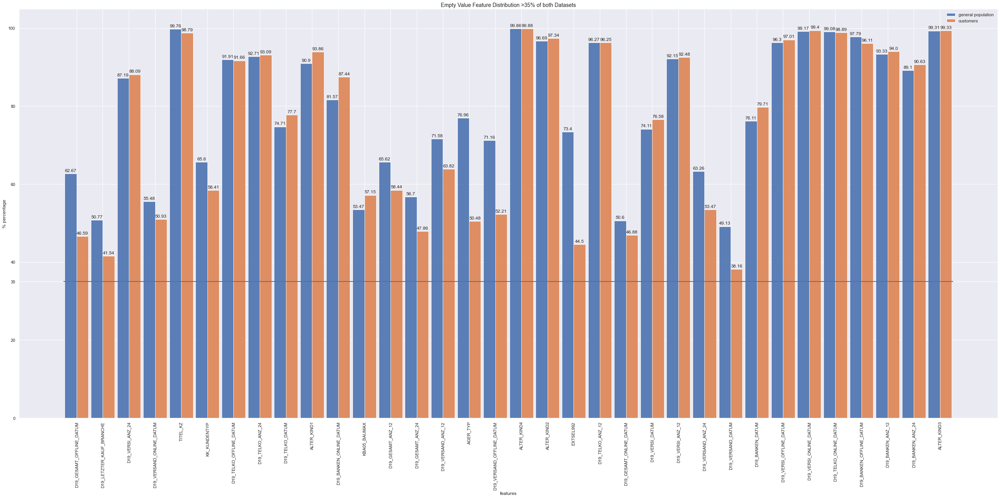

In [455]:
plot_NaN_distribution(feat_labels=perc35_labels,
                      values_set1=az_perc35_values, values_set2=cstmr_perc35_values,
                      label_set1='general population', label_set2='customers',
                      figsize=(36, 18), xmax=33.5, barwidth=0.45)  # figsize, xmax, barwidth depends on the number of found features

There are big differences between both datasets regarding NaN values.

### 2.7 Features and their Skewness resp. Cardinality
As already mentioned, there are a lot of categorical features. Most of them are represented by an ordinal, intrinsic integer order, but some don't have an order regarding the text explanations. This ones are mapped to an integer value without any kind of order. Beside this ordering aspect, which actually may not exist regarding the feature content, the integer values in general could have a misleading interpretation. The numbers could be choosen differently, instead of 1, 2 or 3 it could 1000, 30000 and 100000. Our machine learning models would be effected by direct usage of this numbers, because the models could not differentiate the integer interpretations. The last example is the mapping of the same aspects and the relationship should be the same, if an ordering has explicitly choosen or not. 

We need to model this all mathematically, e.g. by one-hot-encoding, but this has disadvantages: To do that for all categorical values would result in a very huge amount of features (means a much higher dimensionality problem) and a correlation matrix would show a lot of highly  correlated features which would lead a model to overfit.

By now, we explicitly encoded the 'OST_WEST_KZ' feature (mapped the strings to 0 and 1 and added np.nan for unknowns) and the 'ANREDE_KZ' feature (mapped to 1-male, 2-female and 3-others).

In the following [blog](http://www.willmcginnis.com/2015/11/29/beyond-one-hot-an-exploration-of-categorical-variables/) and additional comments there, better encoding techniques are mentioned. But with this (first) project process, for simplicity, we don't change the existing ordinal encodings even known, that some don't have an actual ordering.

Nevertheless, an open topic is still **feature granularity**. We have detected at least already 2 features for further investigation: 'CAMEO_DEU_2015' and 'LP_LEBENSPHASE_FEIN'.<br>
- 'CAMEO_DEU_2015' has already been changed using general integer value numbers up to 9.
- 'LP_LEBENSPHASE_FEIN' can be dropped, next correlation measures show that there is a strong correlation to the feature 'LP_LEBENSPHASE_GROB'  

In general with existing nominal and ordinal encodings, we could treat such encoded categorical values as a kind of pseudo-numerical compared to the numerical continuous features. In the Excel files are marked only **few numerical features**, mainly coded from 1 up to 10, means they should in the same range as the other discrete features: 
- ANZ_HAUSHALTE_AKTIV
- ANZ_HH_TITEL
- ANZ_PERSONEN
- ANZ_TITEL

Another numerical feature is 'KBA13_ANZAHL_PKW'. What kind of unique values exist? We investigate it in a few seconds.<br>
Furthermore after modifications, 4 features include <i>year</i> information numbers: 'GEBURTSJAHR', 'MIN_GEBAEUDEJAHR', 'EINGEZOGENAM_HH_JAHR' and the modified 'EINGEFUEGT_AM' treated as floats.

So as mentioned, mainly we are dealing with discrete feature values. Even been classified as numerical float values (see datatype overview information of the datasets), they are not treated as continuous ones. 

To evaluate, if we have non-normal distributions, we have to calculate the skewness of the features. More information about skewness can be found at this [link](https://en.wikipedia.org/wiki/Skewness). As a short general overview: Skewness is a statistical measure that quantifies the symmetry of the distribution:
- A skewness value of 0 in the output denotes a symmetrical distribution of values.
- A negative skewness value in the output indicates an asymmetry in the distribution and the tail is larger towards the left hand side of the distribution.
- A positive skewness value in the output indicates an asymmetry in the distribution and the tail is larger towards the right hand side of the distribution.
- A right tailed distribution (positively skewed distribution) has its mean greater than the median as the outliers present in the skewed right tail of the distribution influence the mean.
- A left tailed distribution has its mean smaller than the median.

But for skewness normally only real continuous feature values are investigated, and we don't have them.

What we can do is to investigate rare categories in our encoded, discrete categorical variables, especially for the already identified one with high cardinality (except 'LNR' being an index feature and already on drop list):
- **KBA13_ANZAHL_PKW**

In [456]:
azdias['KBA13_ANZAHL_PKW'].unique()

array([ nan, 963., 712., ...,   2.,  30.,   7.])

In [457]:
azdias['KBA13_ANZAHL_PKW'].max()

2300.0

In [458]:
azdias['KBA13_ANZAHL_PKW'].nunique()

1261

In [459]:
azdias['KBA13_ANZAHL_PKW'].value_counts()

1400.0    11722
1500.0     8291
1300.0     6427
1600.0     6135
1700.0     3795
          ...  
3.0           6
8.0           6
2.0           6
7.0           5
6.0           5
Name: KBA13_ANZAHL_PKW, Length: 1261, dtype: int64

In [460]:
# sorted percentage of each value category of the feature 'KBA13_ANZAHL_PKW'
azdias['KBA13_ANZAHL_PKW'].value_counts() * 100 / azdias.shape[0]

1400.0    1.315274
1500.0    0.930297
1300.0    0.721145
1600.0    0.688381
1700.0    0.425820
            ...   
3.0       0.000673
8.0       0.000673
2.0       0.000673
7.0       0.000561
6.0       0.000561
Name: KBA13_ANZAHL_PKW, Length: 1261, dtype: float64

As we can see, all car feature values are rare frequent, means <5%.

In [ ]:
# feature skewness: 1.26 
#
# note: this skewness value has been calculated with the skew() function of pandas library
# coding e.g. for all features would be:
#
#%time az_skewness_features = round(azdias.skew(axis = 0, skipna = True, numeric_only=True), 2)
#print("\033[1mSkewness of series items (azdias dataset):\033[0m")
#print(az_skewness_features.to_string())
#df_az_skew = pd.DataFrame(data=cstmr_skewness_features, columns=['skewness'])
#print("------")
#print(df_az_skew.info())
#df_az_skew_mod = df_az_skew.query("skewness >1 or skewness <-1")
#print(df_az_skew_mod.info())
#print("------")
#print("\n\033[1mSkewness of features with value >1 or <-1:\033[0m")
#print(df_az_skew_mod.to_string())
#print horizontal bar chart of features skewness values
#ax = df_az_skew_mod.plot.barh(figsize=(18, 40));
#ax.set_title('Skewness distribution of azdias dataset features: >1 or <-1', fontsize=15);

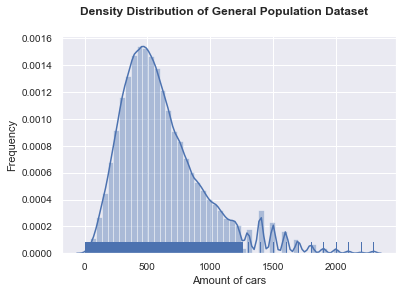

In [461]:
# skewness: 1.26
plot_histogram(azdias['KBA13_ANZAHL_PKW'], 'Amount of cars', 'General Population')

Here, even being a discrete feature, having a high cardinality its value distribution showed a visible skewness. How is it in the customers dataset?

In [462]:
customers['KBA13_ANZAHL_PKW'].unique()

array([1201.,   nan,  433., ...,   77.,   13.,   34.])

In [463]:
customers['KBA13_ANZAHL_PKW'].max()

2300.0

In [464]:
customers['KBA13_ANZAHL_PKW'].nunique()

1250

In [465]:
print("Sorted percentage of each value category of the feature 'KBA13_ANZAHL_PKW'")
customers['KBA13_ANZAHL_PKW'].value_counts() * 100 / customers.shape[0]

Sorted percentage of each value category of the feature 'KBA13_ANZAHL_PKW'


1400.0    1.298708
1500.0    0.896416
1300.0    0.737274
1600.0    0.659529
1700.0    0.415336
            ...   
16.0      0.000522
43.0      0.000522
48.0      0.000522
34.0      0.000522
77.0      0.000522
Name: KBA13_ANZAHL_PKW, Length: 1250, dtype: float64

As we can see, all car feature values are rare frequent, means <5%.

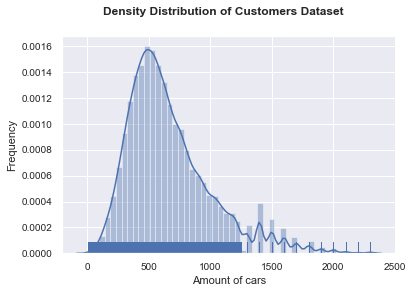

In [466]:
plot_histogram(customers['KBA13_ANZAHL_PKW'], 'Amount of cars', 'Customers')

The azdias and the customers datasets have nearly the same car amount distribution. Both have a positive skewness value, with a mode peak value of around 500 and some high outliers >2000. The course of the curves are looking similar. 

After having done a log transformation for this feature the distribution looked skewed in the opposite direction, so, this coding is deleted and we don't change it now. Before doing the dimensionality reduction, we do a scaling for some features (this one is included there).

### 2.7 Feature Correlation

**Next step** is to have a look if there are **<i>correlations</i>** between the features. Our project goal is to build efficient machine learning models including features which delivers the needed variance of the outcome. So, we have to compare the pairwise correlations of our continuous and categorical features. Having a high correlation there is a hint to need only one of this features. But having a lot of categorical features in our project datasets (ranked ordinal and nominal ones), the general correlation matrix as it exists for continuous values is not the best concept to use (scikit-learn default configuration is: pearson correlation measure). 

What kind of measure can we use to look for the association between such features? The common correlation measures are:
- Pearson (sensitive to outliers, linear variables association, homoscedasticity assumption)
- Spearman rank (rank correlation)
- Kendall Tau (rank correlation)
- Goodman Kruskal’s Gamma (rank correlation)

Additionally, according Shaked Zychlinski's blog [post](https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9) we need the <i>[Correlation Ratio](https://en.wikipedia.org/wiki/Correlation_ratio)</i> to deal with the mixture of continuous and categorical features. As he writes "Mathematically, it is defined as the weighted variance of the mean of each category divided by the variance of all samples; in human language, the Correlation Ratio answers the following question: Given a continuous number, how well can you know to which category it belongs to? Just like the two coefficients we’ve seen before, here too the output is on the range of [0,1]."

We try to calculate the correlation values directly by the associated pandas function. For Python 3.x, the following blog [post](https://stackoverflow.com/questions/47340000/how-to-get-rid-of-runtimewarning-invalid-value-encountered-in-greater) proposed a masking for the empty values, but we don't know the thresholds. This additional implementation has not been done.

Instead, our already existing knowledge about the dataframe and its distribution let us assume that the assumption of homoscedasticity (means homogeneity of variance) is not true.<br>
The <i>Spearman rank correlation</i> is a non-parametric test that does not make any assumptions about the distribution of the data. Therefore we use that correlation approach.

The strength of the correlation matters. The closer the absolute value is to 1, the stronger the correlation. R values and their interpretation strength is:<br>
- 0.0 – 0.2 : Weak correlation
- 0.3 – 0.6 : Moderate correlation
- 0.7 – 1.0 : Strong correlation

Have in mind, that as disadvantage a pairwise correlation investigation does not include multifactorial dependencies (multi-collinearity). So, we will not delete all feature pairs having a strong correlation value. We decide together with feature content information one-by-one only for the highest ones >0.9 or round about 0.9.

In [467]:
# choose dataframe except already identified columns to drop
df_az_mod = azdias[azdias.columns.difference(clm_drop_list)]

In [468]:
# pandas corr(): missing values for the variables being compared are excluded
%time pd_az_corr_matrix = df_az_mod.corr(method='spearman')
pd_az_corr_matrix

Wall time: 2h 1min 36s


,AKT_DAT_KL,ALTERSKATEGORIE_FEIN,ALTERSKATEGORIE_GROB,ALTER_HH,ANREDE_KZ,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEUG_2015,CAMEO_DEU_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_MOBILE,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSICHERUNGEN,D19_VERSI_ONLINE_QUOTE_12,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,FINANZTYP,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,KBA13_KW_90,KBA13_MAZDA,KBA13_MERCEDES,KBA13_MOTOR,KBA13_NISSAN,KBA13_OPEL,KBA13_PEUGEOT,KBA13_RENAULT,KBA13_SEG_GELAENDEWAGEN,KBA13_SEG_GROSSRAUMVANS,KBA13_SEG_KLEINST,KBA13_SEG_KLEINWAGEN,KBA13_SEG_KOMPAKTKLASSE,KBA13_SEG_MINIVANS,KBA13_SEG_MINIWAGEN,KBA13_SEG_MITTELKLASSE,KBA13_SEG_OBEREMITTELKLASSE,KBA13_SEG_OBERKLASSE,KBA13_SEG_SONSTIGE,KBA13_SEG_SPORTWAGEN,KBA13_SEG_UTILITIES,KBA13_SEG_VAN,KBA13_SEG_WOHNMOBILE,KBA13_SITZE_4,KBA13_SITZE_5,KBA13_SITZE_6,KBA13_TOYOTA,KBA13_VORB_0,KBA13_VORB_1,KBA13_VORB_1_2,KBA13_VORB_2,KBA13_VORB_3,KBA13_VW,KKK,KOMBIALTER,KONSUMNAEHE,KONSU

In [469]:
# def is used only once with the azdias dataset and therefore not part of the util.py file
def get_strong_corr(clm):
    '''
    Returns a dictionary with dataframe column names with fields including corr r-value > 0.7. 
    
    Input:
        clm - the column name of the dataframe columns list object 
              (from modified customers dataset: 'pd_cstm_corr_matrix' dataframe is used)
    Output:
        dict_corr_clms - the dictionary with correlation values > 0.7 as key and the associated
        column pair as list value; the diagonal with its 1.0 values for same feature pairs is not added.
        
    Description:
    We want to detect the items of the columns list, that fulfil the condition having a Spearman ranked 
    correlation value > 0.7.
    Therefore this get_strong_corr() function shall only be used with the associated() filter function.
    '''
    
    dict_corr_clms = {}
    clm_loc = pd_az_corr_matrix.columns.get_loc(clm)  # returns zero-based integer position
    
    select_indices = list(np.where(pd_az_corr_matrix[clm] > 0.7)[0])
    list_indices = pd_az_corr_matrix.iloc[select_indices].index.tolist()
    
    for i in list_indices:
        i_loc = pd_az_corr_matrix.index.get_loc(i)
        val = pd_az_corr_matrix.iat[i_loc, clm_loc]
        if i != clm:  # don't add <1.0 condition because there could be different columns having corr 1.0
            dict_corr_clms[val] = [i, clm]
        
    return dict_corr_clms

In [470]:
# list of dictionary items with correlation number as key and associated 2 feature list as value
dict_corr_clms_az = list(map(get_strong_corr, set(pd_az_corr_matrix.columns)))

In [471]:
# identify empty dict elements from the list and build new dict list without them
new_list_corr_clms = []
corr_len = len(dict_corr_clms_az)
for i in range(corr_len):
    if bool(dict_corr_clms_az[i]):
        new_list_corr_clms.append(dict_corr_clms_az[i])

In [472]:
print("\033[1mModified azdias dataframe and its Spearman ranked correlation values > 0.7:\033[0m")
if len(new_list_corr_clms) == 0:
    print("No features found with spearman ranked correlation values >0.7.")
new_list_corr_clms

Modified azdias dataframe and its Spearman ranked correlation values > 0.7:


[{0.8758382923148358: ['KBA05_ZUL4', 'KBA05_KRSZUL']},
 {0.717814382854374: ['KBA13_OPEL', 'KBA13_HERST_FORD_OPEL']},
 {0.9272721641513207: ['PLZ8_ANTG1', 'KBA13_ANTG1']},
 {0.7033609873249677: ['SEMIO_REL', 'SEMIO_PFLICHT']},
 {1.0: ['KBA13_FAB_SONSTIGE', 'KBA13_HERST_SONST']},
 {0.902355817718502: ['ANZ_PERSONEN', 'LP_FAMILIE_FEIN'],
  0.9955334657893966: ['LP_FAMILIE_GROB', 'LP_FAMILIE_FEIN'],
  0.9067585836358019: ['LP_LEBENSPHASE_FEIN', 'LP_FAMILIE_FEIN'],
  0.9179726169938417: ['LP_LEBENSPHASE_GROB', 'LP_FAMILIE_FEIN']},
 {0.7433399787330316: ['KBA13_BJ_1999', 'KBA13_VORB_2']},
 {0.9547544740244606: ['MIN_GEBAEUDEJAHR', 'EINGEFUEGT_AM']},
 {0.9547544740244606: ['EINGEFUEGT_AM', 'MIN_GEBAEUDEJAHR']},
 {0.8047510242987259: ['CJT_TYP_1', 'ALTERSKATEGORIE_FEIN'],
  0.8009340467562911: ['CJT_TYP_2', 'ALTERSKATEGORIE_FEIN'],
  0.8357800387445602: ['FINANZ_SPARER', 'ALTERSKATEGORIE_FEIN'],
  0.7008303637286417: ['FINANZ_UNAUFFAELLIGER', 'ALTERSKATEGORIE_FEIN'],
  0.8572342546050664: ['G

In [196]:
print('Actual columns drop list elements are:')
clm_drop_list

Actual columns drop list elements are:


['LNR',
 'ALTER_KIND1',
 'ALTER_KIND2',
 'ALTER_KIND3',
 'ALTER_KIND4',
 'D19_LETZTER_KAUF_BRANCHE',
 'EXTSEL992',
 'KK_KUNDENTYP',
 'AGER_TYP',
 'KBA05_BAUMAX',
 'TITEL_KZ']

**Note:**<br>
We deal with this resulting correlation list manually, because domain knowledge is necessary. 

With the correlation matrix, we have investigated that there are some completely correlated features with **correlation value 1.0** or almost 1.0, where one of them can be added to the columns drop list at once:
- **{1.0: ['KBA13_HERST_SONST', 'KBA13_FAB_SONSTIGE']}**<br>
  with:<br>
  'HERST' is a German abbreviation of 'Hersteller' and 'FAB' of 'Fabrikant', both means manufacturer in English. This features are redundant. Furthermore, after having explored this features manually in the Excel files an additional 'FAB' attribute is detected that seems to be redundant: 'KBA13_FAB_ASIEN' is the same as 'KBA13_HERST_ASIEN'.

**Microcell KBA05 and PLZ8 information level attributes:**<br>
Additionally, other car type producing attributes are available which seemed to be redundant as well. A lot of attributes of the information level PLZ8 starting with substring KBA13 are redundant with the microcell information level starting with substring KBA05. They deliver the same information about car sharing. Examples:
- **{0.7990449518062598: ['KBA13_HERST_BMW_BENZ', 'KBA13_MERCEDES']},<br>
    {0.717814382854374: ['KBA13_HERST_FORD_OPEL', 'KBA13_OPEL']}<br>
    or<br>
    {0.7090862014018001: ['KBA13_HERST_BMW_BENZ', 'KBA13_BMW']}<br>
    or<br>
    {0.717814382854374: ['KBA13_OPEL', 'KBA13_HERST_FORD_OPEL']}<br>
    or<br>
    {0.8609153134979666: ['KBA13_HERST_AUDI_VW', 'KBA13_VW']**
    
Furthermore, the manufacturer, segment and district information are mixed and highly correlated as well. Examples:
- **{0.831099023613227: ['KBA05_KRSHERST2', 'KBA05_HERST2']},<br>
    {0.7104843354654361: ['KBA13_KRSSEG_VAN', 'KBA13_SEG_MINIVANS'],<br>
     0.8077050172020115: ['KBA13_SEG_VAN', 'KBA13_SEG_MINIVANS']},<br>
    {0.7958443482254128: ['KBA05_KRSOBER', 'KBA05_SEG5']},<br>
    {0.8378841949174092: ['KBA13_SEG_VAN', 'KBA13_SEG_GROSSRAUMVANS']}<br>
    or<br>
    {0.797485642390709: ['KBA13_SEG_KLEINWAGEN', 'KBA13_SEG_KLEINST']}<br>
    or<br>
    {0.7365510471569984: ['KBA05_SEG9', 'KBA05_KRSVAN']}<br>
    or<br>
    {0.8794569188286591: ['KBA05_HERST3', 'KBA05_KRSHERST3']}<br>
    or<br>
    {0.8462978260568681: ['KBA05_SEG2', 'KBA05_KRSKLEIN']}<br>
    or<br>
    {0.7958443482254128: ['KBA05_SEG5', 'KBA05_KRSOBER']}<br>
    or<br>
    {0.7108756352965913: ['KBA05_MAXHERST', 'KBA05_HERSTTEMP']}
    or<br>
    {0.7393367427717832: ['KBA13_ANZAHL_PKW', 'PLZ8_HHZ'],<br>
     0.9687127226736285: ['KBA13_HHZ', 'PLZ8_HHZ']}**
    
Another topic is that inside this PLZ8 information level a lot of attribute features are highly correlated too, like e.g.:
- **{0.7359656940366048: ['KBA13_BJ_2000', 'KBA13_BJ_1999'],<br>
     0.7433399787330316: ['KBA13_VORB_2', 'KBA13_BJ_1999']},<br>
 {0.7234743695582493: ['KBA13_ANTG3', 'PLZ8_BAUMAX'],<br>
  0.7152429372858136: ['KBA13_ANTG4', 'PLZ8_BAUMAX'],<br>
  0.9368088514182265: ['KBA13_BAUMAX', 'PLZ8_BAUMAX'],<br>
  0.7370068415310453: ['PLZ8_ANTG3', 'PLZ8_BAUMAX'],<br>
  0.7082786067643022: ['PLZ8_ANTG4', 'PLZ8_BAUMAX']},<br>
 {0.8504313267264589: ['KBA13_ALTERHALTER_45', 'KBA13_HALTER_40']},<br>
 {0.7402322769263019: ['KBA13_KRSSEG_VAN', 'KBA13_SEG_VAN'],<br>
  0.8378841949174092: ['KBA13_SEG_GROSSRAUMVANS', 'KBA13_SEG_VAN'],<br>
  0.8077050172020115: ['KBA13_SEG_MINIVANS', 'KBA13_SEG_VAN']},<br>
 {0.7867570618997755: ['KBA13_KMH_110', 'KBA13_KW_30']},<br>
 {0.7671796551730978: ['KBA13_BJ_2004', 'KBA13_VORB_1']},<br>
 {0.9219171520864128: ['KBA13_HALTER_66', 'KBA13_ALTERHALTER_61']},<br>
 or<br>
 {0.7449278447938774: ['KBA13_ANTG3', 'KBA13_ANTG4'],<br>
  0.72095326182033: ['KBA13_BAUMAX', 'KBA13_ANTG4'],<br>
  0.7578226510843383: ['PLZ8_ANTG3', 'KBA13_ANTG4'],<br>
  0.8867020458484873: ['PLZ8_ANTG4', 'KBA13_ANTG4']**
 
PLZ is the German abbreviation for postal code and numbers starting with 8 means in general Bavaria. GBZ is the abbreviation for number of buildings. It seems as if KBA13 is responsible for the geographical region of PLZ8, including car information together with some buildings information.<br>
KBA is the German abbreviation for the Federal Office for Motor Traffic, in the Excel file common age grouping is given for car owners (<20 up to >66), like this one 'KBA13_HALTER_66'. All car owner features with string 'ALTERHALTER' are redundant (ALTER means in English age, HALTER means car owner).<br>   

Inside the 'KBA05_' features, are there highly correlated ones as well? Exists a general pattern of correlation?
- **{0.7958443482254128: ['KBA05_KRSOBER', 'KBA05_SEG5']},<br>
  {0.831099023613227: ['KBA05_KRSHERST2', 'KBA05_HERST2']},<br>
  {0.8794569188286591: ['KBA05_HERST3', 'KBA05_KRSHERST3']},<br>
  {0.8462978260568681: ['KBA05_SEG2', 'KBA05_KRSKLEIN']},<br>
  {0.7108756352965913: ['KBA05_MAXHERST', 'KBA05_HERSTTEMP']},<br>
  {0.7365510471569984: ['KBA05_KRSVAN', 'KBA05_SEG9'],<br>
   0.7825938897210742: ['KBA05_MOD8', 'KBA05_SEG9']},<br>
  {0.7830083995341443: ['KBA05_AUTOQUOT', 'KBA05_KRSAQUOT']},<br>
  {0.7483757206024032: ['KBA05_ANTG1', 'KBA05_GBZ'],<br>
   0.8215541940328651: ['MOBI_REGIO', 'KBA05_GBZ']}<br>
   
As an **investigation result for this specific groups** it is decided, to remove the PLZ8 information level feature attributes from our datasets. Means we put all the feature attributes including <i>PLZ8 or KBA13 substrings</i> on our drop list. For the features of the KBA05 group which include the substrings <i>KBA05_HERST or KBAO5_KRS</i> the same action will appear. Their information is already given e.g. by the segment features.
 
  
Now, we have a look to all remaining pairs with correlation value mainly >0.9 and decide what to do depending on the delivered domain information.<br> 
All pairs with **correlation >0.9** mainly or some round about:
- **{0.9579871899444203: ['ANZ_HAUSHALTE_AKTIV', 'ANZ_STATISTISCHE_HAUSHALTE']}**<br>
  with:<br>
  'ANZ_STATISTISCHE_HAUSHALTE' is a census value about the amount of statistical households, 'ANZ_HAUSHALTE_AKTIV' delivers the same information about number of households in a building. So, the information is nearly redundant and we expect the census ones be more realiable. We are going to to explore the details of this attributes later on, regarding the detailed grouping. There we decide which one to use.
  
- **{0.9139318158166777: ['CAMEO_DEUG_2015', 'CAMEO_INTL_2015'],<br>
  0.9139147056545788: ['CAMEO_DEU_2015', 'CAMEO_INTL_2015']}<br>
  or<br>
  {0.9999850380759018: ['CAMEO_DEUG_2015', 'CAMEO_DEU_2015'],<br>
  0.9139147056545788: ['CAMEO_INTL_2015', 'CAMEO_DEU_2015']}**<br>
   with:<br>
  we have already identified that 'CAMEO_DEU_2015' does not deliver proper information completely, so, we remove this feature together with 'CAMEO_INTL_2015' and use only 'CAMEO_DEUG_2015'.
  
- **'CJT'-Features and dependencies to other ones**:<br>
   {0.8047510242987259: ['CJT_TYP_1', 'ALTERSKATEGORIE_FEIN'],<br>
    0.8009340467562911: ['CJT_TYP_2', 'ALTERSKATEGORIE_FEIN'],<br>
    0.8357800387445602: ['FINANZ_SPARER', 'ALTERSKATEGORIE_FEIN'],<br>
    0.7008303637286417: ['FINANZ_UNAUFFAELLIGER', 'ALTERSKATEGORIE_FEIN'],<br>
    0.8572342546050664: ['GEBURTSJAHR', 'ALTERSKATEGORIE_FEIN'],<br>
    0.9205135376475041: ['PRAEGENDE_JUGENDJAHRE', 'ALTERSKATEGORIE_FEIN']}<br>
   with:<br>
   'CJT_TYP_*' describes the customer journey typology. Our final task is to do predictions about future mail-order customers; therefore this types are of interest. We have a closer look to this attributes, they are not part of the Excel files, but there exists a 'CJT_GESAMTTYP' as a general coding of such detailed subtypes.<br>
   Regarding the correlation records and compare the features with the Exel attribute file, we have found an ordinal ranked feature 'FINANZTYP' (financial type for the person) which is encoded too. Examples are the above mentioned features 'FINANZ_SPARER' and 'FINANZ_UNAUFFAELLIGER'. The correlated feature for the specific financial types is 'PRAEGENDE_JUGENDJAHRE', which is correlated to 'ALTERSKATEGORIE_FEIN' as well. We remove the 'ALTERSKATEGORIE_FEIN' feature.

- **{0.915070498368055: ['D19_VERSAND_ONLINE_QUOTE_12', 'D19_GESAMT_ONLINE_QUOTE_12']}**<br>
   with:<br>
   'VERSAND' means transaction activity via MAIL-ORDER and 'GESAMT' means transaction activity TOTAL POOL including Bank info as well. Regarding the other pairs about transaction activities the features with string 'GESAMT' are in general including the information of the features with the string 'VERSAND'. Only having 2 detailed features and one general one, having the general one and the banking information is sufficient to get the third feature information. So, we drop 'D19_VERSAND_ONLINE_QUOTE_12'.

- **{0.902355817718502: ['ANZ_PERSONEN', 'LP_FAMILIE_FEIN'],<br>
  0.9955334657893966: ['LP_FAMILIE_GROB', 'LP_FAMILIE_FEIN'],<br>
  0.9067585836358019: ['LP_LEBENSPHASE_FEIN', 'LP_FAMILIE_FEIN'],<br>
  0.9179726169938417: ['LP_LEBENSPHASE_GROB', 'LP_FAMILIE_FEIN']}<br>
  or<br>
  {0.8071710032461703: ['ANZ_PERSONEN', 'LP_LEBENSPHASE_FEIN'],<br>
  0.9067585836358019: ['LP_FAMILIE_FEIN', 'LP_LEBENSPHASE_FEIN'],<br>
  0.9094396332119385: ['LP_FAMILIE_GROB', 'LP_LEBENSPHASE_FEIN'],<br>
  0.9881552185048555: ['LP_LEBENSPHASE_GROB', 'LP_LEBENSPHASE_FEIN']}**<br>
   with:<br>
   the family type rough ('LP_FAMILIE_GROB') is a good enough grouping comparing the domain content of the attributes Excel file. Therefore, we drop 'LP_FAMILIE_FEIN'.<br>
And the same is valid for 'LP_LEBENSPHASE_GROB' and 'LP_LEBENSPHASE_FEIN', so, we remove 'LP_LEBENSPHASE_FEIN' which is a too detailed categorical classification. Furthermore, it is correlated to 'ANZ_PERSONEN' and 'LP_FAMILIE_GROB'.

- **{0.9715432229273685: ['LP_STATUS_GROB', 'LP_STATUS_FEIN']}**<br>
  with:<br>
  LP_STATUS means lifestage, social status and the rough one ('LP_STATUS_GROB') is good for our grouping. In other words, we remove 'LP_STATUS_FEIN'
  
- **{0.9547544740244606: ['MIN_GEBAEUDEJAHR', 'EINGEFUEGT_AM']}**<br>
  So, we remove the feature 'EINGEFUEGT_AM'.

**Drop List Creation**<br>
Prepared for the additional preprocessing cycle to put in a maximum of feature columns ...

In [475]:
infLevel_KBA13_list = [col for col in azdias.columns if ('KBA13_') in col]
print("Add the following KBA13_ attributes to the drop list:\n{}".format(infLevel_KBA13_list))

Add the following KBA13_ attributes to the drop list:
['KBA13_ALTERHALTER_30', 'KBA13_ALTERHALTER_45', 'KBA13_ALTERHALTER_60', 'KBA13_ALTERHALTER_61', 'KBA13_ANTG1', 'KBA13_ANTG2', 'KBA13_ANTG3', 'KBA13_ANTG4', 'KBA13_ANZAHL_PKW', 'KBA13_AUDI', 'KBA13_AUTOQUOTE', 'KBA13_BAUMAX', 'KBA13_BJ_1999', 'KBA13_BJ_2000', 'KBA13_BJ_2004', 'KBA13_BJ_2006', 'KBA13_BJ_2008', 'KBA13_BJ_2009', 'KBA13_BMW', 'KBA13_CCM_0_1400', 'KBA13_CCM_1000', 'KBA13_CCM_1200', 'KBA13_CCM_1400', 'KBA13_CCM_1401_2500', 'KBA13_CCM_1500', 'KBA13_CCM_1600', 'KBA13_CCM_1800', 'KBA13_CCM_2000', 'KBA13_CCM_2500', 'KBA13_CCM_2501', 'KBA13_CCM_3000', 'KBA13_CCM_3001', 'KBA13_FAB_ASIEN', 'KBA13_FAB_SONSTIGE', 'KBA13_FIAT', 'KBA13_FORD', 'KBA13_GBZ', 'KBA13_HALTER_20', 'KBA13_HALTER_25', 'KBA13_HALTER_30', 'KBA13_HALTER_35', 'KBA13_HALTER_40', 'KBA13_HALTER_45', 'KBA13_HALTER_50', 'KBA13_HALTER_55', 'KBA13_HALTER_60', 'KBA13_HALTER_65', 'KBA13_HALTER_66', 'KBA13_HERST_ASIEN', 'KBA13_HERST_AUDI_VW', 'KBA13_HERST_BMW_BENZ', 'KBA1

In [477]:
infLevel_PLZ8_list = [col for col in azdias.columns if ('PLZ8_') in col]
infLevel_PLZ8_list

['PLZ8_ANTG1',
 'PLZ8_ANTG2',
 'PLZ8_ANTG3',
 'PLZ8_ANTG4',
 'PLZ8_BAUMAX',
 'PLZ8_GBZ',
 'PLZ8_HHZ']

In [478]:
infoLevel_KBA05HERST_list = [col for col in azdias.columns if ('KBA05_HERST') in col]
infoLevel_KBA05HERST_list

['KBA05_HERST1',
 'KBA05_HERST2',
 'KBA05_HERST3',
 'KBA05_HERST4',
 'KBA05_HERST5',
 'KBA05_HERSTTEMP']

In [484]:
infoLevel_KBA05KRS_list = [col for col in azdias.columns if ('KBA05_KRS') in col]
infoLevel_KBA05KRS_list

['KBA05_KRSAQUOT',
 'KBA05_KRSHERST1',
 'KBA05_KRSHERST2',
 'KBA05_KRSHERST3',
 'KBA05_KRSKLEIN',
 'KBA05_KRSOBER',
 'KBA05_KRSVAN',
 'KBA05_KRSZUL']

In [485]:
# add the additional columns to the initial drop list
# with experimental preprocessing some very strong correlations have been found, like:
# 1.0: ['KBA13_HERST_SONST', 'KBA13_FAB_SONSTIGE']
# 0.9999850380759018: ['CAMEO_DEUG_2015', 'CAMEO_DEU_2015'],
# 0.9139147056545788: ['CAMEO_INTL_2015', 'CAMEO_DEU_2015']
# all FEIN attributes are represented in a more general form by associated GROB features
    
add_todrop = ['CAMEO_DEU_2015', 'CAMEO_INTL_2015', 'ALTERSKATEGORIE_FEIN', 'EINGEFUEGT_AM',
              'D19_VERSAND_ONLINE_QUOTE_12', 'LP_FAMILIE_FEIN', 'LP_LEBENSPHASE_FEIN', 'LP_STATUS_FEIN']

clm_drop_list.extend(add_todrop)
clm_drop_list.extend(infLevel_KBA13_list)
clm_drop_list.extend(infLevel_PLZ8_list)
clm_drop_list.extend(infoLevel_KBA05HERST_list)
clm_drop_list.extend(infoLevel_KBA05KRS_list)
print("Our drop list includes now {} elements, which are:".format(len(clm_drop_list)))
clm_drop_list

Our drop list includes now 181 elements, which are:


['LNR',
 'ALTER_KIND1',
 'ALTER_KIND2',
 'ALTER_KIND3',
 'ALTER_KIND4',
 'D19_LETZTER_KAUF_BRANCHE',
 'EXTSEL992',
 'KK_KUNDENTYP',
 'D19_VERSI_OFFLINE_DATUM',
 'D19_TELKO_ANZ_24',
 'D19_VERSAND_ANZ_24',
 'D19_VERSI_ONLINE_DATUM',
 'D19_BANKEN_ONLINE_DATUM',
 'KBA05_BAUMAX',
 'D19_VERSI_ANZ_24',
 'AGER_TYP',
 'D19_TELKO_ONLINE_DATUM',
 'D19_TELKO_ANZ_12',
 'D19_VERSAND_OFFLINE_DATUM',
 'D19_TELKO_OFFLINE_DATUM',
 'D19_GESAMT_ONLINE_DATUM',
 'D19_VERSI_DATUM',
 'D19_VERSAND_DATUM',
 'D19_BANKEN_OFFLINE_DATUM',
 'D19_VERSAND_ONLINE_DATUM',
 'D19_GESAMT_ANZ_12',
 'D19_GESAMT_DATUM',
 'D19_BANKEN_ANZ_12',
 'D19_TELKO_DATUM',
 'D19_BANKEN_ANZ_24',
 'D19_VERSI_ANZ_12',
 'D19_GESAMT_OFFLINE_DATUM',
 'TITEL_KZ',
 'D19_GESAMT_ANZ_24',
 'D19_VERSAND_ANZ_12',
 'D19_BANKEN_DATUM',
 'CAMEO_DEU_2015',
 'CAMEO_INTL_2015',
 'ALTERSKATEGORIE_FEIN',
 'EINGEFUEGT_AM',
 'D19_VERSAND_ONLINE_QUOTE_12',
 'LP_FAMILIE_FEIN',
 'LP_LEBENSPHASE_FEIN',
 'LP_STATUS_FEIN',
 'KBA13_ALTERHALTER_30',
 'KBA13_ALTERHALTE

<a id='3.'></a>

## 3. Further Feature Engineering
### 3.0 Specific Features

Regarding the datasets features, there are still other open questions:
- Are there other column features improperly interpreted?
- Regarding the categorical features, what is the detailed cardinality of the attributes? If the number is 'too high' this is not valuable. What 'too high' means is unclear by now. Is it necessary to create another bin structure?
- Regarding the categorical features, we shall do an encoding, because of having nominal and ordinal ones. Their interpretation - having a ranking or not - cannot be distinguished by a prediction model.

##### Some manual control of column features
Regarding the first question, some information is wrongly categoriesed or include categories that don't fit the analysis task:
- ANREDE_KZ: The word 'ANREDE' means salutation. In this project case, the interpretation does not fit to the biological sex. Gender interpretation is a role someone has and it is not necessarily the same as the biological sex of this person. In US English common speech the word gender is used for biological sex. However, there are 3 biological sex categories: female, male and others (e.g. see DICOM standard for medical devices communication interfaces). So, the interpretation of this feature is wrong. Even knowing that really 'unknown' cases are included, we change the values 0 and -1 to 3 for category 'others'. 
- ALTER_HH: The main age of the household is categorised. Nearly half of the given categories are useless, because people of that age range are already dead or at an age range, they probability don't deal with sales services. In other words, we have to check which values are available and to modify the categories for this feature.

#### 3.0.0 Feature 'ANREDE_KZ'

In [486]:
azdias = add_others_ANREDE(azdias)
azdias['ANREDE_KZ'].unique()

array([1, 2], dtype=int64)

In [487]:
customers = add_others_ANREDE(customers)
customers['ANREDE_KZ'].unique()

array([1, 2], dtype=int64)

#### 3.0.1 Feature 'ALTER_HH'

In [488]:
# ALTER_HH
print("There are {} age values with {} NaN's in the 'azdias' dataset".
      format(azdias['ALTER_HH'].nunique(), azdias['ALTER_HH'].isna().sum()))
azd_ALTER_HH_group = azdias.groupby('ALTER_HH')
azd_ALTER_HH_group['ALTER_HH'].count()

There are 22 age values with 73499 NaN's in the 'azdias' dataset


ALTER_HH
0.0     236768
1.0          1
2.0         47
3.0        200
4.0        603
5.0       1030
6.0       3809
7.0       8419
8.0      13463
9.0      22817
10.0     30419
11.0     27924
12.0     34923
13.0     37612
14.0     44275
15.0     51867
16.0     51857
17.0     55665
18.0     60852
19.0     52890
20.0     40671
21.0     41610
Name: ALTER_HH, dtype: int64

In [489]:
print("There are {} age values with {} NaN's in the 'customers' dataset".
      format(customers['ALTER_HH'].nunique(), azdias['ALTER_HH'].isna().sum()))
cstm_ALTER_HH_group = customers.groupby('ALTER_HH')
cstm_ALTER_HH_group['ALTER_HH'].count()

There are 21 age values with 73499 NaN's in the 'customers' dataset


ALTER_HH
0.0     22151
2.0        13
3.0        15
4.0        52
5.0       228
6.0      1848
7.0      5307
8.0      8111
9.0     12976
10.0    14488
11.0     9009
12.0     7779
13.0     6164
14.0     6192
15.0     7737
16.0     8011
17.0     7332
18.0     6450
19.0     6136
20.0     6554
21.0     8503
Name: ALTER_HH, dtype: int64

It seams as if the amount of categories 1, 2 and 3 are wrong, because it is unlikely that people of this age are customers of Bertelsmann-Arvato and all are living in Germany. E.g. regarding the azdias information, a verified list of oldest humans is given by [Gerontology Research Group](https://grg.org/Adams/B.HTM). However, for most person of the dataset the age is not detectable or unknown. And from category 1 up to 9 it is not very likely that all people there are mail order customers from Germany. So, we explore this a little bit more.

What percentage are these people (category 0 up to 9) regarding the whole amount of people for both datasets?

In [490]:
## azdias population dataframe
%time calculate_ALTER_percentage(azd_ALTER_HH_group, 'azdias')

Result for 'azdias' dataset:
35.12% of the feature 'ALTER_HH' are unknown or unlikely to be customers.
Wall time: 1e+03 ms


In [491]:
azdias['ALTER_HH'].describe()

count    817722.000000
mean         10.864126
std           7.639683
min           0.000000
25%           0.000000
50%          13.000000
75%          17.000000
max          21.000000
Name: ALTER_HH, dtype: float64

In [492]:
## customers dataframe
%time calculate_ALTER_percentage(cstm_ALTER_HH_group, 'customers')

Key group '1.0' does not exist in customers dataframe.
Result for 'customers' dataset:
34.95% of the feature 'ALTER_HH' are unknown or unlikely to be customers.
Wall time: 266 ms


In [493]:
customers['ALTER_HH'].describe()

count    145056.000000
mean         11.352009
std           6.275026
min           0.000000
25%           8.000000
50%          11.000000
75%          16.000000
max          21.000000
Name: ALTER_HH, dtype: float64

**Note:**<br>
For both datasets the percentage values for the grouping 0-9 are around 35%, therefore we put this feature to our columns drop list.

In [494]:
clm_drop_list.append('ALTER_HH')

In [495]:
# dereferencing
del cstm_ALTER_HH_group
del azd_ALTER_HH_group

Now, we are looking for the dataframes indices of age categories 1 up to 6 and perhaps remove the rows later on as mentioned at the density diagram part (at least from the azdias dataset, because the customers dataset shall be the one with the mail-order customers). Note: first they have been removed, the final clustering result has not been as expected. So, in this minimal preprocessing activities, we will let this rows in, even knowing the age is not valid. 

In [496]:
## azdias: search row indices
az_age_1_6_indices = azdias.query("(ALTER_HH > 0) and (ALTER_HH < 7)")
az_age_1_6_indices.shape

(5690, 366)

In [497]:
## customers: search row indices (to remember them if necessary)
cstm_1_6_indices = customers.query("(ALTER_HH > 0) and (ALTER_HH < 7)")
cstm_1_6_indices.shape

(2156, 366)

### 3.1 Detailed Level of Feature Categories (Cardinality)
We created already an overview diagram of the feature cardinality and have seen there, that this topic has to be investigated more detailed. If feature categories are too detailed, in other words, they are overspecified, this is not helpful for data analysis. We will try to modify them having more global bins or if not possible and having a more gross classification of a feature to remove them. If we decide to remove them, they will be added to our columns drop list.

In [498]:
dict_az_clm_cat = {}
az_clms = azdias.columns
for col in az_clms:
    dict_az_clm_cat[col] = len(azdias.groupby(col))
print("The feature category levels are:") 
# sorted by values
dict_az_catclm_sort = {k: v for k,v in sorted(dict_az_clm_cat.items(), key=lambda item: item[1], reverse=True)}
dict_az_catclm_sort

The feature category levels are:


{'LNR': 891221,
 'KBA13_ANZAHL_PKW': 1261,
 'ANZ_HAUSHALTE_AKTIV': 292,
 'ANZ_STATISTISCHE_HAUSHALTE': 268,
 'GEBURTSJAHR': 117,
 'EXTSEL992': 56,
 'VERDICHTUNGSRAUM': 46,
 'LP_LEBENSPHASE_FEIN': 41,
 'EINGEZOGENAM_HH_JAHR': 37,
 'D19_LETZTER_KAUF_BRANCHE': 34,
 'MIN_GEBAEUDEJAHR': 32,
 'ANZ_PERSONEN': 30,
 'ALTERSKATEGORIE_FEIN': 26,
 'EINGEFUEGT_AM': 26,
 'ALTER_HH': 22,
 'ANZ_HH_TITEL': 21,
 'CAMEO_INTL_2015': 21,
 'ALTER_KIND1': 17,
 'ALTER_KIND2': 17,
 'ALTER_KIND3': 15,
 'PRAEGENDE_JUGENDJAHRE': 15,
 'LP_LEBENSPHASE_GROB': 13,
 'VK_DISTANZ': 13,
 'ALTER_KIND4': 12,
 'GFK_URLAUBERTYP': 12,
 'LP_FAMILIE_FEIN': 12,
 'ANZ_KINDER': 11,
 'D19_BANKEN_ONLINE_QUOTE_12': 11,
 'D19_GESAMT_ONLINE_QUOTE_12': 11,
 'D19_VERSAND_ONLINE_QUOTE_12': 11,
 'VK_DHT4A': 11,
 'VK_ZG11': 11,
 'LP_STATUS_FEIN': 10,
 'ORTSGR_KLS9': 10,
 'AKT_DAT_KL': 9,
 'CAMEO_DEU_2015': 9,
 'CAMEO_DEUG_2015': 9,
 'D19_BANKEN_DATUM': 9,
 'D19_BANKEN_OFFLINE_DATUM': 9,
 'D19_BANKEN_ONLINE_DATUM': 9,
 'D19_GESAMT_DATUM': 9,

Regarding the content of the attribute Excel file and the printed columns above, we decide what to do with highly categoriesed features (amount of categories > 15).

- 'LNR': 891221<br>
  There are numbers included, one for each row, but the added value is unknown. We can use the index as person id. This feature is already on our drop list.
- 'ALTER_HH': 22<br>
  Is already part of our drop list.
- 'ALTER_KIND1': 17 and 'ALTER_KIND2': 17<br>
  Are already part of our drop list.
- 'ALTERSKATEGORIE_FEIN': 26<br>
  Is already part of our drop list.
- 'ANZ_HAUSHALTE_AKTIV': 292<br>
  According attribute info file, this is the number of households in a building and there shall be around 10 categories. Why exists such high value? Further investigation is necessary. This attribute is highly correlated with 'ANZ_STATISTISCHE_HAUSHALTE', having 268 unique values. Where are the differences and is merging possible having a rough grouping?.
- 'ANZ_PERSONEN': 30<br>
  According attribute info file, this is the number of adult persons in the household, it is written that this shall be a number between 1 and 3. This does not fit to 30. We have to investigate this.
- 'CAMEO_INTL_2015': 21<br>
  Is already part of our drop list.
- 'D19_LETZTER_KAUF_BRANCHE': 34<br>
  Is already part of our drop list.
- 'EINGEZOGENAM_HH_JAHR': 37<br>
  This feature informs about the year people are moved in household. Year information can vary much, so, this is normal.
- 'EXTSEL992': 56<br>
  Is already part of our drop list.
- 'GEBURTSJAHR': 117<br>
  Same as before, datetime: year of birth; nevertheless, we control if there are invalid row values of persons age.
- 'KBA13_ANZAHL_PKW': 1261<br>
  Is already part of our drop list.
- 'LP_LEBENSPHASE_FEIN': 41<br>
  Is already part of our drop list.
- 'MIN_GEBAEUDEJAHR': 32<br>
  According attribute info file, this is the year the building was first mentioned in our database. Having a higher amount of different year values is normal.
- 'VERDICHTUNGSRAUM': 46<br>
  What does this feature attribute mean, it is not described in the attributes Excel file? In this context, I guess this German word means 'urban agglomeration'. Is it important for the datasets? We don't know and let the PCA decide.

#### 3.1.0 Feature 'ANZ_HAUSHALTE_AKTIV'

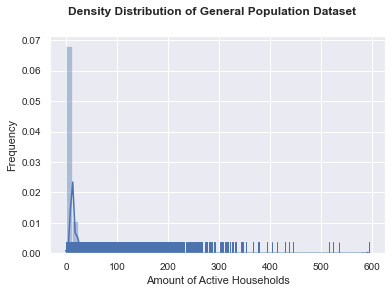

In [499]:
plot_histogram(azdias['ANZ_HAUSHALTE_AKTIV'], 'Amount of Active Households', 'General Population')

In [500]:
series_hh_greater50 = azdias.groupby('ANZ_HAUSHALTE_AKTIV')['ANZ_HAUSHALTE_AKTIV'].count()
series_hh_greater50.head(20)

ANZ_HAUSHALTE_AKTIV
0.0       6463
1.0     195957
2.0     120982
3.0      62575
4.0      43213
5.0      37815
6.0      36020
7.0      34526
8.0      32293
9.0      29002
10.0     25428
11.0     21965
12.0     18033
13.0     15282
14.0     12625
15.0     10371
16.0      8899
17.0      7292
18.0      6324
19.0      5461
Name: ANZ_HAUSHALTE_AKTIV, dtype: int64

In [501]:
series_hh_greater50.tail(20)

ANZ_HAUSHALTE_AKTIV
344.0     9
346.0     7
347.0    11
348.0    11
353.0     7
366.0     1
367.0     9
377.0     5
378.0     3
379.0     6
395.0     3
404.0     2
414.0     3
430.0     6
438.0     9
445.0     7
515.0     4
523.0     4
536.0     1
595.0     8
Name: ANZ_HAUSHALTE_AKTIV, dtype: int64

Note: non active households in a building are possible, if the building is empty. It seems unrealistic having active households of such high numbers as seen with tail(), but we don't know how this attribute is build. Is there an error or not, is this a grouping of several huge building blocks? Nevertheless, the distribution is clearly skewed.

So, let's have a look to the 'ANZ_STATISTISCHE_HAUSHALTE' feature.

In general, the ordinal grouping of both attributes cannot be compared in detail, because we don't know the values behind this classes are created in details. What are the requirements of being 'active'? The whole design is unknown. It is not the same as counting numerical values for money attributes, for everyone it is clear knowledge, that 50€ is 5 times more compared to 10€.

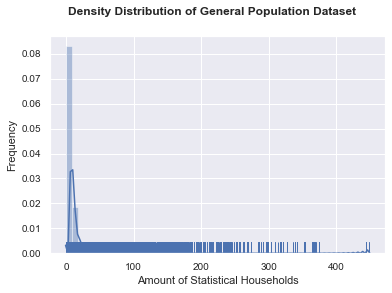

In [502]:
plot_histogram(azdias['ANZ_STATISTISCHE_HAUSHALTE'], 'Amount of Statistical Households', 'General Population')

In [503]:
series_stathh_greater50 = azdias.groupby('ANZ_STATISTISCHE_HAUSHALTE')['ANZ_STATISTISCHE_HAUSHALTE'].count()
series_stathh_greater50.tail(20)

ANZ_STATISTISCHE_HAUSHALTE
304.0     6
309.0     4
314.0     1
317.0    17
319.0     7
322.0     9
328.0     5
336.0     2
339.0    13
342.0    11
353.0     8
354.0     9
365.0     9
366.0     7
367.0     9
369.0     9
371.0     3
375.0     6
445.0     7
449.0     3
Name: ANZ_STATISTISCHE_HAUSHALTE, dtype: int64

**Note:**<br>
Compared with the other main part of the other features both attributes include huge amount of different variables and the value range is not between 0 and 10 as mentioned in the Excel attribute information file it is mapped to a higher number dimension. So, the idea pops up to change the categorical bins and create a different, modified mapping.

First, we have a look to the distribution of this features. A scatter matrix is not possible for all features, because of memory errors, but for this ones we can do it.

In [504]:
df_hh_data = azdias.loc[:, ['ANZ_HAUSHALTE_AKTIV', 'ANZ_STATISTISCHE_HAUSHALTE']]

Wall time: 1min 55s
General Population: Correlation Diagram


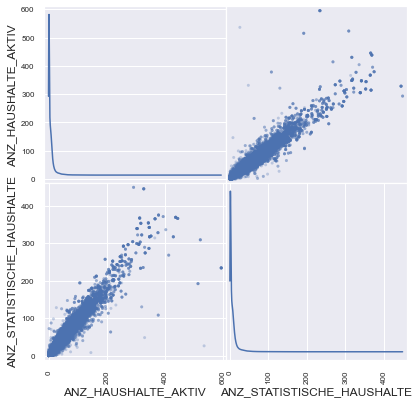

In [505]:
warnings.filterwarnings("ignore", category = UserWarning)
%time pd.plotting.scatter_matrix(df_hh_data, alpha = 0.3, figsize = (6.5,6.5), diagonal = 'kde')
# don't use ';', it will show the AxesSubplot array message, instead use plt.show()
print("\033[1mGeneral Population: Correlation Diagram\033[0m")
plt.show()

Regarding matplotlib warnings which appeared by usage of Pandas version <1.0.2: a stackoverflow [record](https://stackoverflow.com/questions/60686646/matplotlibdeprecationwarning-the-rownum-and-colnum-attribute-was-deprecated-in) tells that this is already fixed with Pandas 1.0.2. They are set to be ignored.

The diagonal category curves in the scatter matrix from top left to bottom right show that there are no normal distributions of the features. The scatter plots show a correlation between the features. There, single points are available which are outliers. This can be visualised by boxplot diagrams.

In [506]:
df_hh_data.groupby('ANZ_HAUSHALTE_AKTIV')['ANZ_HAUSHALTE_AKTIV'].count()

ANZ_HAUSHALTE_AKTIV
0.0        6463
1.0      195957
2.0      120982
3.0       62575
4.0       43213
          ...  
445.0         7
515.0         4
523.0         4
536.0         1
595.0         8
Name: ANZ_HAUSHALTE_AKTIV, Length: 292, dtype: int64

In [507]:
sum(df_hh_data['ANZ_HAUSHALTE_AKTIV'].isna())

93148

**Note:**<br>
Detecting **outliers** in the data is important in the data preprocessing step of any analysis. The presence of outliers can often skew results which take into consideration for these data points. There are many "rules of thumb" for what constitutes an outlier in a dataset. Here, we will use **Tukey's Method** for identifying outliers: An outlier step is calculated as 1.5 times the interquartile range (IQR). A data point with a feature that is beyond an outlier step outside of the IQR for that feature is considered abnormal.

Regarding the values above, it is expected to find a lot of outliers.

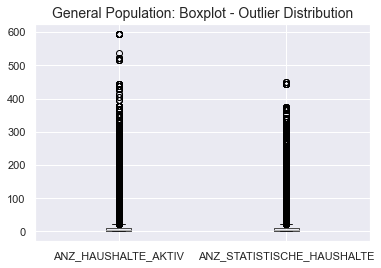

In [508]:
df_hh_data.boxplot()
plt.title("General Population: Boxplot - Outlier Distribution", fontsize= 14);

What will happen after scaling of this attributes? We try a simple log transformation.

Wall time: 1min 29s


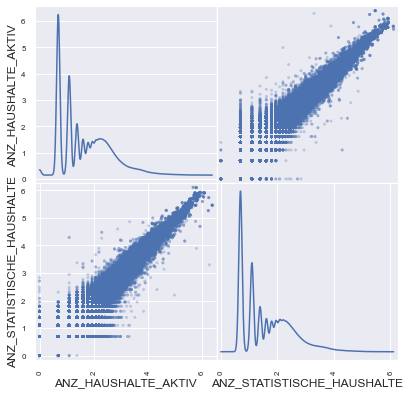

In [509]:
# second simple log transformation
log_df_hh_data = pd.DataFrame()
# add +1 to avoid division by zero
log_df_hh_data['ANZ_HAUSHALTE_AKTIV'] = np.log(df_hh_data['ANZ_HAUSHALTE_AKTIV'] + 1)
log_df_hh_data['ANZ_STATISTISCHE_HAUSHALTE'] = np.log(df_hh_data['ANZ_STATISTISCHE_HAUSHALTE'] + 1)
%time pd.plotting.scatter_matrix(log_df_hh_data, alpha = 0.3, figsize = (6.5,6.5), diagonal = 'kde')#;
plt.show()

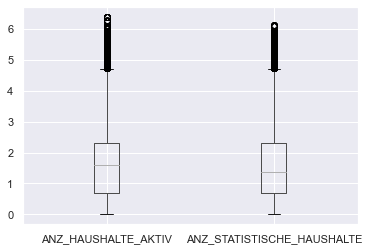

In [510]:
log_df_hh_data.boxplot();

It is already a much better usable distribution wit much less outliers. As we can see, the median is around category 1.5 for both attributes and the grouping IQR is from 0.5 to round about 2.3 by now.

As a result, we change the original datasets with this additionally modified log transformation values. We have to do the same transformation for the customers dataset as well to be comparable.

In [511]:
df_hh_data_cstm = customers.loc[:, ['ANZ_HAUSHALTE_AKTIV', 'ANZ_STATISTISCHE_HAUSHALTE']]

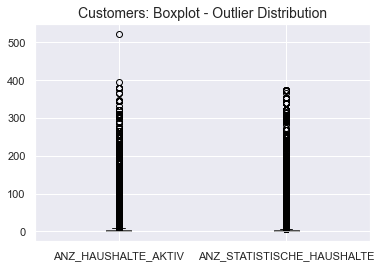

In [512]:
# outliers
df_hh_data_cstm.boxplot()
plt.title("Customers: Boxplot - Outlier Distribution", fontsize = 14);

Customers: Correlation Diagram


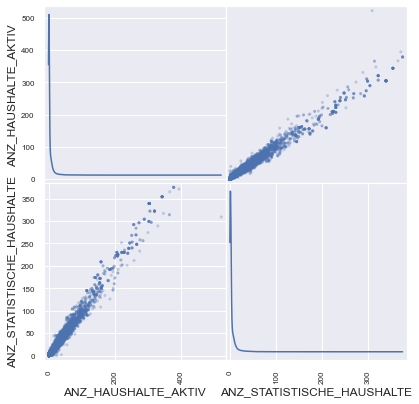

In [513]:
pd.plotting.scatter_matrix(df_hh_data_cstm, alpha = 0.3, figsize = (6.5,6.5), diagonal = 'kde')
print("\033[1mCustomers: Correlation Diagram\033[0m")
plt.show()

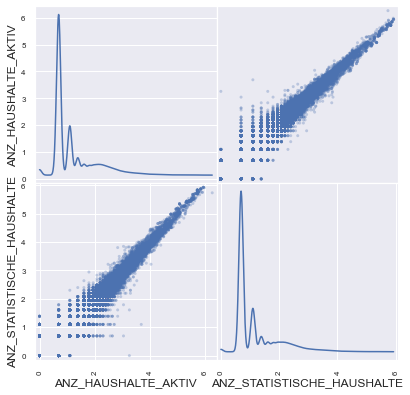

In [514]:
# second simple log transformation
log_df_hh_data_cstm = pd.DataFrame()
# add +1 to avoid division by zero
log_df_hh_data_cstm['ANZ_HAUSHALTE_AKTIV'] = np.log(df_hh_data_cstm['ANZ_HAUSHALTE_AKTIV'] + 1)
log_df_hh_data_cstm['ANZ_STATISTISCHE_HAUSHALTE'] = np.log(df_hh_data_cstm['ANZ_STATISTISCHE_HAUSHALTE'] + 1)
pd.plotting.scatter_matrix(log_df_hh_data_cstm, alpha = 0.3, figsize = (6.5,6.5), diagonal = 'kde')
plt.show()

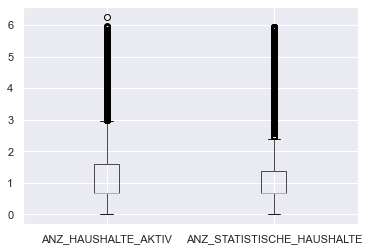

In [515]:
log_df_hh_data_cstm.boxplot();

Regarding the customers dataset, there are much less outliers, but still too much.

Datasets changes ...

In [516]:
azdias['ANZ_STATISTISCHE_HAUSHALTE'] = log_df_hh_data['ANZ_STATISTISCHE_HAUSHALTE']
customers['ANZ_STATISTISCHE_HAUSHALTE'] = log_df_hh_data_cstm['ANZ_STATISTISCHE_HAUSHALTE']

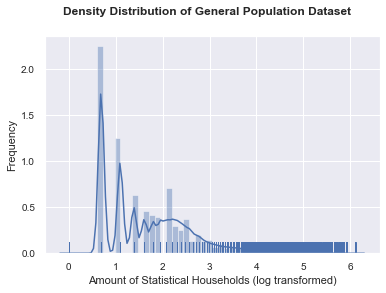

In [517]:
plot_histogram(azdias['ANZ_STATISTISCHE_HAUSHALTE'], 'Amount of Statistical Households (log transformed)', 'General Population')

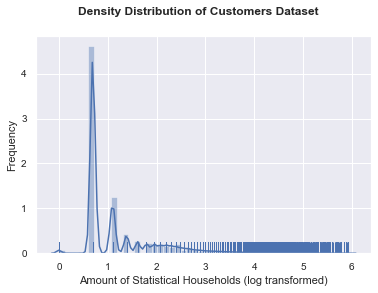

In [518]:
plot_histogram(customers['ANZ_STATISTISCHE_HAUSHALTE'], 'Amount of Statistical Households (log transformed)', 'Customers')

By now, we used the log transformation for the chosen features. In this specific case: Both features are clearly correlated as visible in the scatter matrices of the datasets. We remove the feature 'ANZ_HAUSHALTE_AKTIV'. Furthermore, if available we let the remaining outliers values be part of the datasets.

In general, for the machine learning models we prefer to work on normal distributions without a lot of outliers. Outliers could dominate the feature value range and therefore distort the feature distribution of the dataset and the fit function of a machine learning model (e.g. AdaBoost). Furthermore, for additional hypothesis testing the p-value calculation could be misleading.

Having the fit function of the training set in mind, to decide if the outliers having an effect, the model fit function could be done with and without an outlier list. If the result is equal, they have no effect and can stay there as part of the dataset after having proven that they are no false values (like a decimal point fault that e.g. can be detected by discussion with subject matter experts). If the fit function result is different, you can remove the values from your dataset.

Especially if the outliers have an influence on several features that are used for the dimensionality feature reduction transformation, they should be removed. There, e.g. for PCA/SparsePCA they would change the 'explained variance ratio' result calculated for each dimension. Therefore we do a general scaling for relevant features before doing dimensionality reduction.

#### 3.1.1 Feature 'GEBURTSJAHR'

In [519]:
series_az_year_birth = azdias.groupby('GEBURTSJAHR')['GEBURTSJAHR'].count()
series_az_year_birth.tail(20)

GEBURTSJAHR
1998    830
1999    744
2000    753
2001    748
2002    782
2003    707
2004    679
2005    592
2006    570
2007    567
2008    550
2009    559
2010    545
2011    485
2012    806
2013    380
2014    124
2015    257
2016    167
2017    593
Name: GEBURTSJAHR, dtype: int64

In [520]:
series_az_year_birth.head(20)

GEBURTSJAHR
0       392318
1900         4
1902         1
1904         5
1905         8
1906         7
1907         4
1908         7
1909         7
1910        41
1911        30
1912        28
1913        39
1914        55
1915        37
1916        45
1917        55
1918        85
1919       194
1920       238
Name: GEBURTSJAHR, dtype: int64

In [521]:
# to find the people which are younger than 18 (have in mind the dataset is from 2018) or 'unknown' birthday
df_az_birth_group1 = azdias.query('GEBURTSJAHR > 2000 or GEBURTSJAHR == 0')
df_az_birth_group1.head(20)

,LNR,AGER_TYP,AKT_DAT_KL,ALTER_HH,ALTER_KIND1,ALTER_KIND2,ALTER_KIND3,ALTER_KIND4,ALTERSKATEGORIE_FEIN,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,ARBEIT,BALLRAUM,CAMEO_DEU_2015,CAMEO_DEUG_2015,CAMEO_INTL_2015,CJT_GESAMTTYP,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_ANZ_12,D19_BANKEN_ANZ_24,D19_BANKEN_DATUM,D19_BANKEN_DIREKT,D19_BANKEN_GROSS,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_ONLINE_QUOTE_12,D19_BANKEN_REST,D19_BEKLEIDUNG_GEH,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_FREIZEIT,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ANZ_24,D19_GESAMT_DATUM,D19_GESAMT_OFFLINE_DATUM,D19_GESAMT_ONLINE_DATUM,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_HAUS_DEKO,D19_KINDERARTIKEL,D19_KONSUMTYP,D19_KONSUMTYP_MAX,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LETZTER_KAUF_BRANCHE,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_RATGEBER,D19_REISEN,D19_SAMMELARTIKEL,D19_SCHUHE,D19_SONSTIGE,D19_SOZIALES,D19_TECHNIK,D19_TELKO_ANZ_12,D19_TELKO_ANZ_24,D19_TELKO_DATUM,D19_TELKO_MOBILE,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_ONLINE_QUOTE_12,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_ANZ_24,D19_VERSAND_DATUM,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSAND_REST,D19_VERSI_ANZ_12,D19_VERSI_ANZ_24,D19_VERSI_DATUM,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSI_ONLINE_QUOTE_12,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE,HEALTH_TYP,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_BAUMAX,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANTG1,KBA13_ANTG2,KBA13_ANTG3,KBA13_ANTG4,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BAUMAX,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_GBZ,KBA13_HALTER_20,KBA13_HALTER_25,KBA13_HALTER_30,KBA13_HALTER_35,KBA13_HALTER_40,KBA13_HALTER_45,KBA13_HALTER_50,KBA13_HALTER_55,KBA13_HALTER_60,KBA13_HALTER_65,KBA13_HALTER_66,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_HHZ,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,

In [522]:
df_az_birth_group1.iloc[:20, 95:115]

,D19_WEIN_FEINKOST,DSL_FLAG,EINGEFUEGT_AM,EINGEZOGENAM_HH_JAHR,EWDICHTE,EXTSEL992,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FINANZTYP,FIRMENDICHTE,GEBAEUDETYP,GEBAEUDETYP_RASTER,GEBURTSJAHR,GEMEINDETYP,GFK_URLAUBERTYP,GREEN_AVANTGARDE
0,0,NaN,NaN,NaN,NaN,NaN,5,3,3,4,5,3,4,NaN,NaN,NaN,0,NaN,10.0,0
6,0,1.0,1992.0,2005.0,4.0,NaN,5,3,1,5,4,1,4,5.0,1.0,5.0,0,12.0,12.0,0
11,0,NaN,NaN,NaN,NaN,NaN,5,3,3,4,5,3,4,NaN,NaN,NaN,0,NaN,5.0,0
12,0,1.0,2005.0,2014.0,5.0,31.0,2,1,5,3,4,4,3,4.0,1.0,4.0,0,21.0,10.0,0
14,0,NaN,NaN,NaN,NaN,NaN,5,3,3,4,5,3,4,NaN,NaN,NaN,0,NaN,5.0,0
17,0,NaN,NaN,NaN,NaN,NaN,5,3,3,4,5,3,4,NaN,NaN,NaN,0,NaN,5.0,0
18,0,1.0,1996.0,2013.0,3.0,NaN,5,1,2,4,4,1,1,4.0,1.0,4.0,0,30.0,11.0,0
19,0,1.0,1992.0,2013.0,6.0,NaN,1,1,5,2,3,3,5,2.0,8.0,3.0,0,21.0,8.0,1
20,6,1.0,2002.0,2014.0,2.0,NaN,4,1,4,3,5,1,3,2.0,3.0,1.0,0,30.0,11.0,1
21,0,1.0,1992.0,2005.0,6.0,NaN,2,1,3,4,5,1,3,3.0,1.0,3.0,0,12.0,11.0,0


As we can see, there are a lot of rows with a lot of NaN values. Have this in mind after having deleted rows with missing values higher than a specific threshold. 

By now, we can identify how many people in % have the age information 'GEBURTSJAHR > 2000 or GEBURTSJAHR == 0'. An online or email-order customer must be at least 18 years old. And a birth year of 0 does not exist, so, it is expected that there the year of birth is unknown.

In [523]:
print("{:.4}% of all observed 'general population - azdias' people are younger than 18 or the year of birth is unknown(=0)".
      format(df_az_birth_group1.shape[0] * 100 / azdias.shape[0]))

45.04% of all observed 'general population - azdias' people are younger than 18 or the year of birth is unknown(=0)


In [524]:
df_az_birth_group2 = azdias.query('GEBURTSJAHR == 0')

In [525]:
print("{:.4}% of all observed 'general population - azdias' people have an unknown year of birth (=0)".
      format(df_az_birth_group2.shape[0] * 100 / azdias.shape[0]))

44.02% of all observed 'general population - azdias' people have an unknown year of birth (=0)


As a result, the feature content of year=0 is >35%, therefore it is similar to the empty value approach and this feature shall be added to the columns drop list. 

#### 3.1.2 Feature 'VERDICHTUNGSRAUM'
Here we get an overview about its distribution, but don't change the cardinality.

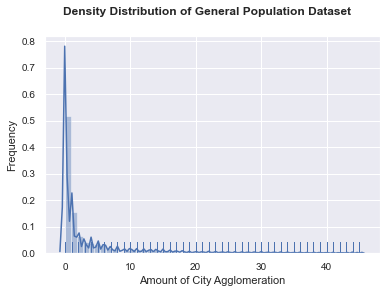

In [526]:
plot_histogram(azdias['VERDICHTUNGSRAUM'], 'Amount of City Agglomeration', 'General Population')

In [527]:
# city agglomeration
series_az_cityagglo = azdias.groupby('VERDICHTUNGSRAUM')['VERDICHTUNGSRAUM'].count()
series_az_cityagglo 

VERDICHTUNGSRAUM
0.0     368782
1.0     111235
2.0      47613
3.0      29827
4.0      26996
5.0      24019
6.0      21882
7.0      13238
8.0      11864
9.0       9425
10.0     11034
11.0      8226
12.0      8046
13.0      8707
14.0      8180
15.0      6942
16.0      6435
17.0      5502
18.0      5061
19.0      3300
20.0      3538
21.0      3364
22.0      3492
23.0      3239
24.0      2980
25.0      2887
26.0      2569
27.0      2622
28.0      2454
29.0      2552
30.0      2648
31.0      2313
32.0      2390
33.0      2240
34.0      2054
35.0      1769
36.0      1959
37.0      1348
38.0      1622
39.0      1660
40.0      1359
41.0      1329
42.0      1324
43.0      1321
44.0      1435
45.0      1165
Name: VERDICHTUNGSRAUM, dtype: int64

It is not normal distributed. So, this a candidate for the StandardScaler part of the clusterer pipeline.

In [528]:
azdias['VERDICHTUNGSRAUM'].nunique()

46

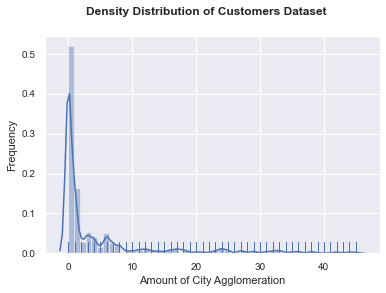

In [529]:
plot_histogram(customers['VERDICHTUNGSRAUM'], 'Amount of City Agglomeration', 'Customers')

In [530]:
customers['VERDICHTUNGSRAUM'].nunique()

46

#### 3.1.3 Feature 'ANZ_PERSONEN'

In [531]:
series_az_persons = azdias.groupby('ANZ_PERSONEN')['ANZ_PERSONEN'].count()
series_az_persons

ANZ_PERSONEN
0.0      34103
1.0     423383
2.0     195470
3.0      94905
4.0      47126
5.0      15503
6.0       4842
7.0       1525
8.0        523
9.0        180
10.0        67
11.0        38
12.0        16
13.0        11
14.0         4
15.0         3
16.0         1
17.0         1
18.0         1
20.0         3
21.0         4
22.0         2
23.0         2
29.0         1
31.0         1
35.0         1
37.0         2
38.0         2
40.0         1
45.0         1
Name: ANZ_PERSONEN, dtype: int64

It seems to be unrealistic for a household in Germany having more than 10 adults. It could be that there are flat shares counted as a single observation, e.g. something like a house including students flat shares. Nevertheless, these values are outliers and we will modify the outlier values higher a specific limit. And to set this limit: How is the distribution of this feature in the customers dataset?

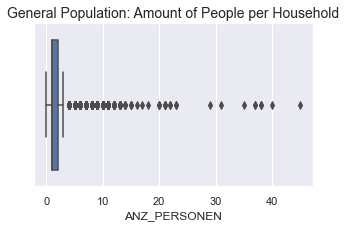

In [532]:
fig, ax = plt.subplots(figsize=(5,3))
sns.boxplot(azdias['ANZ_PERSONEN'])
plt.title('General Population: Amount of People per Household', fontsize=14);

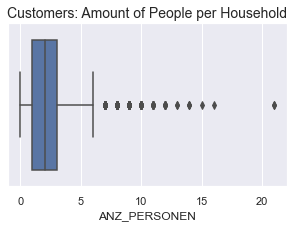

In [533]:
fig, ax = plt.subplots(figsize=(5,3))
sns.boxplot(customers['ANZ_PERSONEN'])
plt.title('Customers: Amount of People per Household', fontsize=14);

The customers dataset has outliers as well, but not so much and not with such high values compared to the azdias dataset. The features are scaled with StandardScaler.

#### 3.1.5 Add additional Features to Drop List and Features with Cardinality >10
Finally, we add the additionally found feature attributes to our columns drop list.

In [534]:
# drop list
clm_drop_list.append('ANZ_HAUSHALTE_AKTIV')
clm_drop_list.append('GEBURTSJAHR')

After modifications, we search for: all features existing now with cardinality >15 and not in drop list. This is needed for feature engineering of imputation, scaling and ohe; they shall be treated as pseudo-continuous numbers and not one-hot-encoded, instead being scaled.

In [536]:
az_clm_cardhigher10_dict = {k: v for (k,v) in dict_az_catclm_sort.items() if (v>15 and k not in clm_drop_list)}
az_clm_cardhigher10_dict

{'ANZ_STATISTISCHE_HAUSHALTE': 268,
 'VERDICHTUNGSRAUM': 46,
 'EINGEZOGENAM_HH_JAHR': 37,
 'MIN_GEBAEUDEJAHR': 32,
 'ANZ_PERSONEN': 30,
 'ANZ_HH_TITEL': 21}

In [537]:
az_clm_highcard = list(az_clm_cardhigher10_dict.keys())
az_clm_highcard

['ANZ_STATISTISCHE_HAUSHALTE',
 'VERDICHTUNGSRAUM',
 'EINGEZOGENAM_HH_JAHR',
 'MIN_GEBAEUDEJAHR',
 'ANZ_PERSONEN',
 'ANZ_HH_TITEL']

Are there other features including the 'ANZ' string (means: abbreviation for number, amount)? Means, they are handled as float64 datatypes and shall not be one-hot-encoded.

In [544]:
m = np.core.defchararray.find(customers.columns.values.astype(str), 'ANZ_') >= 0
df_anz = customers.loc[:, m]
# drop the one from drop list
df_anz = df_anz.drop(columns=['ANZ_HAUSHALTE_AKTIV',
                              'D19_VERSI_ANZ_24', 'D19_VERSI_ANZ_12',
                              'D19_TELKO_ANZ_24', 'D19_TELKO_ANZ_12',
                              'D19_VERSAND_ANZ_12', 'D19_VERSAND_ANZ_24',
                              'D19_BANKEN_ANZ_12', 'D19_BANKEN_ANZ_24',
                              'D19_GESAMT_ANZ_12', 'D19_GESAMT_ANZ_24'])

df_anz.head()

,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_STATISTISCHE_HAUSHALTE,ANZ_TITEL,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER
0,0.0,0.0,2.0,0.693147,0.0,1,2,5,1,2,5
1,NaN,0.0,3.0,NaN,0.0,1,2,5,1,3,5
2,0.0,0.0,1.0,0.693147,0.0,1,4,5,1,4,5
3,NaN,0.0,0.0,0.693147,0.0,2,2,5,1,1,5
4,0.0,0.0,4.0,2.079442,0.0,4,2,3,1,5,4


In [545]:
df_anz.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 191652 entries, 0 to 191651
Data columns (total 11 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   ANZ_HH_TITEL                139542 non-null  float64
 1   ANZ_KINDER                  145056 non-null  float64
 2   ANZ_PERSONEN                145056 non-null  float64
 3   ANZ_STATISTISCHE_HAUSHALTE  141725 non-null  float64
 4   ANZ_TITEL                   145056 non-null  float64
 5   FINANZ_ANLEGER              191652 non-null  int64  
 6   FINANZ_HAUSBAUER            191652 non-null  int64  
 7   FINANZ_MINIMALIST           191652 non-null  int64  
 8   FINANZ_SPARER               191652 non-null  int64  
 9   FINANZ_UNAUFFAELLIGER       191652 non-null  int64  
 10  FINANZ_VORSORGER            191652 non-null  int64  
dtypes: float64(5), int64(6)
memory usage: 16.1 MB


Append all 'ANZ' float features to the high cardinality list. This is necessary for ohe and imputation activities.

In [548]:
for item in df_anz.select_dtypes(include=['float64']):
    if item not in az_clm_highcard:
        az_clm_highcard.append(item)

In [549]:
az_clm_highcard

['ANZ_STATISTISCHE_HAUSHALTE',
 'VERDICHTUNGSRAUM',
 'EINGEZOGENAM_HH_JAHR',
 'MIN_GEBAEUDEJAHR',
 'ANZ_PERSONEN',
 'ANZ_HH_TITEL',
 'ANZ_KINDER',
 'ANZ_TITEL']

Are all float features?

In [550]:
assert azdias[az_clm_highcard].dtypes.all() == 'float64', "Ops, not all high card and ANZ features are floats."
print("Quick test of azdias high cardinality and ANZ features being of float datatype is passed.")

Quick test of azdias high cardinality and ANZ features being of float datatype is passed.


But have in mind that there are date features included which have to be treated differently.

### 3.2 Remove Drop List Features and Rows of specific Properties
As we have investigated features of both dataframes that deliver no added value for analysis tasks, we drop them.

In [551]:
print("After modifications, we have {} features added to our columns drop list.".format(len(clm_drop_list)))
clm_drop_list

After modifications, we have 184 features added to our columns drop list.


['LNR',
 'ALTER_KIND1',
 'ALTER_KIND2',
 'ALTER_KIND3',
 'ALTER_KIND4',
 'D19_LETZTER_KAUF_BRANCHE',
 'EXTSEL992',
 'KK_KUNDENTYP',
 'D19_VERSI_OFFLINE_DATUM',
 'D19_TELKO_ANZ_24',
 'D19_VERSAND_ANZ_24',
 'D19_VERSI_ONLINE_DATUM',
 'D19_BANKEN_ONLINE_DATUM',
 'KBA05_BAUMAX',
 'D19_VERSI_ANZ_24',
 'AGER_TYP',
 'D19_TELKO_ONLINE_DATUM',
 'D19_TELKO_ANZ_12',
 'D19_VERSAND_OFFLINE_DATUM',
 'D19_TELKO_OFFLINE_DATUM',
 'D19_GESAMT_ONLINE_DATUM',
 'D19_VERSI_DATUM',
 'D19_VERSAND_DATUM',
 'D19_BANKEN_OFFLINE_DATUM',
 'D19_VERSAND_ONLINE_DATUM',
 'D19_GESAMT_ANZ_12',
 'D19_GESAMT_DATUM',
 'D19_BANKEN_ANZ_12',
 'D19_TELKO_DATUM',
 'D19_BANKEN_ANZ_24',
 'D19_VERSI_ANZ_12',
 'D19_GESAMT_OFFLINE_DATUM',
 'TITEL_KZ',
 'D19_GESAMT_ANZ_24',
 'D19_VERSAND_ANZ_12',
 'D19_BANKEN_DATUM',
 'CAMEO_DEU_2015',
 'CAMEO_INTL_2015',
 'ALTERSKATEGORIE_FEIN',
 'EINGEFUEGT_AM',
 'D19_VERSAND_ONLINE_QUOTE_12',
 'LP_FAMILIE_FEIN',
 'LP_LEBENSPHASE_FEIN',
 'LP_STATUS_FEIN',
 'KBA13_ALTERHALTER_30',
 'KBA13_ALTERHALTE

In [552]:
# take care of the modification status existing by now
azdias_mod1 = azdias.copy()
customers_mod1 = customers.copy()

# reduce the datasets
azdias.drop(columns=clm_drop_list, inplace=True)
customers.drop(columns=clm_drop_list, inplace=True)

Remove people **rows of Age-Categories 1-6**. We have already identified:
- az_age_1_6_indices = azdias.query("(ALTER_HH > 0) and (ALTER_HH < 7)")
- cstm_1_6_indices = customers.query("(ALTER_HH > 0) and (ALTER_HH < 7)")

In [556]:
azdias.drop(index=list(az_age_1_6_indices.index), inplace=True)
customers.drop(index=list(cstm_1_6_indices.index) , inplace=True)

Delete **rows with empty values >= specific threshold**:<br>
If we still find rows having an amount of empty values (NaN) higher than a given threshold, we remove such rows from the datasets. Let us try to remove rows having more than 60% NaNs and impute the remaining missing values of the datasets afterwards.

In [558]:
# what is the number of 60% of the remaining feature number?
no_60perc = customers.shape[1] * 0.6
print("60% of the whole column number is: {:.5}".format(no_60perc))

60% of the whole column number is: 109.2


In [559]:
azdias = drop_rows(azdias, no_60perc)
customers = drop_rows(customers, no_60perc)

The new shape of the dataframes is now ...

In [560]:
print("The 'azdias' dataset has {} samples with {} features each.".format(*azdias.shape))
print("The 'customers' dataset has {} samples with {} features each.".format(*customers.shape))

The 'azdias' dataset has 792376 samples with 182 features each.
The 'customers' dataset has 139601 samples with 182 features each.


And the datatypes existing by now are:

In [561]:
azdias.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 792376 entries, 0 to 792375
Columns: 182 entries, AKT_DAT_KL to ALTERSKATEGORIE_GROB
dtypes: float64(123), int64(59)
memory usage: 1.1 GB


In [562]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 139601 entries, 0 to 139600
Columns: 182 entries, AKT_DAT_KL to ALTERSKATEGORIE_GROB
dtypes: float64(123), int64(59)
memory usage: 193.8 MB


### 3.3 Visualisation of the Remaining Missing Values and Feature Correlation Information
The coding from: https://github.com/ResidentMario/missingno is used and a little bit modified. The heatmaps of both datasets are stored as a png file in the project images directory. Additional multi-correlation information is given by the dendrograms of the datasets.<br>
Citation: Bilogur, (2018). Missingno: a missing data visualization suite.<br>
Journal of Open Source Software, 3(22), 547, https://doi.org/10.21105/joss.00547

As the author wrote, the library "missingno provides a small toolset of flexible and easy-to-use missing data visualizations and utilities that allows you to get a quick visual summary of the completeness (or lack thereof) of your dataset.".

#### 3.3.0 Dendrogram Azdias

Wall time: 17.6 s
General Population: Feature Dendrogram


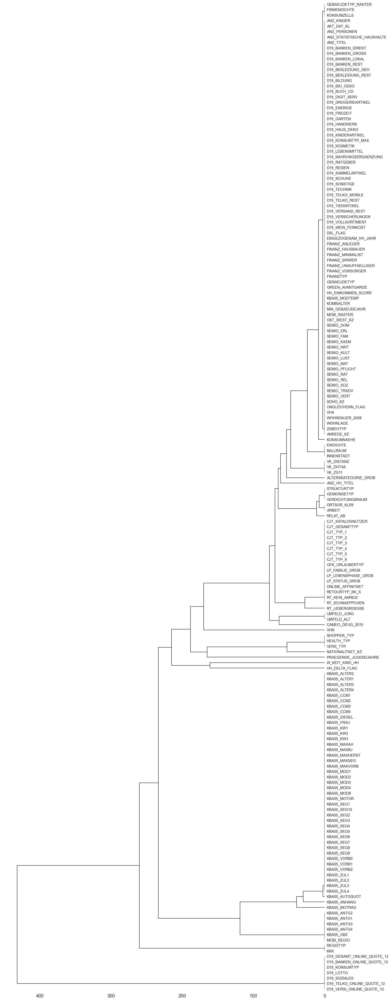

In [563]:
%time msno.dendrogram(azdias)
print("\033[1mGeneral Population: Feature Dendrogram\033[0m")
plt.show()

**Explanation:**<br>
"The dendrogram allows you to more fully correlate variable completion, revealing trends deeper than the pairwise ones visible in the correlation heatmap.

The dendrogram uses a hierarchical clustering algorithm (courtesy of scipy) to bin variables against one another by their nullity correlation (measured in terms of binary distance). At each step of the tree the variables are split up based on which combination minimizes the distance of the remaining clusters. The more monotone the set of variables, the closer their total distance is to zero, and the closer their average distance [...] is to zero.

To interpret this graph, read it from a right-left perspective. Cluster leaves which linked together at a distance of zero fully predict one another's presence—one variable might always be empty when another is filled, or they might always both be filled or both empty, and so on. [...]

Cluster leaves which split close to zero, but not at it, predict one another very well, but still imperfectly. If your own interpretation of the dataset is that these columns actually are or ought to be match each other in nullity, then the height of the cluster leaf tells you, in absolute terms, how often the records are "mismatched" or incorrectly filed—that is, how many values you would have to fill in or drop, if you are so inclined."

#### 3.3.1 Heatmap Azdias

File stored ...
Wall time: 40 s
General Population: Feature Heatmap


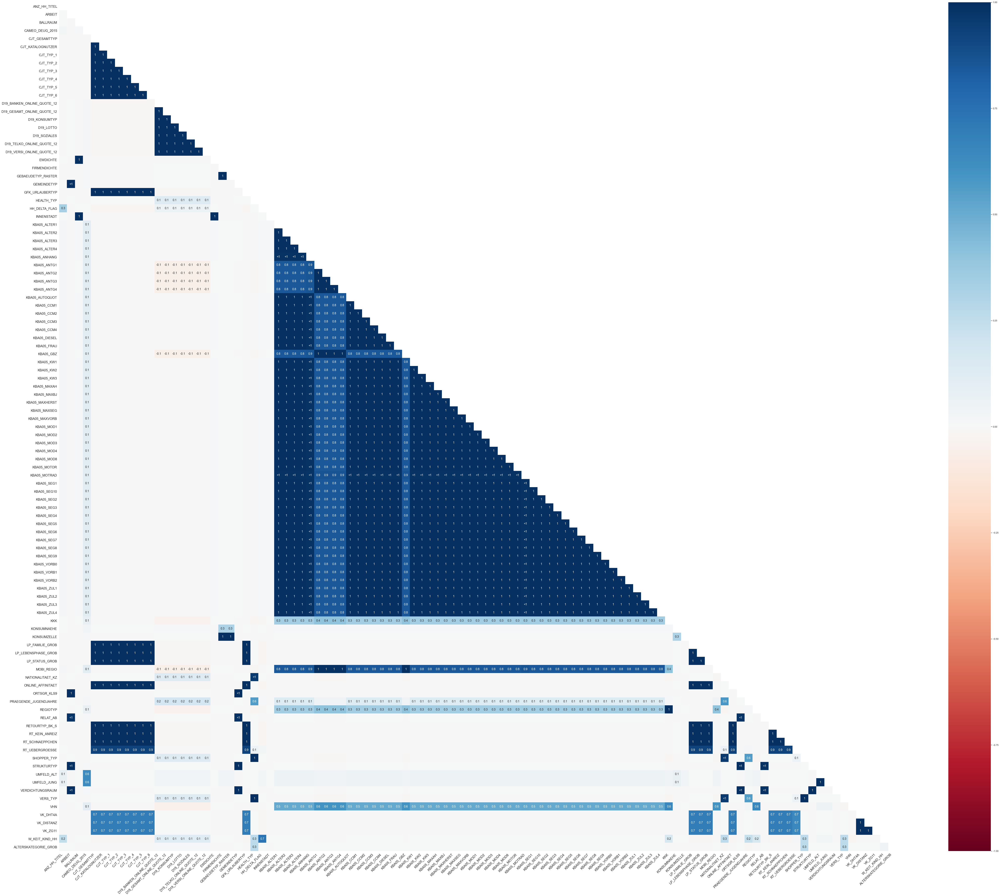

In [564]:
%time heatmap(azdias, 'azdias')
print("\033[1mGeneral Population: Feature Heatmap\033[0m")
plt.show()

**Explanation:**<br>
"Nullity correlation ranges from -1 (if one variable appears the other definitely does not) to 0 (variables appearing or not appearing have no effect on one another) to 1 (if one variable appears the other definitely also does).

Variables that are always full or always empty have no meaningful correlation, and so are silently removed from the visualization

Entries marked <1 or >-1 are have a correlation that is close to being exactingly negative or positive, but is still not quite perfectly so.".

As we can see in our heatmap, there are large dark-blue blocks from variables which belong together. And no dark-red blocks are available.

ToDo: it seems to be an improvement to create new additional binary features for the 'dark blue' grouped features, e.g. the KBA05 ones with correlation values 1 can be connected with a new feature called 'KBA05_member' including a 1 value for 'yes' information, if the person has an active KBA05 features, 0 for 'no' otherwise. It is expected that the clustering and the prediction tasks are improved having such additional features.

#### 3.3.2 Dendrogram Customers

Wall time: 2.81 s
Customers: Feature Dendrogram


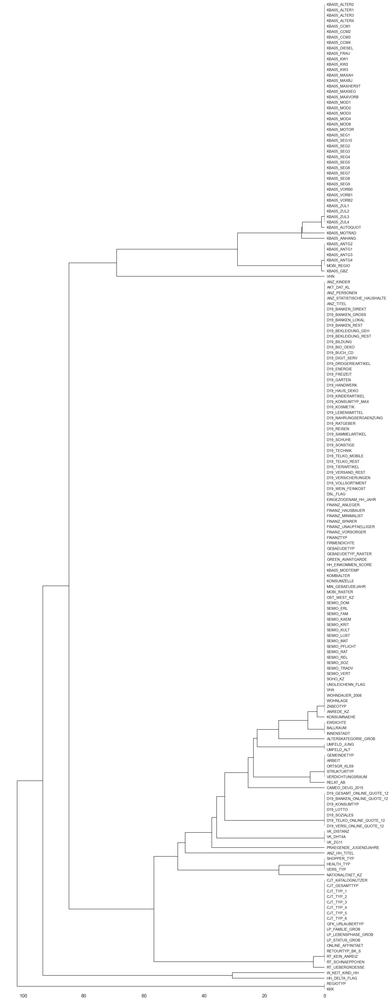

In [565]:
%time msno.dendrogram(customers)
print("\033[1mCustomers: Feature Dendrogram\033[0m")
plt.show()

#### 3.3.3 Heatmap Customers

File stored ...
Wall time: 13.6 s
Customers: Feature Heatmap


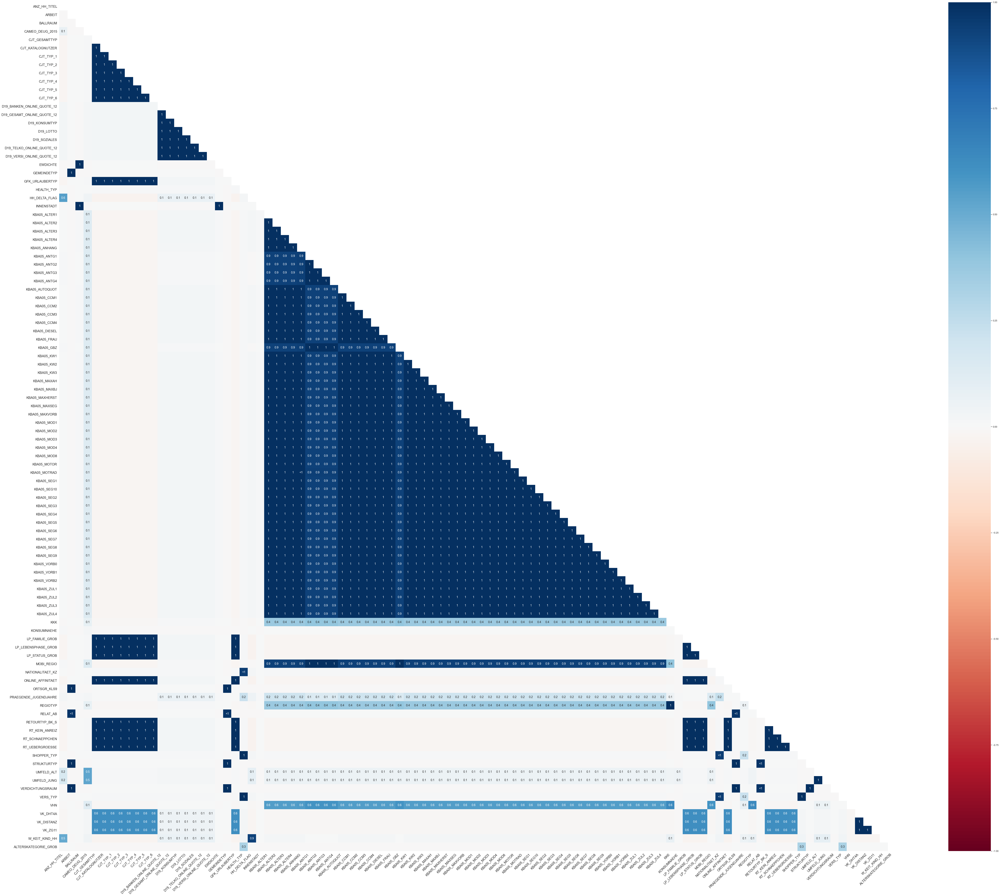

In [566]:
%time heatmap(df=customers, dfname='customers')
print("\033[1mCustomers: Feature Heatmap\033[0m")
plt.show()

After manual inspection, it looks as if the distribution is round about the same for both datasets. So, an additional feature would be valuable for the specific
- KBA05
features.

After inspection of the DIAS information level file, it is realised that KBA05 features deliver 'microcell_RR3' information, so, we would call the new feature **'KBA05_microcellRR3_member'**. Additionally, it is realised that there are more features added to such groups. Thus it is a better approach to use such Excel file and creating new binary member features according this grouping as a whole. We modified the Excel associated Python file already at the beginning of this project file by adding the group information to each feature. As we have already investigated, their grouping distribution is as given in the following list. But doing this new feature selection as an 'ohe' approach for each associated specific group feature would be an impressive amount of the overall dataset features at the end. So, we start to do this for the dataframe rows of the datasets. We have to proof, if the new feature is really relevant, there must be rows including only zeros being not affected by the KBA05 information.

In [567]:
df_dias_infolevel.groupby(['Information level'])['Attribute'].count()

Information level
125m x 125m Grid       33
Building               10
Community               6
Household              32
Microcell (RR3_ID)     63
Microcell (RR4_ID)      4
PLZ8                  114
Person                 42
Postcode                4
RR1_ID                  5
Name: Attribute, dtype: int64

**Azdias dataset**

In [568]:
# KBA05_microcellRR3_member
# find all KBA05
m = np.core.defchararray.find(azdias.columns.values.astype(str), 'KBA05' ) >= 0
df_KBA05 = azdias.loc[:, m]
df_KBA05.head()

,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXHERST,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4
0,3.0,4.0,1.0,4.0,0.0,0.0,0.0,0.0,2.0,1.0,1.0,5.0,1.0,4.0,2.0,4.0,1.0,1.0,3.0,4.0,2.0,1.0,2.0,4.0,3.0,3.0,2.0,2.0,0.0,0.0,1.0,3.0,0.0,0.0,4.0,1.0,2.0,2.0,2.0,1.0,3.0,3.0,0.0,1.0,1.0,5.0,5.0,1.0,0.0,2.0
1,2.0,3.0,3.0,3.0,0.0,1.0,3.0,1.0,0.0,3.0,5.0,2.0,3.0,0.0,0.0,3.0,3.0,3.0,2.0,2.0,3.0,4.0,5.0,1.0,1.0,0.0,2.0,5.0,1.0,1.0,4.0,1.0,1.0,2.0,1.0,5.0,3.0,3.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,3.0,2.0,3.0,4.0,4.0
2,2.0,5.0,3.0,0.0,1.0,4.0,1.0,0.0,0.0,4.0,2.0,3.0,5.0,1.0,3.0,4.0,4.0,3.0,4.0,1.0,3.0,4.0,3.0,2.0,2.0,2.0,4.0,4.0,2.0,1.0,3.0,3.0,3.0,1.0,1.0,2.0,5.0,3.0,2.0,0.0,0.0,0.0,1.0,2.0,5.0,1.0,3.0,3.0,3.0,3.0
3,0.0,4.0,4.0,3.0,0.0,1.0,4.0,1.0,0.0,3.0,4.0,1.0,4.0,2.0,1.0,5.0,3.0,3.0,2.0,3.0,2.0,2.0,3.0,1.0,1.0,3.0,1.0,1.0,4.0,2.0,3.0,4.0,1.0,3.0,3.0,4.0,1.0,3.0,2.0,0.0,1.0,0.0,2.0,5.0,1.0,5.0,3.0,4.0,2.0,2.0
4,0.0,4.0,2.0,4.0,1.0,2.0,2.0,0.0,0.0,3.0,1.0,4.0,4.0,0.0,3.0,5.0,4.0,1.0,5.0,0.0,2.0,4.0,2.0,2.0,1.0,2.0,3.0,3.0,4.0,1.0,3.0,3.0,1.0,0.0,2.0,3.0,3.0,4.0,1.0,0.0,0.0,1.0,1.0,4.0,2.0,3.0,3.0,3.0,0.0,5.0


In [569]:
print("Are there KBA05 rows completely set to zero? Answer: {}".
      format(np.any(df_KBA05.sum(axis=1) == 0)))

Are there KBA05 rows completely set to zero? Answer: False


As a result there is no D19 row including only zeros, and an additional member feature is not recommended. So we don't realise this approach for both datasets.

### 3.4 Preparation of Feature Lists according DataType for Pipeline
Regarding the creation of the pipeline approach for imputation, transformation, dimensionality reduction and clustering, we need to differentiate the whole feature set according its datatypes. Different column transformer chains have to be implemented. 

The pipeline starts with imputation for all features.

#### 3.4.0 General Information about Imputation of the Remaining Missing Values
Having continuous and categorical data we could e.g. use the [KNNImputer](https://scikit-learn.org/stable/modules/generated/sklearn.impute.KNNImputer.html#sklearn.impute.KNNImputer) and the [SimpleImputer](https://scikit-learn.org/stable/modules/generated/sklearn.impute.SimpleImputer.html#sklearn.impute.SimpleImputer), not knowing which one will be the better one for prediction models.

In scikit-learn it is stated:<br>
"With KNNImputer, missing values can be imputed using the weighted or unweighted mean of the desired number of nearest neighbors."<br>
"The SimpleImputer class also supports categorical data represented as string values or pandas categoricals when using the 'most_frequent' or 'constant' strategy."

Disadvantages are:
- KNNImputer:
    - can be very time consuming
    - accuracy degradation may appear
- SimpleImputer:
    - during several cycles, we use <i>most-frequent and median</i> to replace missing values (NaN values) along each column. Can be used with strings or numeric data. But this approach can reduce the variance of the imputed variables. It shrinks the standard error important for hypothesis tests and its confidence interval.
    
By now, we start to use the **SimpleImputer**:
- First try: After usage of this simple, basic imputation with most-frequent parameter and simple scaling afterwards, the PCA with 90% variance to create the associated components and further customer segmentation, resulted in using all the data in 1 segment. Having the last heatmap diagrams in mind, this is not as expected and therefore a second project cycle is implemented with the default <i>IterativeImputer</i> from the scikit-learn library. Third try: median pipeline approach is implemented.

Second cycle with **Regression-Imputation**:
- Alvira Swalin's blog [post](https://towardsdatascience.com/how-to-handle-missing-data-8646b18db0d4) introduces regression imputation for categorical and continuous features. We try this as a third process, see if the final segmentation gets a better result. Second one is associated with the used imputer class from scikit-learn (see below).

Third cycle with **Multiple-Imputation**:
- In Alvira Swalin's blog, she proposed to use multiple imputation with the mice library as well. This multiple imputation solved the disadvantages of such single imputation: estimation of a single value includes a random error and so, as mentioned standard deviation and p-values are too small. Additionally, the specific value puts in bias to the dataset. Implementing a multiple-imputation puts in a finally averaged value from a set of calculated ones.

For both last two imputation concepts we need the scikit-learn <i>IterativeImputer</i>, even it is still on experimental status as explained in the [doc](https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html#sklearn.impute.IterativeImputer). 

As our first estimator we use the default parameters of the imputer which are:
- **class sklearn.impute.IterativeImputer**(estimator=None, missing_values=nan, sample_posterior=False, max_iter=10, tol=0.001, n_nearest_features=None, initial_strategy='mean', imputation_order='ascending', skip_complete=False, min_value=None, max_value=None, verbose=0, random_state=None, add_indicator=False)<br>
It is stated, that this is a "strategy for imputing missing values by modeling each feature with missing values as a function of other features in a round-robin fashion." The default estimator is BayesianRidge().

Our second estimator proposal for the IterativeImputer is the ExtraTreesRegressor and the third one shall be the mice concept with its specific third Python library we have to import.

The default of the ensembe estimator is:
- **class sklearn.ensemble.ExtraTreesRegressor**(n_estimators=100, criterion='mse', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, min_impurity_decrease=0.0, min_impurity_split=None, bootstrap=False, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, ccp_alpha=0.0, max_samples=None)

As it is stated in the scikit-learn [doc](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.ExtraTreesRegressor.html?highlight=extratreesregressor#sklearn.ensemble.ExtraTreesRegressor): "This class implements a meta estimator that fits a number of randomized decision trees (a.k.a. extra-trees) on various sub-samples of the dataset and uses averaging to improve the predictive accuracy and control over-fitting."

#### 3.4.1 Creation of Feature Lists
**With 32GB RAM**, the imputation concept can be separated according feature type as well. This is not possible by using a machine with 8GB RAM. 

The following methods are chosen:
- for numerical float ones: 'iterative_default' (the ones we have already investigated having high cardinality or are 'ANZ' features: azdias[az_clm_highcard]); to this list we put the date features representing a year integer number; they all are scaled afterwards.
- for the created binary features (like 'KBA13_member' or 'PLZ8_member'): 'simple' with most-frequent (i.e. mode); no one-hot-encoding needed
- for the other nominal or ordinal features: 'simple' with most-frequent (i.e. mode) method for the values mainly ranged between 0 and 10; they are one-hot-encoded afterwards


Nevertheless, we have a look to the overall density distribution. Perhaps there are more features to consider.

File stored ...
General Population: Features Density Distribution


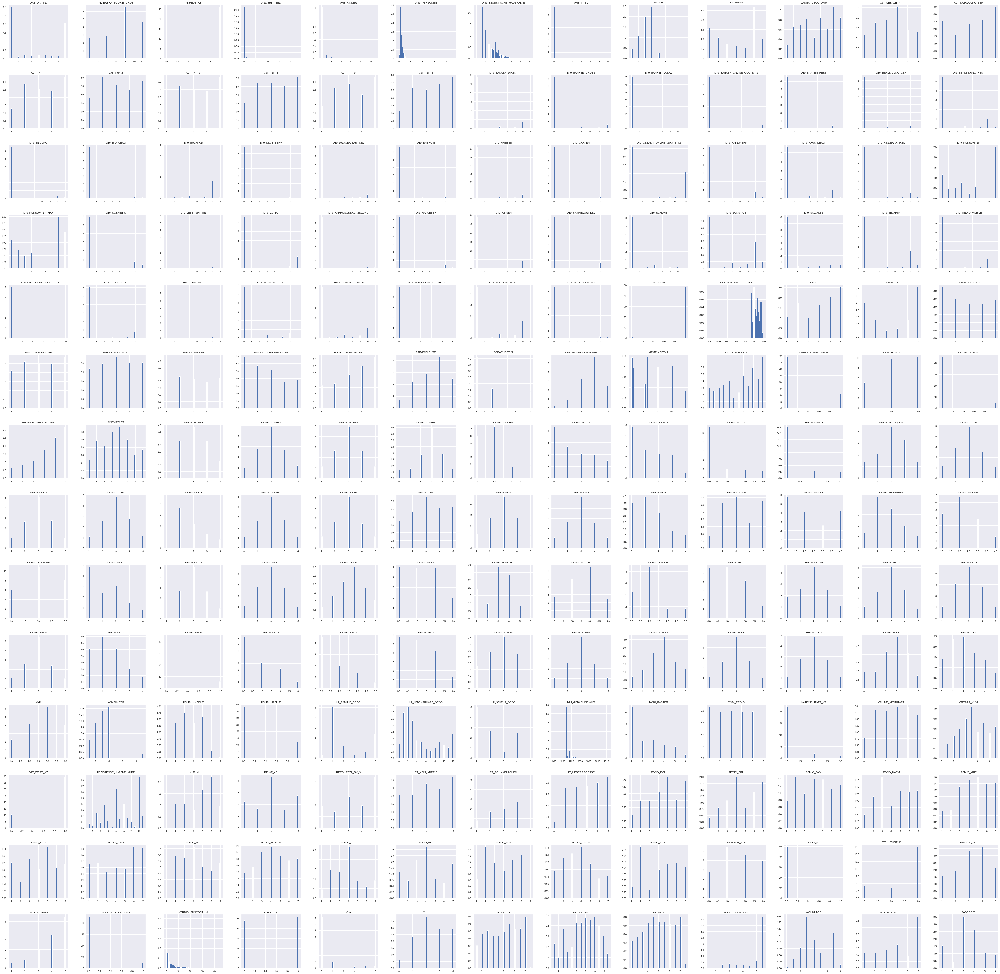

Wall time: 52.6 s


In [571]:
az_feat_hist = azdias.hist(bins=50, figsize=(80,80), density=True)
filepath = "./images/az_feat_hist_fig.png"
plt.savefig(filepath)
print("File stored ...")
print("\033[1mGeneral Population: Features Density Distribution\033[0m")
%time plt.show()

Regarding this feature distribution manually, we append some features to the numerical float list... and have found 1 feature which can be improved. Its scale could be divided by 10 to fit into the range of most other features.

In [572]:
# 'GEMEINDETYP' - means community type (habits)
azdias['GEMEINDETYP'].unique()

array([22., 40., 21., 12., 30., 11., 50., nan])

In [573]:
customers['GEMEINDETYP'].unique()

array([50., 40., 22., 12., 30., 21., 11., nan])

In [574]:
azdias.loc[:, 'GEMEINDETYP'] /= 10 

In [575]:
azdias['GEMEINDETYP'].unique()

array([2.2, 4. , 2.1, 1.2, 3. , 1.1, 5. , nan])

In [576]:
customers.loc[:, 'GEMEINDETYP'] /= 10 

So, our final numerical float list is...

In [577]:
az_clm_highcard.append('GEMEINDETYP') 

In [578]:
az_clm_highcard

['ANZ_STATISTISCHE_HAUSHALTE',
 'VERDICHTUNGSRAUM',
 'EINGEZOGENAM_HH_JAHR',
 'MIN_GEBAEUDEJAHR',
 'ANZ_PERSONEN',
 'ANZ_HH_TITEL',
 'ANZ_KINDER',
 'ANZ_TITEL',
 'GEMEINDETYP']

As mentioned, the features 'EINGEZOGENAM_HH_JAHR', 'MIN_GEBAEUDEJAHR' are ranked categorical date values stored as float.

We normalise or standardise them explicitly and remove them from the high, cardinality feature list. We can use e.g. the MinMaxScaler with feature range (0, 1) for normalisation. Or if their distribution is a Gaussian one, we can use the StandardScaler as well. As we have seen already this is not the case.

For normalisation/standardisation have in mind that the date value has to be converted to timestamp number first. This is only possible if they are datetime objects.

In [579]:
# set approach is faster compared to usage of
# filter() method with filter(lambda x: x not in b, a) or
# comprehension approach with [x for x in a if x not in b]
# with a - source list, b - remove list

cat_date_feat = ['EINGEZOGENAM_HH_JAHR', 'MIN_GEBAEUDEJAHR']
az_clm_highcard = list(set(az_clm_highcard)-set(cat_date_feat))

In [580]:
azdias[cat_date_feat].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 792376 entries, 0 to 792375
Data columns (total 2 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   EINGEZOGENAM_HH_JAHR  792376 non-null  float64
 1   MIN_GEBAEUDEJAHR      792376 non-null  float64
dtypes: float64(2)
memory usage: 12.1 MB


In [581]:
customers[cat_date_feat].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 139601 entries, 0 to 139600
Data columns (total 2 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   EINGEZOGENAM_HH_JAHR  139601 non-null  float64
 1   MIN_GEBAEUDEJAHR      139601 non-null  float64
dtypes: float64(2)
memory usage: 2.1 MB


In [582]:
azdias[cat_date_feat[0]]

0         2004.0
1         2000.0
2         1998.0
3         2004.0
4         1994.0
           ...  
792371    2014.0
792372    1999.0
792373    2013.0
792374    1998.0
792375    2015.0
Name: EINGEZOGENAM_HH_JAHR, Length: 792376, dtype: float64

In [583]:
azdias[cat_date_feat[0]].astype(str).unique()

array(['2004.0', '2000.0', '1998.0', '1994.0', '2005.0', '2007.0',
       '2009.0', '2016.0', '2014.0', '2015.0', '2013.0', '2008.0',
       '2010.0', '2001.0', '2002.0', '1997.0', '2012.0', '1999.0',
       '1996.0', '1995.0', '2011.0', '2003.0', '2006.0', '1991.0',
       '2017.0', '1993.0', '2018.0', '1992.0', '1989.0', '1990.0',
       '1987.0', '1986.0', '1988.0', '1900.0', '1904.0', '1971.0',
       '1984.0'], dtype=object)

In [584]:
pd.to_datetime(azdias[cat_date_feat[0]].map('{:.0f}'.format), format='%Y')

0        2004-01-01
1        2000-01-01
2        1998-01-01
3        2004-01-01
4        1994-01-01
            ...    
792371   2014-01-01
792372   1999-01-01
792373   2013-01-01
792374   1998-01-01
792375   2015-01-01
Name: EINGEZOGENAM_HH_JAHR, Length: 792376, dtype: datetime64[ns]

Converting the **date features** ...

First, we modify the float values to datetime64 ones.

In [585]:
length = len(cat_date_feat)
for i in range(0, length):
    # with coerce wrong values, like negative ones, are mapped to NaT
    # float part .0 must be removed to get an int-like string or conversion is not working (throws errors)
    azdias[cat_date_feat[i]] = pd.to_datetime(azdias[cat_date_feat[i]].map('{:.0f}'.format), format='%Y', errors='coerce')

azdias[cat_date_feat]

,EINGEZOGENAM_HH_JAHR,MIN_GEBAEUDEJAHR
0,2004-01-01,1992-01-01
1,2000-01-01,1992-01-01
2,1998-01-01,1997-01-01
3,2004-01-01,1992-01-01
4,1994-01-01,1992-01-01
...,...,...
792371,2014-01-01,1992-01-01
792372,1999-01-01,1992-01-01
792373,2013-01-01,1992-01-01
792374,1998-01-01,1992-01-01


Now, we do the same for the customers dataset.

In [586]:
for i in range(0, length):
    # with coerce wrong values, like negative ones, are mapped to NaT
    # float part .0 must be removed to get an int-like string or conversion is not working (throws errors)
    customers[cat_date_feat[i]] = pd.to_datetime(customers[cat_date_feat[i]].map('{:.0f}'.format), format='%Y', errors='coerce')

customers[cat_date_feat]

,EINGEZOGENAM_HH_JAHR,MIN_GEBAEUDEJAHR
0,1994-01-01,1992-01-01
1,1997-01-01,1992-01-01
2,1997-01-01,1992-01-01
3,1994-01-01,1992-01-01
4,1994-01-01,1992-01-01
...,...,...
139596,1994-01-01,1992-01-01
139597,2002-01-01,1997-01-01
139598,1997-01-01,1992-01-01
139599,1997-01-01,1992-01-01


Now, we do the timestamp conversion ... but first we create dataset copies to be safe if something went wrong.

In [588]:
# take care of the modification status existing by now
azdias_mod2 = azdias.copy()
customers_mod2 = customers.copy()

In [589]:
azdias['EINGEZOGENAM_HH_JAHR'].head(3)

0   2004-01-01
1   2000-01-01
2   1998-01-01
Name: EINGEZOGENAM_HH_JAHR, dtype: datetime64[ns]

In [590]:
pd.Timestamp(np.datetime64(azdias['EINGEZOGENAM_HH_JAHR'].iloc[1])).timestamp()

946684800.0

In [592]:
def convert_to_timestamp(date_val):
    '''Conversion of the datetime objects to POSIX timestamp values as float.'''
    if not pd.isnull(date_val):
        return pd.Timestamp(np.datetime64(date_val)).timestamp()

for i in range(0, length):
    # Conversion of the datetime objects to POSIX timestamp values and NaT values are changed to NaN.
    azdias[cat_date_feat[i]] = azdias[cat_date_feat[i]].apply(lambda x: convert_to_timestamp(x))

azdias[cat_date_feat]

,EINGEZOGENAM_HH_JAHR,MIN_GEBAEUDEJAHR
0,1.072915e+09,694224000.0
1,9.466848e+08,694224000.0
2,8.836128e+08,852076800.0
3,1.072915e+09,694224000.0
4,7.573824e+08,694224000.0
...,...,...
792371,1.388534e+09,694224000.0
792372,9.151488e+08,694224000.0
792373,1.356998e+09,694224000.0
792374,8.836128e+08,694224000.0


Now we do the same for the customers dataset.

In [593]:
for i in range(0, length):
    # Conversion of the datetime objects to POSIX timestamp values and NaT values are changed to NaN.
    customers[cat_date_feat[i]] = customers[cat_date_feat[i]].apply(lambda x: convert_to_timestamp(x))

customers[cat_date_feat]

,EINGEZOGENAM_HH_JAHR,MIN_GEBAEUDEJAHR
0,7.573824e+08,694224000.0
1,8.520768e+08,694224000.0
2,8.520768e+08,694224000.0
3,7.573824e+08,694224000.0
4,7.573824e+08,694224000.0
...,...,...
139596,7.573824e+08,694224000.0
139597,1.009843e+09,852076800.0
139598,8.520768e+08,694224000.0
139599,8.520768e+08,694224000.0


And our binary list is (only 2 numbers and perhaps nan) ...

In [605]:
azdias['ANREDE_KZ'].unique()

array([2, 1], dtype=int64)

In [606]:
customers['ANREDE_KZ'].unique()

array([1, 2], dtype=int64)

In [611]:
azdias['VERS_TYP'].unique()

array([ 2.,  1., nan])

In [612]:
customers['VERS_TYP'].unique()

array([ 1.,  2., nan])

In [613]:
azdias['GREEN_AVANTGARDE'].unique()

array([0, 1], dtype=int64)

In [614]:
customers['GREEN_AVANTGARDE'].unique()

array([1, 0], dtype=int64)

In [603]:
azdias['DSL_FLAG'].unique()

array([1., 0.])

In [604]:
customers['DSL_FLAG'].unique()

array([1., 0.])

In [607]:
azdias['HH_DELTA_FLAG'].unique()

array([ 0., nan,  1.])

In [608]:
customers['HH_DELTA_FLAG'].unique()

array([ 0., nan,  1.])

In [609]:
azdias['UNGLEICHENN_FLAG'].unique()

array([1., 0.])

In [610]:
customers['UNGLEICHENN_FLAG'].unique()

array([0., 1.])

In [595]:
azdias['KBA05_SEG6'].unique()

array([ 1.,  0., nan])

In [596]:
customers['KBA05_SEG6'].unique()

array([ 1.,  0., nan])

In [597]:
azdias['KONSUMZELLE'].unique()

array([ 1.,  0., nan])

In [598]:
customers['KONSUMZELLE'].unique()

array([0., 1.])

In [599]:
azdias['SOHO_KZ'].unique()

array([1., 0.])

In [600]:
customers['SOHO_KZ'].unique()

array([0., 1.])

In [619]:
clm_bin = ['ANREDE_KZ', 'KBA05_SEG6', 'OST_WEST_KZ', 'HH_DELTA_FLAG', 'VERS_TYP',
           'KONSUMZELLE', 'SOHO_KZ', 'DSL_FLAG', 'GREEN_AVANTGARDE']

#### 3.4.2 Boxplot Distribution of the Highcard Features

In [620]:
df_az_highcard = azdias[az_clm_highcard]
df_az_highcard.head()

,ANZ_TITEL,ANZ_PERSONEN,ANZ_KINDER,GEMEINDETYP,VERDICHTUNGSRAUM,ANZ_HH_TITEL,ANZ_STATISTISCHE_HAUSHALTE
0,0.0,2.0,0.0,2.2,0.0,0.0,2.564949
1,0.0,1.0,0.0,2.2,1.0,0.0,2.079442
2,0.0,0.0,0.0,4.0,0.0,0.0,1.098612
3,0.0,4.0,0.0,2.1,1.0,0.0,1.386294
4,0.0,1.0,0.0,4.0,0.0,0.0,1.098612


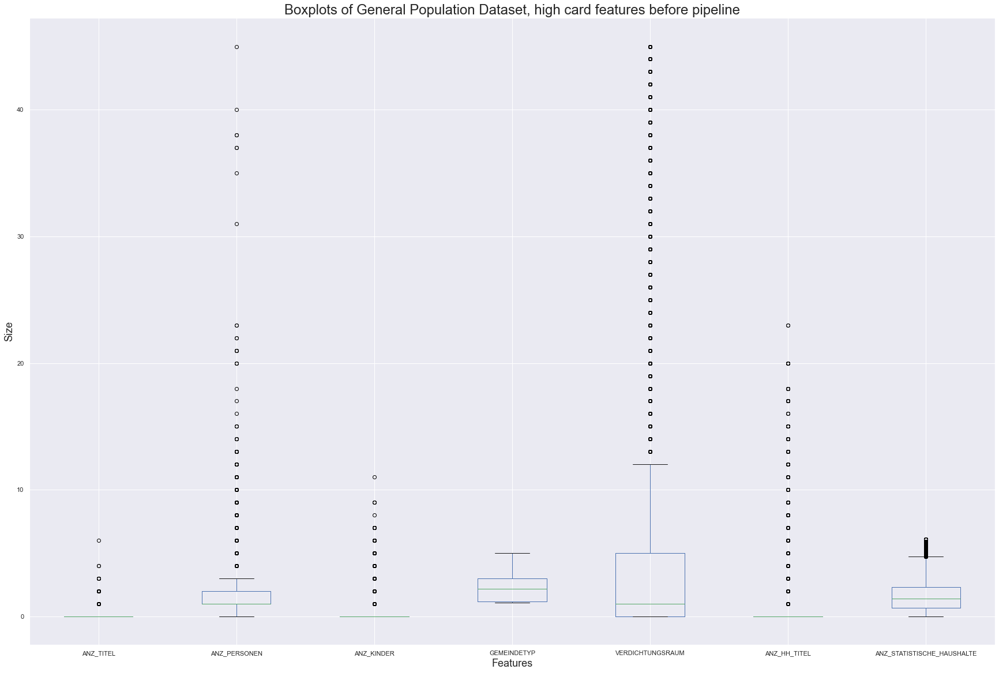

In [625]:
df_az_highcard.plot(kind='box', figsize=(30, 20))
plt.ylabel('Size', fontsize=18)
plt.xlabel('Features', fontsize=18)
plt.title('Boxplots of General Population Dataset, high card features before pipeline', fontsize=24);

Obviously as expected, not all feature boxplots median values are around 0, and there are features having prominent outliers with a much higher range compared to the other features. Scaling is necessary before dimensionality reduction takes place.

In [416]:
# time consuming
#%time pd.plotting.scatter_matrix(frame=azdias, alpha=0.5, figsize=(80,80), diagonal='kde')

In [ ]:
# make copies of the cleaned datasets
df_az_cleaned = azdias
df_cstm_cleaned = customers

### 3.5 ColumnsTransformer and Pipeline Approach

In general, first try has been the ColumnTransformer and pipeline approach together with cross-validation for hyperparamter tuning, because the parameters for dimensionality reduction and clustering are unknown. This would deliver the best estimator parameters, but also 32GB RAM the machine crashed. This approach is possible with ML cloud services, but I don't have a stable internet connection because of the overall situation.

So, using my own equipment, the single tasks have to be separated to get the best parameters.

In [627]:
num_feat = az_clm_highcard
print('num_feat are:\n{}\n'.format(num_feat))
bin_feat = clm_bin
print('bin_feat are:\n{}\n'.format(bin_feat))
date_feat = cat_date_feat
print('date_feat are:\n{}\n'.format(date_feat))
cat_feat = azdias.columns[~azdias.columns.isin(num_feat and bin_feat and date_feat)]
print('cat_feat are:\n{}'.format(cat_feat))

num_feat are:
['ANZ_TITEL', 'ANZ_PERSONEN', 'ANZ_KINDER', 'GEMEINDETYP', 'VERDICHTUNGSRAUM', 'ANZ_HH_TITEL', 'ANZ_STATISTISCHE_HAUSHALTE']

bin_feat are:
['ANREDE_KZ', 'KBA05_SEG6', 'OST_WEST_KZ', 'HH_DELTA_FLAG', 'VERS_TYP', 'KONSUMZELLE', 'SOHO_KZ', 'DSL_FLAG', 'GREEN_AVANTGARDE']

date_feat are:
['EINGEZOGENAM_HH_JAHR', 'MIN_GEBAEUDEJAHR']

cat_feat are:
Index(['AKT_DAT_KL', 'ANZ_HH_TITEL', 'ANZ_KINDER', 'ANZ_PERSONEN',
       'ANZ_STATISTISCHE_HAUSHALTE', 'ANZ_TITEL', 'ARBEIT', 'BALLRAUM',
       'CAMEO_DEUG_2015', 'CJT_GESAMTTYP',
       ...
       'VHN', 'VK_DHT4A', 'VK_DISTANZ', 'VK_ZG11', 'W_KEIT_KIND_HH',
       'WOHNDAUER_2008', 'WOHNLAGE', 'ZABEOTYP', 'ANREDE_KZ',
       'ALTERSKATEGORIE_GROB'],
      dtype='object', length=180)


The datetime objects are already converted to timestamp values as needed for the MinMaxScaler instance and its feature range from 0 to 1.

In [628]:
cat_feat.to_list()

['AKT_DAT_KL',
 'ANZ_HH_TITEL',
 'ANZ_KINDER',
 'ANZ_PERSONEN',
 'ANZ_STATISTISCHE_HAUSHALTE',
 'ANZ_TITEL',
 'ARBEIT',
 'BALLRAUM',
 'CAMEO_DEUG_2015',
 'CJT_GESAMTTYP',
 'CJT_KATALOGNUTZER',
 'CJT_TYP_1',
 'CJT_TYP_2',
 'CJT_TYP_3',
 'CJT_TYP_4',
 'CJT_TYP_5',
 'CJT_TYP_6',
 'D19_BANKEN_DIREKT',
 'D19_BANKEN_GROSS',
 'D19_BANKEN_LOKAL',
 'D19_BANKEN_ONLINE_QUOTE_12',
 'D19_BANKEN_REST',
 'D19_BEKLEIDUNG_GEH',
 'D19_BEKLEIDUNG_REST',
 'D19_BILDUNG',
 'D19_BIO_OEKO',
 'D19_BUCH_CD',
 'D19_DIGIT_SERV',
 'D19_DROGERIEARTIKEL',
 'D19_ENERGIE',
 'D19_FREIZEIT',
 'D19_GARTEN',
 'D19_GESAMT_ONLINE_QUOTE_12',
 'D19_HANDWERK',
 'D19_HAUS_DEKO',
 'D19_KINDERARTIKEL',
 'D19_KONSUMTYP',
 'D19_KONSUMTYP_MAX',
 'D19_KOSMETIK',
 'D19_LEBENSMITTEL',
 'D19_LOTTO',
 'D19_NAHRUNGSERGAENZUNG',
 'D19_RATGEBER',
 'D19_REISEN',
 'D19_SAMMELARTIKEL',
 'D19_SCHUHE',
 'D19_SONSTIGE',
 'D19_SOZIALES',
 'D19_TECHNIK',
 'D19_TELKO_MOBILE',
 'D19_TELKO_ONLINE_QUOTE_12',
 'D19_TELKO_REST',
 'D19_TIERARTIKEL',
 'D19

In [629]:
len(cat_feat.to_list())

180

#### Single steps

All values are the same, and former experiences doing all activities as single, own steps, resulted in having the same silhouette coefficients and a horizontal 'elbow line'. It seems as if the data has no **cluster tendency**. In general, such information is given by the [Hopkins statistic](https://ieeexplore.ieee.org/document/1375706), which for Python is implemented in the [pyclustertend](https://pypi.org/project/pyclustertend/) library.

Such statistic is explained by IEEE 2004. In their abstract it is said, that the the Hopkins statistic "could be used as a basis to accept or reject the random position hypothesis, which is also the null hypothesis in this case. The Hopkins statistic is known to be a fair estimator of randomness in a data set." 

First, the hypothesis are:
- Null Hypothesis: non-random data leads to uniform distribution, means no clustering tendency available
- Alternative Hypothesis: random data leads to clustering.

If the statistical value is around 0.5, clustering appeared at random. Values >0.7 up to 1 are an investigation result having a high clustering tendency and values <0.3 are a sign of uniform data distribution.

Note: the calculation of the Hopkins statistic has been stopped afte 3 days not being finished.

Before such calculation:<br>
We start with the modified azdias dataset just after imputation. In general, it is proposed to scale the datasets. We do it for the whole dataset, even having different types of data.

In [630]:
num_transformer = Pipeline(steps=[
    ('imp', SimpleImputer(missing_values=np.nan, strategy='median')),
    ('scale', StandardScaler()),
    ])

cat_transformer = Pipeline(steps=[
    ('imp', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
    ('ohe', OneHotEncoder(handle_unknown='ignore')),
    ])

bin_transformer = Pipeline(steps=[
    ('imp', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
    ])

date_transformer = Pipeline(steps=[
    ('imp', SimpleImputer(missing_values=np.nan, strategy='mean')),
    ('scale', MinMaxScaler(feature_range=(0,1)))
    ])
             
# modification of the dataframe columns
preprocessor = ColumnTransformer(
    transformers =[
        ('num_transf', num_transformer, num_feat),
        ('cat_transf', cat_transformer, cat_feat),
        ('bin_transf', bin_transformer, bin_feat),
        ('date_transf', date_transformer, date_feat),
    ], n_jobs=-1)  

imput_scaled_model = Pipeline(steps=[
    ('preproc', preprocessor),
    ])

In [631]:
# training
%time imput_scaled_model.fit(azdias)

Wall time: 44.2 s


Pipeline(memory=None,
         steps=[('preproc',
                 ColumnTransformer(n_jobs=-1, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num_transf',
                                                  Pipeline(memory=None,
                                                           steps=[('imp',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                                 

In [632]:
# after fit and transform it would be:
# https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.csr_matrix.html ;
# with fit it is a pipeline instance
type(imput_scaled_model)

sklearn.pipeline.Pipeline

**Prediction after imputation and scaling**

In [634]:
# have in mind: ColumnTransformer has no predict()
%time az_impt_transform = imput_scaled_model.transform(azdias)

Wall time: 32.2 s


In [635]:
print('Includes the imputed, scaled sparse azdias matrix null items? Answer: {}'.format(None in az_impt_transform.data))

Includes the imputed, scaled sparse azdias matrix null items? Answer: False


In [636]:
az_impt_transform

<792376x1460 sparse matrix of type '<class 'numpy.float64'>'
	with 153261705 stored elements in Compressed Sparse Row format>

In [637]:
cstm_impt_transform = imput_scaled_model.transform(customers)

### Dimensionality Reduction
The first pipeline approach results in PC crashed during fit method after several days.

In [430]:
#dim_svd = TruncatedSVD(n_components = 400, random_state=0)
#dim_pipe = Pipeline(steps=[
#    ('dim_reduced', dim_svd),
#    ])

In [442]:
# specify parameters for grid search
#dim_pipe_param_grid = {
#    'dim_reduced__n_components': [375, 390, 400, 410]
#}

# create grid search object, see doc of https://scikit-learn.org/
# RandomizesSearchCV is faster compared to GridSearchCV
#dim_rsearch_cv_model = RandomizedSearchCV(dim_pipe, param_distributions=dim_pipe_param_grid,
#                                          n_jobs=-1, cv=5, scoring=make_scorer(mean_squared_error),
#                                          return_train_score=True, verbose=2) 

In [ ]:
# train the model with the param combinations
#dim_rsearch_cv_model.fit(az_impt_transform)  #azdias)

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


In [ ]:
#print("\n\n---- Best Parameters after dimensionality reduction: ----\n")
#print("Best score: {:3f}".format(dim_rsearch_cv_model.best_score_))
#print("Best estimators parameters set:")
#best_parameters = dim_rsearch_cv_model.best_estimator_.get_params()
#for param_name in sorted(dim_pipe_param_grid.keys()):
#    print("\t {}: {}".format(param_name, best_parameters[param_name]))

##### Single Parameter Configuration because of Pipeline Equipment Limitations
Because approach before has not been working, we start to find the appropriate components parameter to find 90% explained variance ration sum by implementing single steps.

In [638]:
# first guess: 400 components
svd = TruncatedSVD(n_components=400, n_iter=5, random_state=42)

In [639]:
%time svd.fit(az_impt_transform)

Wall time: 9min 31s


TruncatedSVD(algorithm='randomized', n_components=400, n_iter=5,
             random_state=42, tol=0.0)

In [641]:
print("TruncatedSVD 400 components: explained variance ratio:\n{}".format(svd.explained_variance_ratio_))
print("\nTruncatedSVD 400 components: explained variance ratio sum: {}".format(svd.explained_variance_ratio_.sum()))

TruncatedSVD 400 components: explained variance ratio:
[0.00363036 0.04990506 0.03355454 0.02113698 0.0200125  0.01823073
 0.01768445 0.01527962 0.01153421 0.01130458 0.00977812 0.00949822
 0.00863926 0.0082766  0.00817232 0.00794149 0.00770555 0.00740811
 0.00700857 0.00665038 0.00621285 0.00607071 0.00565011 0.00541879
 0.00534462 0.00512059 0.00499436 0.00474159 0.00453985 0.00448421
 0.00434276 0.00429871 0.00418733 0.00407796 0.00396726 0.0039082
 0.00382444 0.00381043 0.00373324 0.00364791 0.0035766  0.00353492
 0.00343834 0.00338381 0.00334127 0.00328034 0.00321516 0.0032118
 0.00319558 0.00313818 0.00306424 0.00304481 0.00300702 0.00296074
 0.0029385  0.00290958 0.00289208 0.00285382 0.00281689 0.00279042
 0.00278352 0.00276307 0.00272402 0.00272189 0.00270165 0.00269645
 0.00265845 0.0026202  0.00259985 0.0025864  0.00256047 0.0025442
 0.00252245 0.00249908 0.00247002 0.00244166 0.00243589 0.00242902
 0.0024054  0.00239797 0.00237611 0.00236852 0.00235003 0.00234149
 0.0023334

Having a variance ratio sum of 89.53% by 400 components is already great. Will we get 90% with 425 components?

In [643]:
svd_425 = TruncatedSVD(n_components=425, n_iter=5, random_state=42)

In [644]:
%time svd_425.fit(az_impt_transform)

Wall time: 10min 21s


TruncatedSVD(algorithm='randomized', n_components=425, n_iter=5,
             random_state=42, tol=0.0)

In [645]:
#print("TruncatedSVD 425 components: explained variance ratio: {}\n".format(svd_425.explained_variance_ratio_))
print("\nTruncatedSVD 425 components: explained variance ratio sum: {}\n".format(svd_425.explained_variance_ratio_.sum()))


TruncatedSVD 425 components: explained variance ratio sum: 0.9104461325673492



So, this is a total explained variance ratio >90%, therefore we try it again with component value of 410.

In [646]:
svd_410 = TruncatedSVD(n_components=410, n_iter=5, random_state=42)

In [647]:
%time svd_410.fit(az_impt_transform)

Wall time: 9min 45s


TruncatedSVD(algorithm='randomized', n_components=410, n_iter=5,
             random_state=42, tol=0.0)

In [648]:
#print("TruncatedSVD 410 components: explained variance ratio: {}\n".format(svd_410.explained_variance_ratio_))
print("\nTruncatedSVD 410 components: explained variance ratio sum: {}\n".format(svd_410.explained_variance_ratio_.sum()))


TruncatedSVD 410 components: explained variance ratio sum: 0.901534200237406



That's it! 410 is the component number we need for our goal to reach a summarised variance ratio of 90%. With that number we are a little bit higher.

In [649]:
%time az_svd_transform = svd_410.transform(az_impt_transform)

Wall time: 27.7 s


In [650]:
%time cstm_svd_transform = svd_410.transform(cstm_impt_transform)

Wall time: 4.97 s


### Clustering for Customer Segmentation
We don't know the best cluster number. To identify the best amount of clusters, we calculate some metrics of the given cluster models MiniBatchKMeans instance.

E.g. **inertia** is the sum of squared distances of observations to their closest cluster centre which is also called within-cluster variation. Its value decreases while the amount of clusters increases.<br>
**distortion** is the average of the squared distances between observationd to the cluster centers of the associated clusters. Typically, the Euclidean distance metric is used. 

For this metrics and the silhouette coefficients used for verification afterwards, we need the imputed and further modified, dimensionality reduced dataset, which has been calculated during the pipeline process before. The silhouette index (overall average silhouette) interpretation: a larger silhouette value indicates a better quality of a clustering result, [Chen et al. 2002, e.g. chapter 4.2](http://rulai.cshl.edu/reprints/Clust_cmp_SS02.pdf).

In [ ]:
@timer
def create_clustering_metrics(n_clusters)
    '''
    This function creates the metrics
        - distortion
        - inertia and
        - silhouette scores
    by using MiniBatchKMeans instances build for a range from 2 to a given number of cluster maximum.
    
    
    '''

    # these calculations take a while (a lot of days), we add a progressbar and percentage of calculated tasks
    distortions = []
    inertias = []
    silh_scores = []
    cluster_dist_dict = {}
    cluster_inert_dict = {}
    cluster_silhscore_dict = {}
    n_clusters = n_clusters

    cnter = 0
    bar = progressbar.ProgressBar(maxval=n_clusters,
                                  widgets=[progressbar.Bar('=', '[]', ']'), ' ', progressbar.Percentage()])
    bar.start()

    for i in range(2, n_clusters):
        cluster_model = MiniBatchKMeans(n_clusters=i, random_state=42) # random numbers; defaults: 8 and None
        cluster_model.fit(az_svd_transform)
        labels = cluster_model.labels_
        silh_score = metrics.silhouette_score(az_svd_transform, labels, metric = 'euclidean')
        silh_scores.append(silh_score)
        inertias.append(cluster_model.inertia_)
        dist_value = sum(np.min(cdist(az_svd_transform, cluster_model.cluster_centers_, 'euclidean'), axis=1)) / az_svd_transform.shape[0]
        distortions.append(dist_value)
        cluster_dist_dict[i] = dist_value
        cluster_inert_dict[i] = cluster_model.inertia_
        cluster_silhscore_dict[i] = silh_score

    bar.finish()

    return distortions, inertias, silh_scores, cluster_dist_dict, cluster_inert_dict, cluster_silhscore_dict, labels

In [ ]:
distortions, inertias, silh_scores, cluster_dist_dict, cluster_inert_dict, cluster_silhscore_dict, labels = create_clustering_metrics(n_clusters = 60)

In [ ]:
print(labels)

In [ ]:
print(silh_scores)

Cluster 1 distortion: 10.19842157479476
Cluster 2 distortion: 9.981517208975777
Cluster 3 distortion: 9.916915295873036
Cluster 4 distortion: 9.830617987613206
Cluster 5 distortion: 9.80893662936714
Cluster 6 distortion: 9.74632642993965
Cluster 7 distortion: 9.721084204279089
Cluster 8 distortion: 9.71541216560714
Cluster 9 distortion: 9.642609960116992
Cluster 10 distortion: 9.549388536372806
Cluster 11 distortion: 9.538260285891004
Cluster 12 distortion: 9.514761314623778
Cluster 13 distortion: 9.4417271085243
Cluster 14 distortion: 9.44067389744566
Cluster 15 distortion: 9.416432565992615
Cluster 16 distortion: 9.423204896737143
Cluster 17 distortion: 9.382432376084346
Cluster 18 distortion: 9.377581849168076
Cluster 19 distortion: 9.399447973174746
Cluster 20 distortion: 9.326255153538854
Cluster 21 distortion: 9.347758336125997
Cluster 22 distortion: 9.302385315293586
Cluster 23 distortion: 9.293672333150534
Cluster 24 distortion: 9.311163888193313
Cluster 25 distortion: 9.283140

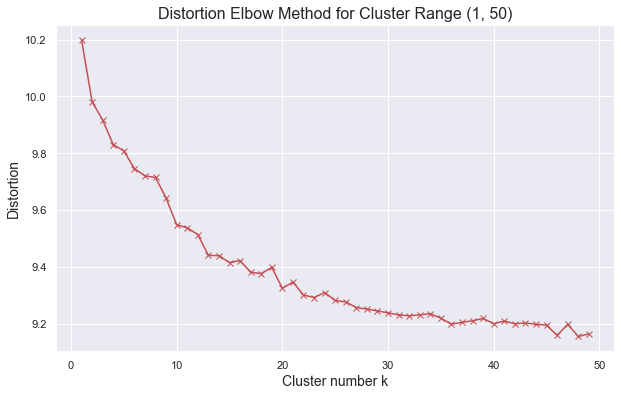

In [661]:
# visualise distortion (ASE)
for k, v in cluster_dist_dict.items():
    print("Cluster {} distortion: {}".format(k, v))
    
plt.figure(figsize=(10,6))
plt.plot(range(2, n_clusters), distortions, 'rx-') # red line with x for each point of the cluster range
plt.xlabel('Cluster number k', fontsize=14)
plt.ylabel('Distortion', fontsize=14)
plt.title('Distortion Elbow Method for Cluster Range (2, {})'.format(n_clusters), fontsize=16)
plt.show()

In [ ]:
# visualise inertia (SSE)
for k, v in cluster_inert_dict.items():
    print("Cluster {} inertia: {}".format(k, v))
    
plt.figure(figsize=(10,6))
plt.plot(range(2, n_clusters), inertias, 'bo-') # red line with x for each point of the cluster range
plt.xlabel('Cluster number k', fontsize=14)
plt.ylabel('Inertia', fontsize=14)
plt.title('Inertia Elbow Method for Cluster Range (2, {})'.format(n_clusters), fontsize=16)
plt.show()

Regarding our distortion and inertia elbow plots: the optimal cluster numbers seems to be 36, 40, 46 or 48, which are values of cluster k at the <i>elbow</i> after which the distortion resp. inertia calculations start to decrease in a linear manner.

We can verify this clustering result by further investigation and visualisation of the calculated silhouette coefficients.

In [ ]:
# visualise silhouette scores
for k, v in cluster_silhscore_dict.items():
    print("Cluster {} silhouette score: {}".format(k, v))

cluster_range = range(2, n_clusters)
plt.figure(figsize=(10,6))
plt.plot(cluster_range, silh_scores)
plt.xlabel('Cluster number k', fontsize=14)
plt.ylabel('Silhouette score', fontsize=14)
plt.title('Silhouette scores for Cluster Range(2, {})'.format(n_clusters), fontsize=16)
plt.show()
 
opt_clusters_no = cluster_range[silh_scores.index(max(silh_scores))]
print("According silhouette score optimal cluster number k is: {}".format(opt_clusters_no))

Visualise the clusters data points ...

In [ ]:
from yellowbrick.features import Manifold

# Instantiate the visualizer
viz = Manifold(manifold="tsne", classes=labels, target_type = 'discrete', random_state=42)
viz.fit_transform(az_svd_transform)  # Fit the data to the visualizer
viz.show() 

Is the clustering result more prominent by using an **KMeans** object instance instead of MiniBatchKMeans?<br>
To answer this question we use the yellobrick library for visualisation.

In [ ]:
from yellowbrick.cluster.elbow import kelbow_visualizer

# Use the quick method and immediately show the figure
kelbow_visualizer(KMeans(random_state=4), az_svd_transform, k=(2,60))

In [ ]:
from yellowbrick.cluster import silhouette_visualizer

# Use the quick method and immediately show the figure
silhouette_visualizer(KMeans(60, random_state=42), az_svd_transform, colors='yellowbrick')

Visualisation of the data points of the clusters.

ALL PARTS BELOW are not usablen by now: have been used before with and without ohe ...

### Overall Pipeline Approach for Transformation, Dimensionality Reduction and Clustering
Cross validation is used to find appropriate hyperparameter configurations.

Note: This is not working because of equipment limitations!

In [334]:
# see:
# https://scikit-learn.org/dev/modules/generated/sklearn.pipeline.Pipeline.html#sklearn.pipeline.Pipeline
num_transformer = Pipeline(steps=[
    ('imp', SimpleImputer(missing_values=np.nan, strategy='median')),
    ('scale', StandardScaler()),
])

cat_transformer = Pipeline(steps=[
    ('imp', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
    ('ohe', OneHotEncoder(handle_unknown='ignore')),
])

bin_transformer = Pipeline(steps=[
    ('imp', SimpleImputer(missing_values=np.nan, strategy='most_frequent')),
])

date_transformer = Pipeline(steps=[
    ('imp', SimpleImputer(missing_values=np.nan, strategy='mean')),
    ('scale', MinMaxScaler(feature_range=(0,1)))
])
             
# modification of the dataframe columns
preprocessor = ColumnTransformer(
    transformers =[
        ('num_transf', num_transformer, num_feat),
        ('cat_transf', cat_transformer, cat_feat),
        ('bin_transf', bin_transformer, bin_feat),
        ('date_transf', date_transformer, date_feat,)
], n_jobs=-1)  
            
# feature dimensionality reduction and clustering of the datasets
# PCA variance is set to 85% and cluster number to 5 as a test value to see what happens,
# not having only 1 cluster
# PCA cannot be used: error message about having a sparse metric appeared
# proposed is TruncatedSVD
# first: I will try SparsePCA (see if total variance as n_components is possible)
# thrown is: TypeError: A sparse matrix was passed, but dense data is required. Use X.toarray() to convert to a dense numpy array.
# second: try TruncatedSVD with n_components value as best guess getting a total variance between 85% and 90%
# third: tried to use this pipeline with cross validation param setting, with 32GB RAM: process crashed

n_clusters = 45
cluster_pipe_model = Pipeline(steps=[
    ('preproc', preprocessor),
    ('dim_reduced', TruncatedSVD(n_components = 400, random_state=0)),
    ('cluster_mbkmeans', MiniBatchKMeans(n_clusters=n_clusters, random_state=0)),
    #('cluster_gauss_mix', GaussianMixture(random_state=0)),
])

In [335]:
# the get model part of the training data to generate the learning parameters
%time cluster_pipe_model.fit(azdias)

Wall time: 29min 48s


Pipeline(memory=None,
         steps=[('preproc',
                 ColumnTransformer(n_jobs=None, remainder='drop',
                                   sparse_threshold=0.3,
                                   transformer_weights=None,
                                   transformers=[('num_transf',
                                                  Pipeline(memory=None,
                                                           steps=[('imp',
                                                                   SimpleImputer(add_indicator=False,
                                                                                 copy=True,
                                                                                 fill_value=None,
                                                                                 missing_values=nan,
                                                                                 strategy='median',
                                                               

In [336]:
cluster_pipe_model.named_steps['preproc']

ColumnTransformer(n_jobs=None, remainder='drop', sparse_threshold=0.3,
                  transformer_weights=None,
                  transformers=[('num_transf',
                                 Pipeline(memory=None,
                                          steps=[('imp',
                                                  SimpleImputer(add_indicator=False,
                                                                copy=True,
                                                                fill_value=None,
                                                                missing_values=nan,
                                                                strategy='median',
                                                                verbose=0)),
                                                 ('scale',
                                                  StandardScaler(copy=True,
                                                                 with_mean=True,
                         

**Improve the Pipeline Model by Hyperparameter Cross-Validation**

In [ ]:
cluster_pipe_model.get_params()

In [335]:
# specify parameters for grid search
cluster_pipe_param_grid = {
    'dim_reduced__n_components': [350, 375, 400],
    'cluster_mbkmeans__n_clusters': [30, 35, 40, 45, 50],
}

# create grid search object, see doc of https://scikit-learn.org/
# RandomizesSearchCV is faster compared to GridSearchCV
rsearch_cv_model = RandomizedSearchCV(cluster_pipe_model, param_distributions=cluster_pipe_param_grid,
                                      n_jobs=-1, cv=5,
                                      return_train_score=True, verbose=2)

In [ ]:
# train the model with the param combinations
rsearch_cv_model.fit(azdias)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.


In [ ]:
print("\n\n---- Best Parameters: ----\n")
print("Best score: {:3f}".format(rsearch_cv_model.best_score_))
print("Best estimators parameters set:")
best_parameters = rsearch_cv_model.best_estimator_.get_params()
for param_name in sorted(cluster_pipe_param_grid.keys()):
    print("\t {}: {}".format(param_name, best_parameters[param_name]))

Build the model with the optimised parameters...

In [ ]:
n_clusters = ...
opt_cluster_pipe_model = Pipeline(steps=[
    ('preproc', preprocessor),
    ('dim_reduced', TruncatedSVD(n_components = ..., random_state=0)),
    ('cluster_mbkmeans', MiniBatchKMeans(n_clusters=n_clusters, random_state=0)),
    #('cluster_gauss_mix', GaussianMixture(random_state=0)),
])

In [338]:
# transform the datasets
%time az_vectorised = opt_cluster_pipe_model.transform(azdias)  # train set

Wall time: 2min 18s


In [ ]:
len(az_vectorised)

In [329]:
%time cstm_vectorised = opt_cluster_pipe_model.transform(customers)  # test set for comparison

Wall time: 39.8 s


In [330]:
cstm_vectorised

array([[14.47259925, 17.50095393, 14.30031281, 15.01004056, 12.56795431],
       [12.95128252,  8.42882636, 12.42799323, 12.77592183, 11.98670828],
       [15.22411053, 16.97622591, 12.90539706, 13.97172499, 13.64816395],
       ...,
       [14.48949294, 16.67960743, 13.72838419, 14.58956226, 12.85784088],
       [14.15914189, 18.23057688, 14.79958917, 15.21540829, 13.90768038],
       [14.0110067 , 17.90502947, 15.39531047, 15.67089909, 13.12313932]])

TODO: Next part is to remember single steps for metric creation ...  delete this coding if not needed anymore !

In [ ]:
# default starting point shall be n_components = 2
def create_clusterer(components, reduced_data):
    ''' 
    Creates and returns a GaussianMixture object instance for the given component number and modified dataset.
    '''
    clusterer = GaussianMixture(n_components = components, random_state = 0).fit(reduced_data)
    return clusterer

In [342]:
# compare few silhouette coefficients to get the best cluster number
@timer
def create_silhouette_coeff(dataset, name, range_max=8):
    '''
    Creates a list of silhouette coefficients to get the best cluster value for the given clusterer model
    and dataset. A dictionary (key=cluster no., value=score of this number) with silhouette values is returned.
    By default 8 is used as maximum range for the cluster components.
    
    Input:
        dataset: the pre-processed, imputed, scaled and dimensionlity reduced dataset
        name: name of the given dataset
        range_max: maximum number of clusters for the range the silhouette coefficients shall be calculated
    Output:
        silhouette_dict: dictionary of silhouette coefficient values for cluster numbers range
        inertia_dict: dictionary of inertia values for cluster numbers range
    '''
    silhouette_dict = {}
    inertia_dict = {}
    
    print("\033[1mSilhouette coefficients of the clusters from '{}' dataset:\033[0m".format(name))
    for comp in range(2, range_max):
        print("range {}".format(comp))

        clusterer = create_clusterer(comp, dataset)
        # Predict the cluster for each data point
        preds = clusterer.predict(dataset)
        print('prediction ready')
        # Find the cluster centers
        centers = clusterer.named_steps['cluster_mbkmeans'].cluster_centers_   
        #means_ leads to AttributeError: 'MiniBatchKMeans' object has no attribute 'means_'
        print('cluster centers means are: {}'.format(centers))
        
        # inertia
        inertia = clusterer.named_steps['cluster_mbkmeans'].inertia_
        print('\n\ncluster interia: {}\n\n'.format(inertia))
        inertia_dict[comp] = inertia

        # Calculate the mean silhouette coefficient for the number of clusters chosen
        # dataset as X is wrong, because it is the one before imputation and includes NaNs,
        # so, silhouette_score throws ValueError
        score = silhouette_score(X = dataset, labels = preds)
        print('Clusterer silhouette score of {} components: {}'.format(comp, score))
        silhouette_dict[comp] = score
        
    return silhouette_dict, inertia_dict

In [ ]:
silhouette_az_dict, intertia_az_dict = create_silhouette_coeff(...azdias_dim_reduced..., 'General Population - azdias', 5)
print("\n\033[1mThe cleaned azdias file cluster scores are:\033[0m")
silhouette_az_dict

<a id='4.'></a>

## 4. Load
Start storing (the scaled and) the PCA reduced datasets (works only with 32GB RAM) ... 

**Note:** With 8GB RAM: After trying this storage few times: cannot be done because of memory errors, system crashed.<br>
ToDo: Try to use compression:<br>
data_df.to_pickle('data_df.pickle.gzde', compression='gzip')


In [409]:
# 8GB RAM: store scaled azdias dataset -  memory error, system crash, so, not possible
# works with 32GB RAM
#try:
#    az_scaled_engine = create_engine('sqlite:///./data/BertelsmannArvato_scaled_azdias_engine.db')
#    df_az_scaled.to_sql('BertelsmannArvato_scaled_az_table', az_scaled_engine, if_exists='replace', index=False)
#except:
#    print("SQL database creation failed. 'BertelsmannArvato_scaled_azdias_engine.db' file has not been created.\n" +
#          "Reason may be: OperationalError: (sqlite3.OperationalError) unable to open database file")

In [658]:
# store dimensionality reduced azdias dataset

#try:
#    az_PCAreduced_engine = create_engine('sqlite:///./data/BertelsmannArvato_PCAreduced_azdias_engine.db')
#    df_az_reduced.to_sql('BertelsmannArvato_PCAreduced_az_table', az_PCAreduced_engine, if_exists='replace', index=False)
#except:
#    print("SQL database creation failed. 'BertelsmannArvato_PCAreduced_azdias_engine.db' file has not been created.\n" +
#          "Reason may be: OperationalError: (sqlite3.OperationalError) unable to open database file")

In [660]:
# store them as csv files
#df_az_reduced.to_csv('./data/df_az_dimreduced.csv', sep=';')

In [497]:
# files exist before starting the imputation, scaling, dim. reduction and clustering
#df_az_cleaned.to_csv('./data/df_az_cleaned.csv', sep=';')
# df_cstm_cleaned.to_csv('./data/df_cstm_cleaned.csv', sep=';')

<a id='5.'></a>

## 5. Customer Segmentation Report

Here, we use unsupervised learning techniques to describe the relationship between the demographics of the company's existing customers and the general population of Germany. By the end of this part, we should be able to describe parts of the general population that are more likely to be part of the mail-order company's main customer base, and which parts of the general population are less so.

For clustering comparison, we choose a **Birch**, a **K-Means** or a **Gaussian Mixture Model** clustering algorithm from [scikit-learn](https://scikit-learn.org/stable/modules/clustering.html#overview-of-clustering-methods) to identify the various customer segments hidden in the data. Other clustering algorithms are given via scikit-learn as well.<br>
Note: even with 32GB RAM **Birch** was not possible, memory errors appeared.

The k-Means clustering algorithm is called **hard clustering** (each data point belongs to a cluster completely or not), while the Gaussian Mixture Model is a **soft clustering** method (for each data point a probability is calculated to be in the given clusters). Both have a centroid and the Gaussian Mixture Model is using an additional covariance matrix. As usual there are advantages and disadvanteges for both models:

- **k-Means clustering** is a method to find clusters and cluster centers in an unlabeled dataset. It is easy to understand and using the <i>MiniBatchKMeans</i> or <i>KMeans</i> from the scikit-learn library are good, performant methods for huge datasets. But the k-Means results depend on the randomly chosen starting points. Furthermore, it is mandatory to configure the number of cluster parameter. In scikit-learn it is by default 8. Because there isn't always a clear spherical data distribution, the cluster number is not always known by having an inhomogenous dataset. Additionally, outliers have a high effect on the clustering. So, e.g. in scikit-learn the algorithm has to be used several times to find the 'best' result, means the lowest value of the sum of cluster variances. 

- The **Gaussian Mixture Model** (GMM) uses mixing proportions to represent the feature density in each cluster. As it is said in the Machine Learning Udacity course 'it is a clustering algorithm that assumes that each cluster follows a certain statistical distribution'. This happens during the 'expectation' step 2 of the algorithm by probability calculation of a specific point membership to a specific cluster and this for all dataset points. This weighted membership values are used to calculate the variances afterwards by step 3 to 're-estimate the parameters for Gaussian Maximisation step'. Step 3 is repeated sequently until the calculations converge into a Gaussian mixture that produces a good result for the problem. Finally, in step 4 the log-likelihood. This value shall be maximised, being sure that the GMM mixer model that we have generated is responsible for creating the existing dataset.

A soft clustering method means, that every point or sample belongs to every cluster we have, but with different membership levels. And this happens here with GMM weighted membership for each cluster. This is not the case for the k-Means method, therefore it is called hard clustering.<br>
The model advantage is that GMM clustering works well on a mixture dataset of several clusters each having a normal distribution and without such method we are not able to 'see' the different clusters, the whole dataset appears as a inhomogenous one. The GMM algorithm is able to find the original cluster boundaries of features with a more flexible shape. As disadvantages, the model is sensitive according parameter initialisation, it can converge to a local optimum and the convergence rate is slow.
    
Even having done the PCA for dimensionality reduction, we work with a multivariate dataset, and because neither clear spherical data distributions are given nor exists only one dataset having one normal distribution, the Gaussian Mixture Model is chosen.

**Cluster Implementation:**<br>
Regarding our PCA reduced datasets, the number of clusters is not known a priori. So, there is no guarantee that a given number of clusters best segments the data, since it is unclear what structure exists in the data — if any. However, we can quantify the "goodness" of a clustering by calculating each data point's [silhouette coefficient](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html). The silhouette coefficient for a data point measures how similar it is to its assigned cluster from -1 (dissimilar) to 1 (similar). Calculating the mean silhouette coefficient provides a simple scoring method of a given clustering.

We list 13 silhouette coefficients for each reduced dataset and see which one is the highest, then using that number for specific clustering afterwards. For the GMM, this silhouette calculation needed days.

Therefore for the k-Means clustering, how do we know which cluster number is the best? We set a number by random. In general, the optimal number can be calculated with the **Elbow method** too. We use the distortion information, where the average of the squared distance from the cluster center of the associated cluster is calculated with the help of Euclidean distance metric. This can be visualised to find the best cluster value at the 'elbow' of the line.

In [664]:
print("Has an imputed, scaled, ohe modified and PCA feature transformed azdias column still NaNs? Answer: {}".
      format(np.any(df_az_reduced.isnull().sum()>0) == True))

Has an imputed, scaled, ohe modified and PCA feature transformed azdias column still NaNs? Answer: False


First, we try the **Birch** algorithm.

In [501]:
# 32GB RAM: memory error: 
# Unable to allocate 2.25 TiB for an array with shape (308644567003,) and data type float64

# Birch: efficient data clustering method for huge datasets
# cluster_model = Birch(threshold=0.05, n_clusters=15) # random numbers; defaults are 0.5 and 3
# cluster_model.fit(df_az_cleaned)
# assign a cluster to the observations
# cluster_rslts = cluster_model.predict(df_az_cleaned)
# clusters = unique(cluster_rslts)

Second, we try the **MiniBatchKMeans** algorithm having a less computation time compared to KMeans directly.
We start to calculate the best cluster number.

In [667]:
n_clusters = 20
cluster_model = MiniBatchKMeans(n_clusters=n_clusters, random_state=0) # random numbers; defaults: 8 and None
cluster_model.fit(df_az_reduced)
cluster_rslts = cluster_model.predict(df_az_reduced)
clusters = np.unique(cluster_rslts)

In [627]:
clusters

array([0])

In [628]:
cluster_rslts

array([0, 0, 0, ..., 0, 0, 0])

In [629]:
cluster_centers = cluster_model.cluster_centers_
cluster_centers

array([[-0.064789  ,  0.02784151, -0.00481529, -0.02085928, -0.00861685,
        -0.01198651, -0.01385929,  0.00738676, -0.00224059,  0.04589604,
         0.00148444,  0.01401447,  0.01029854, -0.00913944,  0.00857296,
         0.00526575, -0.03242319, -0.00728222, -0.02289948,  0.00241868,
         0.03492631,  0.00223379, -0.01005528,  0.01819194,  0.02327503,
         0.00144616,  0.00788855,  0.00349409, -0.02153797, -0.01056007,
        -0.00945401, -0.01108856,  0.00474895, -0.01607734,  0.00447253,
        -0.03059554,  0.02418021,  0.00516656, -0.01890221,  0.02328838,
         0.00196095,  0.00510042, -0.01044904,  0.01646551, -0.00602835,
         0.00974032, -0.003816  , -0.0118409 ,  0.01213826, -0.00978235,
         0.01074469,  0.00799362, -0.02649637, -0.01142631,  0.00099489,
        -0.00155258,  0.0067542 , -0.02220611,  0.0047458 ,  0.01383943,
         0.00851869, -0.00264238,  0.01279719, -0.00989717, -0.01686416,
        -0.00535471, -0.00433155,  0.00287268, -0.0

In [631]:
labels = cluster_model.labels_
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = list(labels).count(-1)

print("Label values: {}".format(labels))
print("Number of clusters: {}".format(n_clusters))
print("Number of noise points: {}".format(n_noise))
# print("Silhouette Coefficient: {:.4}".format(metrics.silhouette_score(df_az_reduced, labels))) # not working with cluster k=1

Label values: [0 0 0 ... 0 0 0]
Number of clusters: 1
Number of noise points: 0


ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3325, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-633-1aaebe69e9d7>", line 25, in <module>
    plt.scatter(xy[:, 0], xy[:, 1], 'w', markerfacecolor=col, marker='.')
  File "C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py", line 2800, in __getitem__
    indexer = self.columns.get_loc(key)
  File "C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexes\base.py", line 2646, in get_loc
    return self._engine.get_loc(key)
  File "pandas\_libs\index.pyx", line 111, in pandas._libs.index.IndexEngine.get_loc
  File "pandas\_libs\index.pyx", line 116, in pandas._libs.index.IndexEngine.get_loc
TypeError: '(slice(None, None, None), 0)' is an invalid key

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-package

TypeError: '(slice(None, None, None), 0)' is an invalid key

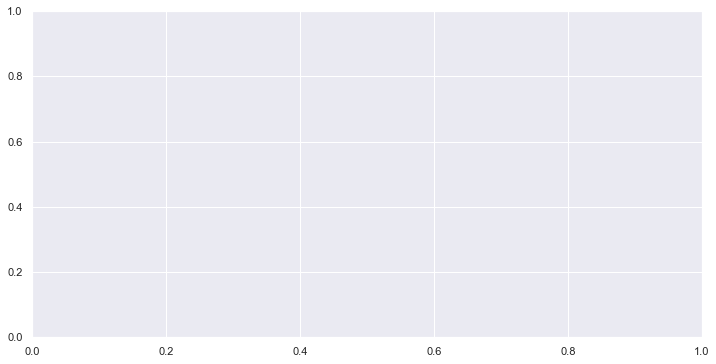

In [633]:
# plot the clusters as scatter diagram
fig, ax = plt.subplots(figsize=(12,6))

colours = []
n = len(clusters)
for i in range(n):
    colours.append('#%06X' % randint(0, 0xFFFFFF))
#print('clusters colours hex values:')
#print(colours)
#print('---------')

cluster_centers = cluster_model.cluster_centers_
clusters_mmbrs_list = []
for cluster, col in zip(clusters, colours):
    # array of all row observation members for each cluster
    cluster_members = np.where(cluster_rslts == cluster)
    #print(cluster_members)
    #print('--  and  values  --')
    #print(cluster_members[0])
    #print('---------')
    #clusters_mmbrs_list.append(cluster_members)
    
    cluster_center = cluster_centers
    xy = pd.DataFrame(data=df_az_reduced, index=cluster_members[0])
    plt.scatter(xy[:, 0], xy[:, 1], 'w', markerfacecolor=col, marker='.')
    #ax.scatter(df_az_cleaned[cluster_members, 0], df_az_cleaned[cluster_members, 1], 'w', markerfacecolor=col, marker='.')
    plt.scatter(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col, markeredgecolor='k', markersize=6)
    
plt.title('MiniBatchKMeans Clustering', fontsize=18)
plt.show()

In [544]:
mbk_means_labels = pairwise_distances_argmin(df_az_cleaned, cluster_centers)
mbk_means_labels

array([ 3,  0,  7, ...,  7,  5, 13], dtype=int64)

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3325, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-634-07c3b1a9acd1>", line 20, in <module>
    ax.plot(df_az_reduced[cluster_members, 0], df_az_reduced[cluster_members, 1], 'w', markerfacecolor=col, marker='.')
  File "C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py", line 2800, in __getitem__
    indexer = self.columns.get_loc(key)
  File "C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexes\base.py", line 2646, in get_loc
    return self._engine.get_loc(key)
  File "pandas\_libs\index.pyx", line 111, in pandas._libs.index.IndexEngine.get_loc
  File "pandas\_libs\index.pyx", line 116, in pandas._libs.index.IndexEngine.get_loc
TypeError: '(array([ True,  True,  True, ...,  True,  True,  True]), 0)' is an invalid key

During handling of the above exception, another exception occurred:

Traceba

TypeError: '(array([ True,  True,  True, ...,  True,  True,  True]), 0)' is an invalid key

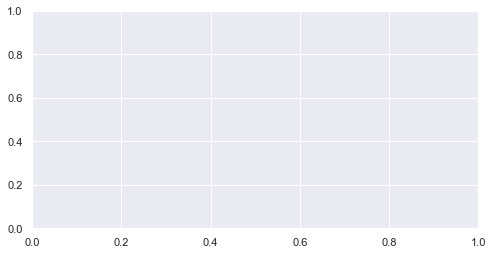

In [634]:
# modified coding from scikit-learn.org comparison of KMeans and MiniBatchKMeans

# plot the clusters as scatter diagram
cluster_centers = cluster_model.cluster_centers_
fig, ax = plt.subplots(figsize=(8,4))

# create hex colour values for each cluster by random
#plt.set_cmap('tab20')
colours = []
n_clusters = len(clusters)
for i in range(n_clusters):
    colours.append('#%06X' % randint(0, 0xFFFFFF))
#print('clusters colours hex values:')
#print(colours)

for k, col in zip(range(n_clusters), colours):
    cluster_members = (cluster_rslts == k)
    cluster_center = cluster_centers[k]
    ax.plot(df_az_reduced[cluster_members, 0], df_az_reduced[cluster_members, 1], 'w', markerfacecolor=col, marker='.')
    ax.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col, markeredgecolor='k', markersize=6)
    
ax.set_xticks(())
ax.set_yticks(())
plt.title('MiniBatchKMeans Clustering', fontsize=18)
plt.show()

In [635]:
predictions = pd.DataFrame(cluster_rslts, columns = ['Cluster'])
plot_data = pd.concat([predictions, df_az_reduced], axis = 1)

In [636]:
plot_data.groupby(['Cluster'])['Cluster'].count()

Cluster
0    785742
Name: Cluster, dtype: int64

Second investigated clustering method is **Gaussian Mixture Model**:<br>
Delivers this clustering method the same result as the k-Means methods before with the reduced azdias dataset?

In [637]:
# default starting point shall be n_components = 2
@timer
def create_clusterer(components, reduced_data):
    clusterer = GaussianMixture(n_components = components, random_state = 0).fit(reduced_data)
    return clusterer

In [638]:
# compare few silhouette coefficients
@timer
def create_silhouette_coeff(reduced_data, name, range_max=8):
    '''
    Creates a list of silhouette coefficients to get the best cluster value for the given reduced dataframe
    and returns it as dictionary (key=cluster no., value=score of this number).
    By default 8 is used as maximum range for the cluster components.
    '''
    GMM_silhouette_dict = {}
    
    print("\033[1mSilhouette coefficients of the PCA reduced '{}' dataset:\033[0m".format(name))
    for comp in range(2, range_max):
        print("range {}".format(comp))
        clusterer = create_clusterer(comp, reduced_data)
        print('clusterer ready')

        # Predict the cluster for each data point
        preds = clusterer.predict(reduced_data)
        print('prediction ready')
        # Find the cluster centers
        centers = clusterer.means_
        print('cluster centers means are: {}'.format(centers))

        # Calculate the mean silhouette coefficient for the number of clusters chosen
        score = silhouette_score(X = reduced_data, labels = preds)
        print('GMM silhouette score of {} components: {}'.format(comp, score))
        GMM_silhouette_dict[comp] = score
        
    return GMM_silhouette_dict

In [639]:
# 8GB RAM: to calcuate this with range max=10, it takes nearly 3 days without ML cloud service
# with 32GB RAM: we use 50 as range maximum randomly
%time GMM_silhouette_az_dict = create_silhouette_coeff(df_az_reduced, 'General Population - azdias', 50)
print("\n\033[1mThe modified, dimensionality reduced azdias file cluster scores are:\033[0m")
GMM_silhouette_az_dict

Silhouette coefficients of the PCA reduced 'General Population - azdias' dataset:
range 2
clusterer ready
prediction ready
cluster centers means are: [[-2.03338603e+00  5.99703043e-01 -1.08707230e+00 -7.60630041e-02
   5.99792951e-02 -8.67663684e-03  4.07830254e-03  1.39513012e-01
   2.19637526e-02  4.94522476e-02 -9.93720915e-02 -3.13794778e-02
  -1.76640062e-02  1.12264537e-01  4.57248544e-02 -8.91734153e-02
  -5.18979307e-02 -9.53170656e-03  4.71102709e-02 -1.22022030e-01
  -7.80365413e-02 -5.13326285e-02 -1.72895873e-01 -8.42305433e-02
   2.34589130e-02  1.90012618e-02 -7.58447669e-02 -8.78820185e-02
  -1.38755324e-02  2.01889234e-02 -1.22513851e-02  2.72157995e-02
   3.41836221e-02 -5.87873931e-02  1.41118400e-03  1.55870485e-02
  -1.46974897e-02 -2.76743377e-02  1.12060657e-02  8.84338748e-04
  -3.14743266e-03  4.88966620e-04  8.26630568e-03  1.06354158e-02
  -8.09547795e-03  6.21262663e-03  1.57162366e-02 -1.29634086e-02
  -2.78096223e-03 -1.05835432e-01 -3.88450938e-02  4.02102

GMM silhouette score of 3 components: 0.017321989493987115
range 4
clusterer ready
prediction ready
cluster centers means are: [[ 3.13532968e+00 -1.68083488e+00  1.07995877e+00  9.23598225e-01
  -1.89500802e-01  5.65847048e-02 -1.72851206e-01 -2.02046946e-01
  -1.40341730e-01  2.43009960e-01 -3.99545579e-01 -2.46640808e-01
  -1.59195055e-01  5.16002954e-02  1.03450041e-01 -1.20497613e-01
  -1.89998716e-01 -1.68497119e-01  7.90424338e-02 -4.44333766e-02
  -9.82728319e-02  2.70215505e-03  2.65308646e-01  9.41434722e-02
  -8.25938462e-02 -1.57378505e-02  1.41213986e-01 -3.27293833e-02
  -1.53210137e-01  1.85790433e-02  1.49876962e-02  6.31062160e-02
   8.35195042e-02 -1.51539861e-01 -1.78340013e-02  1.14488847e-01
   2.75365666e-03 -1.46626627e-01  1.39341234e-02  1.61479076e-02
   1.28385280e-01  1.79735544e-01  3.54735947e-02  2.92401961e-02
   7.00895577e-02  7.64498159e-02 -5.86134166e-02  6.24373966e-02
  -1.11969730e-01 -1.29094449e-01 -5.42291632e-03  3.60563136e-02
   7.80105916e-

GMM silhouette score of 4 components: 0.00947141947708984
Wall time: 11h 7min 6s

The PCA feature cleaned azdias file cluster scores are:


{2: 0.057305156210299135, 3: 0.017321989493987115, 4: 0.00947141947708984}

**First try:**<br>
For the cluster numbers of the reduced general population file df_azdias_reduced the following silhouette coefficients have been caculated (rounded values) for the first run (with 8GB RAM):
- 2 clusters: 0.0507
- 3 clusters: 0.0148
- 4 clusters: 0.0102
- 5 clusters: 0.0033
- 6 clusters: -0.005
- 7 clusters: -0.0006
- 8 clusters: -0.0092
- 9 clusters: -0.0095

The calculation Wall time was: 2d 23h 42min 44s

So, it seems as if clustering has  no added value. This is not as expected, therefore we reinvestigate the preprocessing of the datafiles.

**Second try:**<br>
After modified preprocessing with imputation for floats and integer columns according the excel info file classification and its PCA reduced general population file df_az_reduced, the following silhouette scores have been calculated:
- 2 clusters: 0.0573
- 3 clusters: 0.0173
- 4 clusters: 0.0095

This concluds in having the same insight as before with the first cluster method: the general population azdias file should be used as is after preprocessing.

**Third try:**<br>
After modified preprocessing with imputation for floats and integer columns according the given dtype of the dataframe, selected with the associated dtype pandas functions, and its PCA reduced general population file df_az_reduced, the following silhouette scores have been calculated:




Nevertheless, we try to visualise the azdias clustering with 1 cluster component and combine it with the customers pca samples data.

In [656]:
# let there be 2 clusters
%time clusterer = GaussianMixture(n_components=1, random_state=0).fit(df_az_reduced)
preds = clusterer.predict(df_az_reduced)
centers = clusterer.means_
sample_preds = clusterer.predict(pca_cstm_samples)

Wall time: 3min 6s


In [659]:
predictions = pd.DataFrame(preds, columns = ['Cluster'])
plot_data = pd.concat([predictions, df_az_reduced], axis = 1)
plot_data.head()

,Cluster,Dimension 1,Dimension 2,Dimension 3,Dimension 4,Dimension 5,Dimension 6,Dimension 7,Dimension 8,Dimension 9,Dimension 10,Dimension 11,Dimension 12,Dimension 13,Dimension 14,Dimension 15,Dimension 16,Dimension 17,Dimension 18,Dimension 19,Dimension 20,Dimension 21,Dimension 22,Dimension 23,Dimension 24,Dimension 25,Dimension 26,Dimension 27,Dimension 28,Dimension 29,Dimension 30,Dimension 31,Dimension 32,Dimension 33,Dimension 34,Dimension 35,Dimension 36,Dimension 37,Dimension 38,Dimension 39,Dimension 40,Dimension 41,Dimension 42,Dimension 43,Dimension 44,Dimension 45,Dimension 46,Dimension 47,Dimension 48,Dimension 49,Dimension 50,Dimension 51,Dimension 52,Dimension 53,Dimension 54,Dimension 55,Dimension 56,Dimension 57,Dimension 58,Dimension 59,Dimension 60,Dimension 61,Dimension 62,Dimension 63,Dimension 64,Dimension 65,Dimension 66,Dimension 67,Dimension 68,Dimension 69,Dimension 70,Dimension 71,Dimension 72,Dimension 73,Dimension 74,Dimension 75,Dimension 76,Dimension 77,Dimension 78,Dimension 79,Dimension 80,Dimension 81,Dimension 82,Dimension 83,Dimension 84,Dimension 85,Dimension 86,Dimension 87,Dimension 88,Dimension 89,Dimension 90,Dimension 91,Dimension 92,Dimension 93,Dimension 94,Dimension 95,Dimension 96,Dimension 97,Dimension 98,Dimension 99,Dimension 100,Dimension 101,Dimension 102,Dimension 103,Dimension 104,Dimension 105,Dimension 106,Dimension 107,Dimension 108,Dimension 109,Dimension 110,Dimension 111,Dimension 112,Dimension 113,Dimension 114,Dimension 115,Dimension 116,Dimension 117,Dimension 118,Dimension 119,Dimension 120,Dimension 121,Dimension 122,Dimension 123,Dimension 124,Dimension 125,Dimension 126,Dimension 127,Dimension 128,Dimension 129,Dimension 130,Dimension 131,Dimension 132,Dimension 133,Dimension 134,Dimension 135,Dimension 136,Dimension 137,Dimension 138,Dimension 139,Dimension 140,Dimension 141,Dimension 142,Dimension 143,Dimension 144,Dimension 145,Dimension 146,Dimension 147,Dimension 148,Dimension 149,Dimension 150,Dimension 151,Dimension 152,Dimension 153,Dimension 154,Dimension 155,Dimension 156,Dimension 157,Dimension 158,Dimension 159,Dimension 160,Dimension 161,Dimension 162,Dimension 163,Dimension 164,Dimension 165,Dimension 166,Dimension 167,Dimension 168,Dimension 169
0,0,-4.327258,5.342506,1.150462,-5.056374,1.376737,-5.045116,-2.250701,0.290728,2.558693,0.991796,-0.245337,-1.616600,-0.155341,-1.842055,-1.457511,-0.963521,-3.332568,-0.418761,-1.247204,1.934893,-0.100775,1.188545,-0.116803,-0.342272,1.390787,2.872924,-2.816460,-0.879023,3.577401,-0.287789,-2.686667,0.302700,0.565915,0.023469,-2.233676,-0.662946,-1.131848,0.033751,-1.070186,-0.197060,0.448923,1.288873,-2.435069,-1.614802,1.434863,-0.895314,1.443408,1.558313,4.223107,-0.349038,-0.191451,-0.223399,-1.503519,-1.279492,0.025309,1.603249,-1.084389,0.538448,-0.515411,0.777156,-1.459211,0.087800,0.173445,0.672178,-0.689730,-0.152366,-0.374805,-0.681496,-0.549736,0.390225,1.253522,-1.102325,0.728997,-0.720224,-1.115251,0.572841,0.659123,-0.226854,-1.228290,1.279239,0.402015,0.737870,-0.284487,0.124037,0.488899,0.655773,0.292297,-0.825729,-0.144523,-0.572168,-0.023453,0.691639,-1.126001,-1.180473,1.383081,-0.862018,1.135924,0.353014,-0.496048,-0.091371,1.046163,0.247679,-1.446575,-1.239578,-1.303591,-0.674203,-0.685008,-0.773894,0.164934,0.829203,-0.082468,0.664328,-0.685975,1.579669,-0.417718,-0.223962,-1.797027,0.214126,0.576438,-0.609627,0.157755,-1.232865,-1.030172,-1.228168,-0.161127,0.176928,0.521097,-0.853799,0.942725,-0.038264,0.150681,-0.248089,-1.072418,-0.746679,-1.086202,0.564919,0.311585,0.922613,0.397964,-0.661420,0.887239,1.158116,0.012620,-0.481037,-1.000773,-0.213394,0.296149,-0.767829,0.420895,-0.330070,-0.473152,-1.600349,-0.664113,0.361305,-0.149599,0.527094,-0.451606,0.537910,0.794690,-0.537278,0.215478,0.087195,-0.491637,2.312186,0.367405,-0.142894,0.334905,0.223257,-0.422679
1,0,-0.385560,3.831313,-2.505596,2.102942,2.040402,-0.237594,6.517399,1.437783,-2.121329,-0.211714,-1.322842,0.4954

In [660]:
plot_data.groupby(['Cluster'])['Cluster'].count()

Cluster
0    497214
1    288528
Name: Cluster, dtype: int64

In [674]:
# this function is based on original coding from Udacity ML course, partly modified
@timer 
def cluster_results(reduced_data, preds, centers, pca_samples, only_cluster='no'):
    '''
    Visualizes the PCA-reduced cluster data in the first two dimensions only.
    Adds cues for cluster centers and selected sample data
    '''

    predictions = pd.DataFrame(preds, columns = ['Cluster'])
    plot_data = pd.concat([predictions, reduced_data], axis = 1)

    # Generate the cluster plot
    fig, ax = plt.subplots(figsize = (10,6))
    title = "Cluster Learning on PCA-Reduced General Population Data - Centroids Marked by Number\nVisualisation of Dimensions 1 and 2"

    # Color map
    cmap = cm.get_cmap('gist_rainbow')

    # Color the points based on assigned cluster
    if len(centers) > 1:
        for i, cluster in plot_data.groupby('Cluster'): # cluster is of type DataFrame
            cluster.plot(ax = ax, kind = 'scatter', x = 'Dimension 1', y = 'Dimension 2', \
                         color = cmap((i)*1.0/(len(centers)-1)), label = 'Cluster %i'%(i), s=30);
    else: # 1 cluster with 1 center
        for i, cluster in plot_data.groupby('Cluster'): # cluster is of type DataFrame
            cluster.plot(ax = ax, kind = 'scatter', x = 'Dimension 1', y = 'Dimension 2', \
                         color = cmap(i), label = 'Cluster %i'%(i), s=30);

    # Plot centers with indicators
    for i, c in enumerate(centers):
        ax.scatter(x = c[0], y = c[1], color = 'white', edgecolors = 'black', \
                   alpha = 1, linewidth = 2, marker = 'o', s=200);
        ax.scatter(x = c[0], y = c[1], marker='$%d$'%(i), alpha = 1, s=100);

    # Plot transformed sample points
    if only_cluster == 'no':
        ax.scatter(x = pca_samples[:,0], y = pca_samples[:,1], \
                   s = 150, linewidth = 4, color = 'lightgrey', marker = 'x');
        title = "Cluster Learning on PCA-Reduced General Population Data - Centroids Marked by Number\nVisualisation of Dimensions 1 and 2\nTransformed Customers Sample Data Marked by Grey Cross"

    # Set plot title 
    ax.set_title(title);


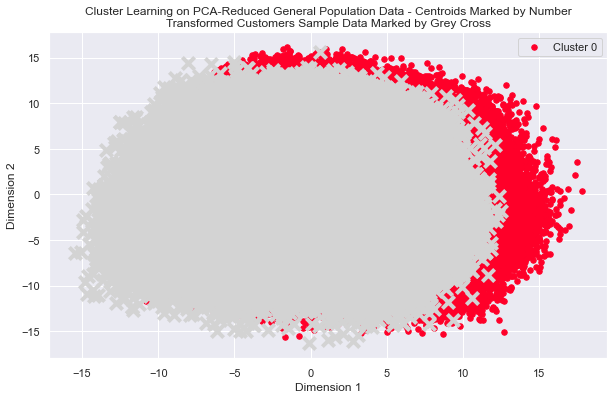

In [673]:
# with customer samples data
cluster_results(df_az_reduced, preds, centers, pca_cstm_samples)

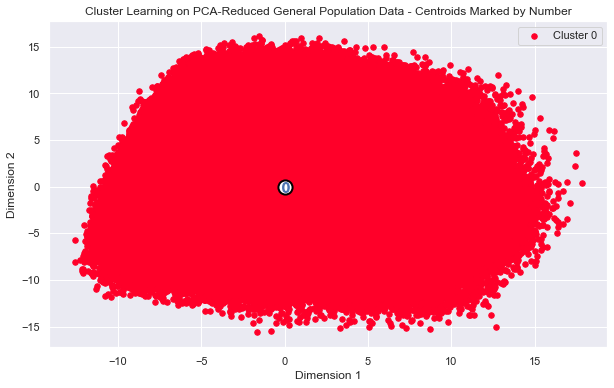

In [675]:
# cluster only
cluster_results(df_az_reduced, preds, centers, pca_cstm_samples, 'cluster')

The general population PCA file is a little bit right shifted compared to the customers PCA file regarding the dimensions 1 and 2.

# Part 2: Supervised Learning Model

Now that you've found which parts of the population are more likely to be customers of the mail-order company, it's time to build a prediction model. Each of the rows in the "MAILOUT" data files represents an individual that was targeted for a mailout campaign. Ideally, we should be able to use the demographic information from each individual to decide whether or not it will be worth it to include that person in the campaign.

The "MAILOUT" data has been split into two approximately equal parts, each with almost 43 000 data rows. In this part, you can verify your model with the "TRAIN" partition, which includes a column, "RESPONSE", that states whether or not a person became a customer of the company following the campaign. In the next part, you'll need to create predictions on the "TEST" partition, where the "RESPONSE" column has been withheld.

In [ ]:
mailout_train = pd.read_csv('./data/Udacity_MAILOUT_052018_TRAIN.csv', sep=';')

# Part 3: Kaggle Competition

Now that you've created a model to predict which individuals are most likely to respond to a mailout campaign, it's time to test that model in competition through Kaggle. If you click on the link [here](http://www.kaggle.com/t/21e6d45d4c574c7fa2d868f0e8c83140), you'll be taken to the competition page where, if you have a Kaggle account, you can enter. If you're one of the top performers, you may have the chance to be contacted by a hiring manager from Arvato or Bertelsmann for an interview!

Your entry to the competition should be a CSV file with two columns. The first column should be a copy of "LNR", which acts as an ID number for each individual in the "TEST" partition. The second column, "RESPONSE", should be some measure of how likely each individual became a customer – this might not be a straightforward probability. As you should have found in Part 2, there is a large output class imbalance, where most individuals did not respond to the mailout. Thus, predicting individual classes and using accuracy does not seem to be an appropriate performance evaluation method. Instead, the competition will be using AUC to evaluate performance. The exact values of the "RESPONSE" column do not matter as much: only that the higher values try to capture as many of the actual customers as possible, early in the ROC curve sweep.

In [ ]:
mailout_test = pd.read_csv('./data/Udacity_MAILOUT_052018_TEST.csv', sep=';')

In [ ]:
# see: https://docs.python.org/3/library/subprocess.html
# for creating a .html file of this notebook, 0 is returned after successful conversion
# from subprocess import call
call(['python', '-m', 'nbconvert', 'Arvato_Project_Workbook_ETL_Unsupervised.ipynb'])